# Rede Multi Layer Percetron (MLP)

In [410]:
import numpy as np
import pandas as pd

Definição dos dados

In [411]:
df = pd.DataFrame(data=np.array([[2, 1.5, 1], [1.66, 1.56, 0], 
                                 [1.3, 1.9, 0], [0.3, 2.1, 0],
                                 [2.3, 0.9, 1], [0.3, 3.1, 0],
                                 [1.7, 0.9, 1], [1.8, 0.3, 1],
                                 [2.5, 1.3, 1], [1.8, 2.1, 0]]), 
                                  index= np.linspace(1,10,10), 
                                  columns=['in1', 'in2', 'out'])
df

,in1,in2,out
1.0,2.00,1.50,1.0
2.0,1.66,1.56,0.0
3.0,1.30,1.90,0.0
4.0,0.30,2.10,0.0
5.0,2.30,0.90,1.0
6.0,0.30,3.10,0.0
7.0,1.70,0.90,1.0
8.0,1.80,0.30,1.0
9.0,2.50,1.30,1.0
10.0,1.80,2.10,0.0


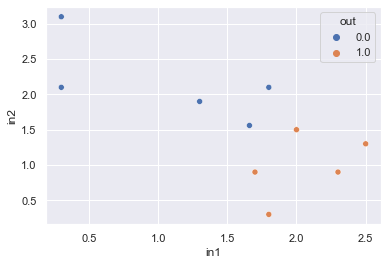

In [412]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.scatterplot(x='in1', y='in2', hue='out', data=df) 
plt.show()

Criação da classe mlp

In [413]:
class mlp(): 
    def __init__(self,learning_rate):
        np.random.seed(0) 
        self.weights = np.array([np.random.randn(), np.random.randn()])
        self.bias = np.random.randn()
        self.learning_rate = learning_rate
    
    
        
    def _sigmoid(self, x):
        return 1 / (1 + np.exp(-x))
    
    def _sigmoid_deriv(self, x):
        return self._sigmoid(x) * (1 - self._sigmoid(x))
    
    def _tangent(x):
        return (np.exp(x)-np.exp(-x))/(np.exp(x)+np.exp(-x)) 
                
    def _tangent_deriv(x):
        return 1 - (_tangent(x))**2
    
    def _predict(self,input_vector,f_ativacao): 
        #def _predict(input_vector, weights, bias, f_ativacao):
        self.layer_1 = np.dot(input_vector, self.weights) + self.bias    
        
        if f_ativacao == 'sigmoide' or  f_ativacao == '':
            self.layer_2 = self._sigmoid(self.layer_1)
        
        else:
            self.layer_2 = mlp._tangent(self.layer_1)
        
        self.prediction =self.layer_2
         
        return self.prediction
    
    def _erro(self,target):
        self.error = (1/2)*(target - self.prediction) ** 2    
        return self.error

    def _compute_gradients(self,input_vector, target, f_ativacao): 
        if f_ativacao == 'sigmoide' or  f_ativacao == '':
            dprediction_dlayer1 = self._sigmoid_deriv(self.layer_1)
        else:
            dprediction_dlayer1 = mlp._tangent_deriv(self.layer_1)
            
        derror_dprediction = self.prediction - target        
        dlayer1_dbias = 1
        dlayer1_dweights = (0 * self.weights) + (1 * input_vector)
        self.derror_dweights = derror_dprediction*dprediction_dlayer1*dlayer1_dweights
        self.derror_dbias = derror_dprediction*dprediction_dlayer1*dlayer1_dbias        
        return self.derror_dweights, self.derror_dbias
    
    def _update_parameters(self):
        self.bias = self.bias - (self.derror_dbias * self.learning_rate)        
        self.weights = self.weights - (self.derror_dweights * self.learning_rate)        
        return self.bias, self.weights 

Aprendizagem da rede usando a classe mlp

In [422]:
import pandas as pd
learning_rate = 0.01
model = mlp(learning_rate)
target = np.array(df['out'])
input_vector = np.array([df['in1'],df['in2']])
gradiente = 0
derror_dweights = 0
derror_dbias = 0
net_error_total = []
net_weights1 = []
net_weights2 = []
net_bias = []
for k in range(2000):
    gradiente = 0
    derror_dweights = 0
    derror_dbias = 0
    error_total = 0
    pred_final =[]
    for i in range(4):         
        pred =model._predict(input_vector[0:2,i],'sigmoide')
        pred_final.append(pred)        
        prediction = pred       
        error = model._erro(target[i])         
        error_total = error_total + error         
        grad = model._compute_gradients(input_vector[0:2,i], target[i], 'sigmoide')
        derror_dweights = derror_dweights + grad[0]
        derror_dbias = derror_dbias +grad[1] 
    net_error_total.append(error_total)    
    atualiza = model._update_parameters()
    bias = atualiza[0]
    weights = atualiza[1]
    net_weights1.append(weights[0])
    net_weights2.append(weights[1])
    net_bias.append(bias)

Geração de graficos

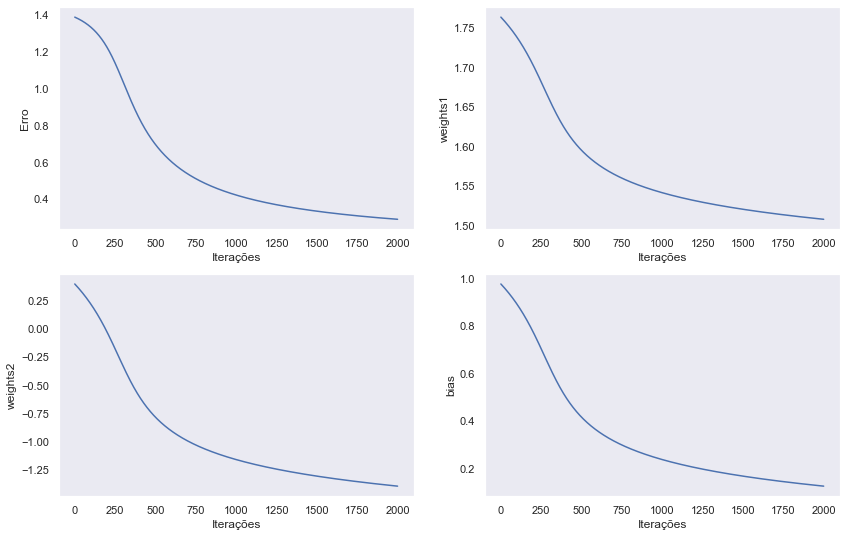

In [423]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 9))

plt.subplot(2,2,1)
plt.plot(net_error_total)
plt.grid()
plt.ylabel('Erro')
plt.xlabel('Iterações')


plt.subplot(2,2,2)
plt.plot(net_weights1)
plt.ylabel('weights1')
plt.xlabel('Iterações')
plt.grid()

plt.subplot(2,2,3)
plt.plot(net_weights2)
plt.ylabel('weights2')
plt.xlabel('Iterações')
plt.grid()

plt.subplot(2,2,4)
plt.plot(net_bias)
plt.ylabel('bias')
plt.xlabel('Iterações')
plt.grid()

In [424]:
for i in range(10):
    pred = model._predict(input_vector[0:2,i],'sigmoide')
    print('Predito= ',pred,'Target= ',target[i])

Predito=  0.7412964735006848 Target=  1.0
Predito=  0.6121750916439331 Target=  0.0
Predito=  0.36359557012619054 Target=  0.0
Predito=  0.08736518666225855 Target=  0.0
Predito=  0.9121755340542341 Target=  1.0
Predito=  0.023236145188277754 Target=  0.0
Predito=  0.8077878643968566 Target=  1.0
Predito=  0.918480375311308 Target=  1.0
Predito=  0.8894535061753586 Target=  1.0
Predito=  0.4789480202834327 Target=  0.0


Criação da classe mlp2
<img src="files/MLP2.png" width="500" height="250">

In [425]:
class mlp2(): 
    def __init__(self,lr):
        np.random.seed(0) 
        self.weights1 = np.array([[np.random.randn(), np.random.randn()],
                               [np.random.randn(), np.random.randn()]])        
        self.bias1 = np.array([np.random.randn(), np.random.randn()])
        self.weights2 = np.array([np.random.randn(), np.random.randn()])        
        self.bias2 = np.array([np.random.randn()])
        self.learning_rate = lr
    
    #    #return weights, bias, learning_rate
        
    def _sigmoid(self, x):
        return 1 / (1 + np.exp(-x))
    
    def _sigmoid_deriv(self, x):
        return self._sigmoid(x) * (1 - self._sigmoid(x))
    
    def _tangent(self,x):
        return (np.exp(x)-np.exp(-x))/(np.exp(x)+np.exp(-x)) 
                
    def _tangent_deriv(self,x):
        return 1 - (self._tangent(x))**2
    
    def _ReLU(self,x):
      self.data = [max(0,value) for value in x]
      return np.array(self.data, dtype=float)
    
    def _der_ReLU(self,x):
        return [1 if value>0 else 0 for value in x]
    
    def _predict(self,input_vector,f_ativacao): 
        print('f_ativacao= ',f_ativacao[0])
        print('input_vector dentro da função _predict= ',input_vector)
        self.layer_1 = np.dot(input_vector, self.weights1) + self.bias1   
        print('layer_1 dentro da função _predict= ',self.layer_1)
                 
        if f_ativacao[0] == 'sigmoide' or  f_ativacao[0] == '':
            self.layer_2 = self._sigmoid(self.layer_1)                    
        elif f_ativacao[0] == 'ReLU':
            self.layer_2 = self._ReLU(self.layer_1)
        else:
            self.layer_2 = self._tangent(self.layer_1)
        
        print('layer_2 dentro da função _predict= ',self.layer_2)    
        
        self.layer_3 = np.dot(self.layer_2, self.weights2) + self.bias2
        print('layer_3 dentro da função _predict= ',self.layer_3)
        
        if f_ativacao[1] == 'sigmoide' or  f_ativacao == '':
            self.layer_4 = self._sigmoid(self.layer_3)
        
        elif f_ativacao[1] == 'ReLU':
            self.layer_4 = self._ReLU(self.layer_3)
        else:
            self.layer_4 = self._tangent(self.layer_3)
        
        print('layer_4 dentro da função _predict= ',self.layer_4)
        self.prediction =self.layer_4
         
        return self.prediction
    
    def _erro(self,target):
        self.error = (1/2)*(target - self.prediction) ** 2    
        return self.error

    def _compute_gradients(self,input_vector, target, f_ativacao): 
        if f_ativacao[0] == 'sigmoide' or  f_ativacao[0] == '':
            dprediction_dlayer1 = self._sigmoid_deriv(self.layer_1)            
        elif f_ativacao[0] == 'ReLU':
            dprediction_dlayer1 = self._der_ReLU(self.layer_1)            
        else:
            dprediction_dlayer1 = self._tangent_deriv(self.layer_1)
            
            
        if f_ativacao[1] == 'sigmoide' or  f_ativacao[1] == '':            
            dprediction_dlayer3 = self._sigmoid_deriv(self.layer_3)
        elif f_ativacao[1] == 'ReLU':            
            dprediction_dlayer3 = self._der_ReLU(self.layer_3)
        else:            
            dprediction_dlayer3 = self._tangent_deriv(self.layer_3)
            
        derror_dprediction = self.prediction - target        
        dlayer1_dbias = 1
        dlayer1_dweights = (0 * self.weights1) + (1 * input_vector)
        dlayer3_dbias = 1
        dlayer3_dweights = (0 * self.weights2) + (1 * self.layer_2)
        
        self.derror_dweights2 = derror_dprediction*dprediction_dlayer3*dlayer3_dweights
        self.derror_dbias2 = derror_dprediction*dprediction_dlayer3*dlayer3_dbias 
        
        self.derror_dweights1 = self.derror_dweights2*dprediction_dlayer1*dlayer1_dweights
        self.derror_dbias1 = self.derror_dbias2*dprediction_dlayer1*dlayer1_dbias        
                
        
        return self.derror_dweights1, self.derror_dbias1, self.derror_dweights2, self.derror_dbias2
    
    def _update_parameters(self):
        self.bias1 = self.bias1 - (self.derror_dbias1 * self.learning_rate)        
        self.weights1 = self.weights1 - (self.derror_dweights1 * self.learning_rate)  
        self.bias2 = self.bias2 - (self.derror_dbias2 * self.learning_rate)        
        self.weights2 = self.weights2 - (self.derror_dweights2 * self.learning_rate) 
        return self.bias1, self.weights1,self.bias2, self.weights2

In [426]:
input= [1,2]
target = 1
model = mlp2(0.01)
ativacao = ['ReLU','sigmoide']
print('Pesos iniciais= ',model.weights1,'Polarização inicial= ',model.bias1)
pred =model._predict(input,ativacao)
print('Predição=',pred)
grad = model._compute_gradients(input, target, ativacao)
print('Gradiente= ',grad)
update = model._update_parameters()
print(update)

Pesos iniciais=  [[1.76405235 0.40015721]
 [0.97873798 2.2408932 ]] Polarização inicial=  [ 1.86755799 -0.97727788]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1, 2]
layer_1 dentro da função _predict=  [5.5890863  3.90466573]
layer_2 dentro da função _predict=  [5.5890863  3.90466573]
layer_3 dentro da função _predict=  [4.61590801]
layer_4 dentro da função _predict=  [0.99020372]
Predição= [0.99020372]
Gradiente=  (array([[-0.00053111, -0.0007421 ],
       [-0.00053111, -0.0007421 ]]), array([-9.50269758e-05, -9.50269758e-05]), array([-0.00053111, -0.00037105]), array([-9.50269758e-05]))
(array([ 1.86755894, -0.97727693]), array([[1.76405766, 0.40016463],
       [0.9787433 , 2.24090062]]), array([-0.1032179]), array([ 0.95009373, -0.1513535 ]))


Aprendizagem da rede usando a classe mlp

In [427]:
import pandas as pd
learning_rate = 0.001
model = mlp2(learning_rate)
ativacao = ['ReLU', 'sigmoide']
target = np.array(df['out'])
input_vector = np.array([dfn['in1'],dfn['in2']])
gradiente = 0
derror_dweights = 0
derror_dbias = 0
net_error_total = []
net_weights11 = []
net_weights12 = []
net_weights13 = []
net_weights14 = []
net_weights21 = []
net_weights22 = []
net_bias11 = []
net_bias12 = []
net_bias21 = []
for k in range(2500):
    gradiente = 0
    derror_dweights1 = 0
    derror_dbias1 = 0
    derror_dweights2 = 0
    derror_dbias2 = 0
    error_total = 0
    pred_final =[]
    for i in range(10): 
        print('input_vector[',i,']=',input_vector[0:2,i])
        pred =model._predict(input_vector[0:2,i],ativacao)
        pred_final.append(pred)        
        prediction = pred  
        print('prediction=', prediction, 'target=',target[i])
        error = model._erro(target[i])  
        print('error= ',error)
        error_total = error_total + error         
        grad = model._compute_gradients(input_vector[0:2,i], target[i], ativacao)
        derror_dweights1 = derror_dweights1 + grad[0]
        derror_dbias1 = derror_dbias1 +grad[1] 
        derror_dweights2 = derror_dweights2 + grad[2]
        derror_dbias2 = derror_dbias2 +grad[3]
    net_error_total.append(error_total)
    atualiza = model._update_parameters()
    bias1 = atualiza[0]
    weights1 = atualiza[1]
    bias2 = atualiza[2]
    weights2 = atualiza[3]
    net_weights1.append(weights[0])
    net_weights2.append(weights[1])
    net_bias.append(bias)
    
    net_weights11.append(weights1[0][0])
    net_weights12.append(weights1[0][1])
    net_weights13.append(weights1[1][0])
    net_weights14.append(weights1[1][1])
    net_weights21.append(weights2[0]) 
    net_weights22.append(weights2[1])
    net_bias11.append(bias1[0])
    net_bias12.append(bias1[1])
    net_bias21.append(bias2[0])

input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.65014848 0.29231731]
layer_2 dentro da função _predict=  [3.65014848 0.29231731]
layer_3 dentro da função _predict=  [3.32050061]
layer_4 dentro da função _predict=  [0.96512545]
prediction= [0.96512545] target= 1.0
error=  [0.00060812]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.39849517 0.27849397]
layer_2 dentro da função _predict=  [3.39849517 0.27849397]
layer_3 dentro da função _predict=  [3.08349998]
layer_4 dentro da função _predict=  [0.95620698]
prediction= [0.95620698] target= 0.0
error=  [0.4571659]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.22867881 0.48512216]
layer_2 den

prediction= [0.9674032] target= 1.0
error=  [0.00053128]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.84559593 1.26332253]
layer_2 dentro da função _predict=  [2.84559593 1.26332253]
layer_3 dentro da função _predict=  [2.40666021]
layer_4 dentro da função _predict=  [0.91733377]
prediction= [0.91733377] target= 0.0
error=  [0.42075062]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19924115 -0.24271973]
layer_2 dentro da função _predict=  [3.19924115 0.        ]
layer_3 dentro da função _predict=  [2.9337922]
layer_4 dentro da função _predict=  [0.94949185]
prediction= [0.94949185] target= 1.0
error=  [0.00127554]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.0697

layer_1 dentro da função _predict=  [3.648544   0.29169285]
layer_2 dentro da função _predict=  [3.648544   0.29169285]
layer_3 dentro da função _predict=  [3.31321361]
layer_4 dentro da função _predict=  [0.96487934]
prediction= [0.96487934] target= 1.0
error=  [0.00061673]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.39702436 0.27789459]
layer_2 dentro da função _predict=  [3.39702436 0.27789459]
layer_3 dentro da função _predict=  [3.07671065]
layer_4 dentro da função _predict=  [0.95592179]
prediction= [0.95592179] target= 0.0
error=  [0.45689324]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.22725038 0.48453073]
layer_2 dentro da função _predict=  [3.22725038 0.48453073]
layer_3 dentro da função _predict=  [2.88432399]
layer_4 dentro da função _p

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.84430664 1.26278326]
layer_2 dentro da função _predict=  [2.84430664 1.26278326]
layer_3 dentro da função _predict=  [2.40096061]
layer_4 dentro da função _predict=  [0.91690053]
prediction= [0.91690053] target= 0.0
error=  [0.42035329]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19808973 -0.24323314]
layer_2 dentro da função _predict=  [3.19808973 0.        ]
layer_3 dentro da função _predict=  [2.92800286]
layer_4 dentro da função _predict=  [0.94921348]
prediction= [0.94921348] target= 1.0
error=  [0.00128964]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06878485 -0.70519047]
layer_2 dentro da função _predict=  [3

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.8438359  1.26258636]
layer_2 dentro da função _predict=  [2.8438359  1.26258636]
layer_3 dentro da função _predict=  [2.3988807]
layer_4 dentro da função _predict=  [0.91674191]
prediction= [0.91674191] target= 0.0
error=  [0.42020787]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19766933 -0.24342061]
layer_2 dentro da função _predict=  [3.19766933 0.        ]
layer_3 dentro da função _predict=  [2.92588999]
layer_4 dentro da função _predict=  [0.94911153]
prediction= [0.94911153] target= 1.0
error=  [0.00129482]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06842135 -0.70536727]
layer_2 dentro da função _predict=  [3.06842135 0.        ]
layer_

layer_2 dentro da função _predict=  [3.19735343 0.        ]
layer_3 dentro da função _predict=  [2.92430265]
layer_4 dentro da função _predict=  [0.94903481]
prediction= [0.94903481] target= 1.0
error=  [0.00129873]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.0681482  -0.70550012]
layer_2 dentro da função _predict=  [3.0681482 0.       ]
layer_3 dentro da função _predict=  [2.80192805]
layer_4 dentro da função _predict=  [0.94277992]
prediction= [0.94277992] target= 1.0
error=  [0.00163707]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.97762628 0.22188647]
layer_2 dentro da função _predict=  [3.97762628 0.22188647]
layer_3 dentro da função _predict=  [3.62961069]
layer_4 dentro da função _predict=  [0.97415896]
prediction= [0.97415896] target= 1.0
e

layer_1 dentro da função _predict=  [ 3.67739489 -0.13473621]
layer_2 dentro da função _predict=  [3.67739489 0.        ]
layer_3 dentro da função _predict=  [3.37700725]
layer_4 dentro da função _predict=  [0.96697818]
prediction= [0.96697818] target= 1.0
error=  [0.00054522]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.84300966 1.26224075]
layer_2 dentro da função _predict=  [2.84300966 1.26224075]
layer_3 dentro da função _predict=  [2.3952314]
layer_4 dentro da função _predict=  [0.91646295]
prediction= [0.91646295] target= 0.0
error=  [0.41995217]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19693143 -0.24374965]
layer_2 dentro da função _predict=  [3.19693143 0.        ]
layer_3 dentro da função _predict=  [2.92218258]
layer_4 dentro da função _predict=  [0.94893217]
predict

layer_1 dentro da função _predict=  [3.22484903 0.48353639]
layer_2 dentro da função _predict=  [3.22484903 0.48353639]
layer_3 dentro da função _predict=  [2.87330609]
layer_4 dentro da função _predict=  [0.94651098]
prediction= [0.94651098] target= 0.0
error=  [0.44794151]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.49394825 0.46190394]
layer_2 dentro da função _predict=  [2.49394825 0.46190394]
layer_3 dentro da função _predict=  [2.18506272]
layer_4 dentro da função _predict=  [0.8989001]
prediction= [0.8989001] target= 0.0
error=  [0.40401069]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.67687951 -0.13494213]
layer_2 dentro da função _predict=  [3.67687951 0.        ]
layer_3 dentro da função _predict=  [3.37455669]
layer_4 dentro da função _p

input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.64530376 0.29043171]
layer_2 dentro da função _predict=  [3.64530376 0.29043171]
layer_3 dentro da função _predict=  [3.2985147]
layer_4 dentro da função _predict=  [0.96437782]
prediction= [0.96437782] target= 1.0
error=  [0.00063447]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.39405402 0.27668404]
layer_2 dentro da função _predict=  [3.39405402 0.27668404]
layer_3 dentro da função _predict=  [3.06301538]
layer_4 dentro da função _predict=  [0.95534112]
prediction= [0.95534112] target= 0.0
error=  [0.45633833]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.22436562 0.48333622]
layer_2 den

layer_1 dentro da função _predict=  [2.49324097 0.46155198]
layer_2 dentro da função _predict=  [2.49324097 0.46155198]
layer_3 dentro da função _predict=  [2.18159835]
layer_4 dentro da função _predict=  [0.89858482]
prediction= [0.89858482] target= 0.0
error=  [0.40372734]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.67584541 -0.13535533]
layer_2 dentro da função _predict=  [3.67584541 0.        ]
layer_3 dentro da função _predict=  [3.36964131]
layer_4 dentro da função _predict=  [0.96674216]
prediction= [0.96674216] target= 1.0
error=  [0.00055304]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.84158592 1.26164519]
layer_2 dentro da função _predict=  [2.84158592 1.26164519]
layer_3 dentro da função _predict=  [2.38894727]
layer_4 dentro da função _predict=  [0.91598058]
predicti

layer_1 dentro da função _predict=  [2.84122852 1.26149568]
layer_2 dentro da função _predict=  [2.84122852 1.26149568]
layer_3 dentro da função _predict=  [2.38737063]
layer_4 dentro da função _predict=  [0.91585917]
prediction= [0.91585917] target= 0.0
error=  [0.41939901]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19534071 -0.24445904]
layer_2 dentro da função _predict=  [3.19534071 0.        ]
layer_3 dentro da função _predict=  [2.91419542]
layer_4 dentro da função _predict=  [0.94854372]
prediction= [0.94854372] target= 1.0
error=  [0.00132387]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06640786 -0.70634664]
layer_2 dentro da função _predict=  [3.06640786 0.        ]
layer_3 dentro da função _predict=  [2.79238386]
layer_4 dentro da funçã

layer_2 dentro da função _predict=  [3.22303082 0.48278347]
layer_3 dentro da função _predict=  [2.86497346]
layer_4 dentro da função _predict=  [0.94608754]
prediction= [0.94608754] target= 0.0
error=  [0.44754082]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.49261956 0.46124273]
layer_2 dentro da função _predict=  [2.49261956 0.46124273]
layer_3 dentro da função _predict=  [2.17855605]
layer_4 dentro da função _predict=  [0.89830724]
prediction= [0.89830724] target= 0.0
error=  [0.40347795]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.67493686 -0.13571837]
layer_2 dentro da função _predict=  [3.67493686 0.        ]
layer_3 dentro da função _predict=  [3.36532468]
layer_4 dentro da função _predict=  [0.96660309]
prediction= [0.96660309] target= 1.0

layer_1 dentro da função _predict=  [ 3.19448699 -0.24483979]
layer_2 dentro da função _predict=  [3.19448699 0.        ]
layer_3 dentro da função _predict=  [2.90991159]
layer_4 dentro da função _predict=  [0.94833423]
prediction= [0.94833423] target= 1.0
error=  [0.00133468]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06566964 -0.70670576]
layer_2 dentro da função _predict=  [3.06566964 0.        ]
layer_3 dentro da função _predict=  [2.78833842]
layer_4 dentro da função _predict=  [0.94204239]
prediction= [0.94204239] target= 1.0
error=  [0.00167954]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.97359621 0.22039013]
layer_2 dentro da função _predict=  [3.97359621 0.22039013]
layer_3 dentro da função _predict=  [3.61157205]
layer_4 dentro da funçã

input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.49199574 0.46093227]
layer_2 dentro da função _predict=  [2.49199574 0.46093227]
layer_3 dentro da função _predict=  [2.17550343]
layer_4 dentro da função _predict=  [0.89802804]
prediction= [0.89802804] target= 0.0
error=  [0.40322718]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.67402484 -0.1360828 ]
layer_2 dentro da função _predict=  [3.67402484 0.        ]
layer_3 dentro da função _predict=  [3.36099332]
layer_4 dentro da função _predict=  [0.96646299]
prediction= [0.96646299] target= 1.0
error=  [0.00056237]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.83991307 1.26094539]
layer_2 dentro da função _predict=  [2.83991307 1.26094539]
layer_3 dentro da função _predict=  [2.38

layer_2 dentro da função _predict=  [2.83943276 1.26074445]
layer_3 dentro da função _predict=  [2.3794536]
layer_4 dentro da função _predict=  [0.91524706]
prediction= [0.91524706] target= 0.0
error=  [0.41883859]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19373689 -0.24517433]
layer_2 dentro da função _predict=  [3.19373689 0.        ]
layer_3 dentro da função _predict=  [2.90614942]
layer_4 dentro da função _predict=  [0.94814959]
prediction= [0.94814959] target= 1.0
error=  [0.00134423]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06502102 -0.70702129]
layer_2 dentro da função _predict=  [3.06502102 0.        ]
layer_3 dentro da função _predict=  [2.7847855]
layer_4 dentro da função _predict=  [0.9418481]
prediction= [0.9418481] target= 1.0
e

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.69045803 0.73273861]
layer_2 dentro da função _predict=  [3.69045803 0.73273861]
layer_3 dentro da função _predict=  [3.26046921]
layer_4 dentro da função _predict=  [0.96304749]
prediction= [0.96304749] target= 0.0
error=  [0.46373024]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.64160767 0.28899304]
layer_2 dentro da função _predict=  [3.64160767 0.28899304]
layer_3 dentro da função _predict=  [3.28177587]
layer_4 dentro da função _predict=  [0.9637983]
prediction= [0.9637983] target= 1.0
error=  [0.00065528]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.39066572 0.27530302]
layer_2 dent

prediction= [0.89750519] target= 0.0
error=  [0.40275778]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.67232179 -0.13676335]
layer_2 dentro da função _predict=  [3.67232179 0.        ]
layer_3 dentro da função _predict=  [3.35290999]
layer_4 dentro da função _predict=  [0.9662]
prediction= [0.9662] target= 1.0
error=  [0.00057122]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.83834818 1.2602907 ]
layer_2 dentro da função _predict=  [2.83834818 1.2602907 ]
layer_3 dentro da função _predict=  [2.37467607]
layer_4 dentro da função _predict=  [0.91487573]
prediction= [0.91487573] target= 0.0
error=  [0.4184988]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19276824 -0

layer_1 dentro da função _predict=  [3.640502   0.28856265]
layer_2 dentro da função _predict=  [3.640502   0.28856265]
layer_3 dentro da função _predict=  [3.27677434]
layer_4 dentro da função _predict=  [0.96362338]
prediction= [0.96362338] target= 1.0
error=  [0.00066163]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.38965211 0.27488986]
layer_2 dentro da função _predict=  [3.38965211 0.27488986]
layer_3 dentro da função _predict=  [3.04275883]
layer_4 dentro da função _predict=  [0.95446887]
prediction= [0.95446887] target= 0.0
error=  [0.45550541]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.2200905  0.48156578]
layer_2 dentro da função _predict=  [3.2200905  0.48156578]
layer_3 dentro da função _predict=  [2.85151579]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [2.8375009  1.25993622]
layer_2 dentro da função _predict=  [2.8375009  1.25993622]
layer_3 dentro da função _predict=  [2.37094594]
layer_4 dentro da função _predict=  [0.91458479]
prediction= [0.91458479] target= 0.0
error=  [0.41823267]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.1920115 -0.2459439]
layer_2 dentro da função _predict=  [3.1920115 0.       ]
layer_3 dentro da função _predict=  [2.89750131]
layer_4 dentro da função _predict=  [0.94772278]
prediction= [0.94772278] target= 1.0
error=  [0.00136645]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06352902 -0.70774719]
layer_2 dentro da função _predict=  [3.06352902 0.        ]
layer_3 dentro da função _predict=  [2.77661794]
layer_4 dentro da função _p

error=  [0.41811811]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.19168629 -0.24608897]
layer_2 dentro da função _predict=  [3.19168629 0.        ]
layer_3 dentro da função _predict=  [2.89587217]
layer_4 dentro da função _predict=  [0.94764201]
prediction= [0.94764201] target= 1.0
error=  [0.00137068]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06324779 -0.70788402]
layer_2 dentro da função _predict=  [3.06324779 0.        ]
layer_3 dentro da função _predict=  [2.77507926]
layer_4 dentro da função _predict=  [0.9413142]
prediction= [0.9413142] target= 1.0
error=  [0.00172201]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.96965895

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.06268393 -0.70815838]
layer_2 dentro da função _predict=  [3.06268393 0.        ]
layer_3 dentro da função _predict=  [2.77199495]
layer_4 dentro da função _predict=  [0.94114359]
prediction= [0.94114359] target= 1.0
error=  [0.00173204]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.96874234 0.21858784]
layer_2 dentro da função _predict=  [3.96874234 0.21858784]
layer_3 dentro da função _predict=  [3.58988837]
layer_4 dentro da função _predict=  [0.97313996]
prediction= [0.97313996] target= 1.0
error=  [0.00036073]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.6873222  0.73156334]
layer_2 

layer_1 dentro da função _predict=  [3.63799636 0.28758727]
layer_2 dentro da função _predict=  [3.63799636 0.28758727]
layer_3 dentro da função _predict=  [3.26544986]
layer_4 dentro da função _predict=  [0.96322433]
prediction= [0.96322433] target= 1.0
error=  [0.00067622]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.38735507 0.2739535 ]
layer_2 dentro da função _predict=  [3.38735507 0.2739535 ]
layer_3 dentro da função _predict=  [3.03220696]
layer_4 dentro da função _predict=  [0.9540081]
prediction= [0.9540081] target= 0.0
error=  [0.45506573]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.2178596 0.4806418]
layer_2 dentro da função _predict=  [3.2178596 0.4806418]
layer_3 dentro da função _predict=  [2.84131957]
layer_4 dentro da função _predict

layer_3 dentro da função _predict=  [3.26165297]
layer_4 dentro da função _predict=  [0.9630896]
prediction= [0.9630896] target= 1.0
error=  [0.00068119]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.38658428 0.27363929]
layer_2 dentro da função _predict=  [3.38658428 0.27363929]
layer_3 dentro da função _predict=  [3.02866907]
layer_4 dentro da função _predict=  [0.95385262]
prediction= [0.95385262] target= 0.0
error=  [0.45491741]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.217111   0.48033174]
layer_2 dentro da função _predict=  [3.217111   0.48033174]
layer_3 dentro da função _predict=  [2.83790095]
layer_4 dentro da função _predict=  [0.94468989]
prediction= [0.94468989] target= 0.0
error=  [0.44621949]
input_vector[ 3 ]= [0.         0.64285714]

layer_3 dentro da função _predict=  [3.25848041]
layer_4 dentro da função _predict=  [0.96297665]
prediction= [0.96297665] target= 1.0
error=  [0.00068536]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.38593999 0.27337664]
layer_2 dentro da função _predict=  [3.38593999 0.27337664]
layer_3 dentro da função _predict=  [3.0257129]
layer_4 dentro da função _predict=  [0.95372233]
prediction= [0.95372233] target= 0.0
error=  [0.45479314]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.21648526 0.48007255]
layer_2 dentro da função _predict=  [3.21648526 0.48007255]
layer_3 dentro da função _predict=  [2.83504444]
layer_4 dentro da função _predict=  [0.94454044]
prediction= [0.94454044] target= 0.0
error=  [0.44607832]
input_vector[ 3 ]= [0.         0.64285714

error=  [0.00037099]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.68414981 0.73037433]
layer_2 dentro da função _predict=  [3.68414981 0.73037433]
layer_3 dentro da função _predict=  [3.23286139]
layer_4 dentro da função _predict=  [0.96205235]
prediction= [0.96205235] target= 0.0
error=  [0.46277237]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.63574806 0.28671202]
layer_2 dentro da função _predict=  [3.63574806 0.28671202]
layer_3 dentro da função _predict=  [3.25530008]
layer_4 dentro da função _predict=  [0.9628631]
prediction= [0.9628631] target= 1.0
error=  [0.00068957]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.3852939  0.2

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.21510246 0.47949977]
layer_2 dentro da função _predict=  [3.21510246 0.47949977]
layer_3 dentro da função _predict=  [2.82873548]
layer_4 dentro da função _predict=  [0.94420903]
prediction= [0.94420903] target= 0.0
error=  [0.44576534]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.48682477 0.4583582 ]
layer_2 dentro da função _predict=  [2.48682477 0.4583582 ]
layer_3 dentro da função _predict=  [2.15025457]
layer_4 dentro da função _predict=  [0.89569256]
prediction= [0.89569256] target= 0.0
error=  [0.40113258]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.66646607 -0.13910356]
layer_2 

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.68216731 0.72963127]
layer_2 dentro da função _predict=  [3.68216731 0.72963127]
layer_3 dentro da função _predict=  [3.22420155]
layer_4 dentro da função _predict=  [0.96173494]
prediction= [0.96173494] target= 0.0
error=  [0.46246704]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.6339065  0.28599508]
layer_2 dentro da função _predict=  [3.6339065  0.28599508]
layer_3 dentro da função _predict=  [3.2469947]
layer_4 dentro da função _predict=  [0.96256497]
prediction= [0.96256497] target= 1.0
error=  [0.00070069]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.3836056  0.27242495]
layer_2 den

input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.18674226 -0.24829458]
layer_2 dentro da função _predict=  [3.18674226 0.        ]
layer_3 dentro da função _predict=  [2.87114059]
layer_4 dentro da função _predict=  [0.94640123]
prediction= [0.94640123] target= 1.0
error=  [0.00143641]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.05897224 -0.70996466]
layer_2 dentro da função _predict=  [3.05897224 0.        ]
layer_3 dentro da função _predict=  [2.75171834]
layer_4 dentro da função _predict=  [0.94001032]
prediction= [0.94001032] target= 1.0
error=  [0.00179938]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.96270951 0.21634766]
layer_

prediction= [0.97233461] target= 1.0
error=  [0.00038269]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.68063246 0.72905598]
layer_2 dentro da função _predict=  [3.68063246 0.72905598]
layer_3 dentro da função _predict=  [3.21750259]
layer_4 dentro da função _predict=  [0.96148764]
prediction= [0.96148764] target= 0.0
error=  [0.46222924]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.63248075 0.28544001]
layer_2 dentro da função _predict=  [3.63248075 0.28544001]
layer_3 dentro da função _predict=  [3.24056974]
layer_4 dentro da função _predict=  [0.96233277]
prediction= [0.96233277] target= 1.0
error=  [0.00070941]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dent

layer_3 dentro da função _predict=  [2.74645435]
layer_4 dentro da função _predict=  [0.93971279]
prediction= [0.93971279] target= 1.0
error=  [0.00181727]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.96114135 0.21576533]
layer_2 dentro da função _predict=  [3.96114135 0.21576533]
layer_3 dentro da função _predict=  [3.55602519]
layer_4 dentro da função _predict=  [0.9722405]
prediction= [0.9722405] target= 1.0
error=  [0.00038529]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.6798618  0.72876712]
layer_2 dentro da função _predict=  [3.6798618  0.72876712]
layer_3 dentro da função _predict=  [3.21414078]
layer_4 dentro da função _predict=  [0.96136297]
prediction= [0.96136297] target= 0.0
error=  [0.46210938]
input_vector[ 0 ]= [0.77272727 0.42857143]

error=  [0.00182632]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.96035396 0.21547294]
layer_2 dentro da função _predict=  [3.96035396 0.21547294]
layer_3 dentro da função _predict=  [3.55252375]
layer_4 dentro da função _predict=  [0.97214585]
prediction= [0.97214585] target= 1.0
error=  [0.00038793]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.67908897 0.72847744]
layer_2 dentro da função _predict=  [3.67908897 0.72847744]
layer_3 dentro da função _predict=  [3.2107707]
layer_4 dentro da função _predict=  [0.96123759]
prediction= [0.96123759] target= 0.0
error=  [0.46198885]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.63104696 0.

layer_3 dentro da função _predict=  [3.30524818]
layer_4 dentro da função _predict=  [0.96460842]
prediction= [0.96460842] target= 1.0
error=  [0.00062628]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.82909604 1.25641923]
layer_2 dentro da função _predict=  [2.82909604 1.25641923]
layer_3 dentro da função _predict=  [2.33404453]
layer_4 dentro da função _predict=  [0.91165762]
prediction= [0.91165762] target= 0.0
error=  [0.41555981]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.18450444 -0.2492931 ]
layer_2 dentro da função _predict=  [3.18450444 0.        ]
layer_3 dentro da função _predict=  [2.85996807]
layer_4 dentro da função _predict=  [0.94583166]
prediction= [0.94583166] target= 1.0
error=  [0.0014671]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vect

prediction= [0.97197408] target= 1.0
error=  [0.00039273]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.67769237 0.72795395]
layer_2 dentro da função _predict=  [3.67769237 0.72795395]
layer_3 dentro da função _predict=  [3.20468359]
layer_4 dentro da função _predict=  [0.96101015]
prediction= [0.96101015] target= 0.0
error=  [0.46177025]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.62974961 0.28437668]
layer_2 dentro da função _predict=  [3.62974961 0.28437668]
layer_3 dentro da função _predict=  [3.22827453]
layer_4 dentro da função _predict=  [0.96188454]
prediction= [0.96188454] target= 1.0
error=  [0.00072639]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dent

prediction= [0.96438615] target= 1.0
error=  [0.00063417]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.82783266 1.25589048]
layer_2 dentro da função _predict=  [2.82783266 1.25589048]
layer_3 dentro da função _predict=  [2.32851353]
layer_4 dentro da função _predict=  [0.91121115]
prediction= [0.91121115] target= 0.0
error=  [0.41515288]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.18337595 -0.24979668]
layer_2 dentro da função _predict=  [3.18337595 0.        ]
layer_3 dentro da função _predict=  [2.85433919]
layer_4 dentro da função _predict=  [0.94554255]
prediction= [0.94554255] target= 1.0
error=  [0.00148281]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.05

layer_4 dentro da função _predict=  [0.93889479]
prediction= [0.93889479] target= 1.0
error=  [0.00186692]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.95686289 0.2141765 ]
layer_2 dentro da função _predict=  [3.95686289 0.2141765 ]
layer_3 dentro da função _predict=  [3.537014]
layer_4 dentro da função _predict=  [0.97172278]
prediction= [0.97172278] target= 1.0
error=  [0.0003998]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.67566246 0.72719305]
layer_2 dentro da função _predict=  [3.67566246 0.72719305]
layer_3 dentro da função _predict=  [3.19584316]
layer_4 dentro da função _predict=  [0.96067755]
prediction= [0.96067755] target= 0.0
error=  [0.46145068]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _

error=  [0.45309265]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.20805846 0.47658159]
layer_2 dentro da função _predict=  [3.20805846 0.47658159]
layer_3 dentro da função _predict=  [2.79667179]
layer_4 dentro da função _predict=  [0.94249571]
prediction= [0.94249571] target= 0.0
error=  [0.44414908]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.48167504 0.45579364]
layer_2 dentro da função _predict=  [2.48167504 0.45579364]
layer_3 dentro da função _predict=  [2.12520703]
layer_4 dentro da função _predict=  [0.89332914]
prediction= [0.89332914] target= 0.0
error=  [0.39901847]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.65894047 

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.82541232 1.25487745]
layer_2 dentro da função _predict=  [2.82541232 1.25487745]
layer_3 dentro da função _predict=  [2.31792891]
layer_4 dentro da função _predict=  [0.91035106]
prediction= [0.91035106] target= 0.0
error=  [0.41436952]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.18121398 -0.25076152]
layer_2 dentro da função _predict=  [3.18121398 0.        ]
layer_3 dentro da função _predict=  [2.84356491]
layer_4 dentro da função _predict=  [0.94498509]
prediction= [0.94498509] target= 1.0
error=  [0.00151332]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.05419096 -0.71229219]
layer_2 dentro da função _predict=  [3

prediction= [0.96020891] target= 0.0
error=  [0.46100058]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.62522979 0.28261681]
layer_2 dentro da função _predict=  [3.62522979 0.28261681]
layer_3 dentro da função _predict=  [3.2079627]
layer_4 dentro da função _predict=  [0.96113283]
prediction= [0.96113283] target= 1.0
error=  [0.00075533]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.37565072 0.26918138]
layer_2 dentro da função _predict=  [3.37565072 0.26918138]
layer_3 dentro da função _predict=  [2.97863879]
layer_4 dentro da função _predict=  [0.95159972]
prediction= [0.95159972] target= 0.0
error=  [0.45277101]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentr

layer_3 dentro da função _predict=  [2.11685806]
layer_4 dentro da função _predict=  [0.89253093]
prediction= [0.89253093] target= 0.0
error=  [0.39830573]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.65642595 -0.14311687]
layer_2 dentro da função _predict=  [3.65642595 0.        ]
layer_3 dentro da função _predict=  [3.27776344]
layer_4 dentro da função _predict=  [0.96365804]
prediction= [0.96365804] target= 1.0
error=  [0.00066037]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.82374103 1.25417787]
layer_2 dentro da função _predict=  [2.82374103 1.25417787]
layer_3 dentro da função _predict=  [2.31062892]
layer_4 dentro da função _predict=  [0.9097535]
prediction= [0.9097535] target= 0.0
error=  [0.41382572]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vecto

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.20478287 0.47522433]
layer_2 dentro da função _predict=  [3.20478287 0.47522433]
layer_3 dentro da função _predict=  [2.78180392]
layer_4 dentro da função _predict=  [0.94168459]
prediction= [0.94168459] target= 0.0
error=  [0.44338493]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.47927991 0.45460051]
layer_2 dentro da função _predict=  [2.47927991 0.45460051]
layer_3 dentro da função _predict=  [2.11359057]
layer_4 dentro da função _predict=  [0.89221711]
prediction= [0.89221711] target= 0.0
error=  [0.39802569]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.65544103 -0.14351062]
layer_2 dentro da função _predict=  [3.65544103 0. 

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.2038572  0.47484075]
layer_2 dentro da função _predict=  [3.2038572  0.47484075]
layer_3 dentro da função _predict=  [2.77760722]
layer_4 dentro da função _predict=  [0.9414537]
prediction= [0.9414537] target= 0.0
error=  [0.44316753]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.47860301 0.45426327]
layer_2 dentro da função _predict=  [2.47860301 0.45426327]
layer_3 dentro da função _predict=  [2.1103114]
layer_4 dentro da função _predict=  [0.89190136]
prediction= [0.89190136] target= 0.0
error=  [0.39774402]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.65445212 -0.14390599]
layer_2 den

layer_1 dentro da função _predict=  [ 3.05089399 -0.71389765]
layer_2 dentro da função _predict=  [3.05089399 0.        ]
layer_3 dentro da função _predict=  [2.70774358]
layer_4 dentro da função _predict=  [0.93748203]
prediction= [0.93748203] target= 1.0
error=  [0.00195425]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.94958415 0.21147335]
layer_2 dentro da função _predict=  [3.94958415 0.21147335]
layer_3 dentro da função _predict=  [3.50475348]
layer_4 dentro da função _predict=  [0.97082272]
prediction= [0.97082272] target= 1.0
error=  [0.00042566]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.66851825 0.72451497]
layer_2 dentro da função _predict=  [3.66851825 0.72451497]
layer_3 dentro da função _predict=  [3.16479568]
layer_4 dentro da função 

input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.82022951 1.25270787]
layer_2 dentro da função _predict=  [2.82022951 1.25270787]
layer_3 dentro da função _predict=  [2.29531458]
layer_4 dentro da função _predict=  [0.90848825]
prediction= [0.90848825] target= 0.0
error=  [0.41267545]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.17658424 -0.25282806]
layer_2 dentro da função _predict=  [3.17658424 0.        ]
layer_3 dentro da função _predict=  [2.82053507]
layer_4 dentro da função _predict=  [0.94377547]
prediction= [0.94377547] target= 1.0
error=  [0.0015806]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.05018643 -0.71424225]
layer_2 dentro da função _predict=  [3.05018643 0.        ]
layer_3 dentro da função

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.81931008 1.25232294]
layer_2 dentro da função _predict=  [2.81931008 1.25232294]
layer_3 dentro da função _predict=  [2.29131005]
layer_4 dentro da função _predict=  [0.90815478]
prediction= [0.90815478] target= 0.0
error=  [0.41237255]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.17576289 -0.25319473]
layer_2 dentro da função _predict=  [3.17576289 0.        ]
layer_3 dentro da função _predict=  [2.8164555]
layer_4 dentro da função _predict=  [0.9435586]
prediction= [0.9435586] target= 1.0
error=  [0.00159282]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.04947597 -0.71458828]
layer_2 dentro da função _predict=  [3.04

input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.17493817 -0.25356292]
layer_2 dentro da função _predict=  [3.17493817 0.        ]
layer_3 dentro da função _predict=  [2.81236099]
layer_4 dentro da função _predict=  [0.94334015]
prediction= [0.94334015] target= 1.0
error=  [0.00160517]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.04876257 -0.71493576]
layer_2 dentro da função _predict=  [3.04876257 0.        ]
layer_3 dentro da função _predict=  [2.69617665]
layer_4 dentro da função _predict=  [0.93680066]
prediction= [0.93680066] target= 1.0
error=  [0.00199708]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.94612216 0.21018758]
layer_2 dentro da função _predict=  [3.94612216 0.21018758]
layer_3

prediction= [0.89033969] target= 0.0
error=  [0.39635238]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.6495912  -0.14584951]
layer_2 dentro da função _predict=  [3.6495912 0.       ]
layer_3 dentro da função _predict=  [3.24561978]
layer_4 dentro da função _predict=  [0.9625154]
prediction= [0.9625154] target= 1.0
error=  [0.00070255]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.81745987 1.2515483 ]
layer_2 dentro da função _predict=  [2.81745987 1.2515483 ]
layer_3 dentro da função _predict=  [2.28325824]
layer_4 dentro da função _predict=  [0.90748097]
prediction= [0.90748097] target= 0.0
error=  [0.41176086]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.174110

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.198359   0.47256213]
layer_2 dentro da função _predict=  [3.198359   0.47256213]
layer_3 dentro da função _predict=  [2.75272407]
layer_4 dentro da função _predict=  [0.94006701]
prediction= [0.94006701] target= 0.0
error=  [0.44186299]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.47458196 0.45225955]
layer_2 dentro da função _predict=  [2.47458196 0.45225955]
layer_3 dentro da função _predict=  [2.09086648]
layer_4 dentro da função _predict=  [0.89001227]
prediction= [0.89001227] target= 0.0
error=  [0.39606092]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.64857837 -0.1462545 ]
layer_2 dentro da função _predict=  [3.64857837 0.        ]
layer_3 d

layer_3 dentro da função _predict=  [3.16227853]
layer_4 dentro da função _predict=  [0.95938981]
prediction= [0.95938981] target= 1.0
error=  [0.00082459]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.36629674 0.2653663 ]
layer_2 dentro da função _predict=  [3.36629674 0.2653663 ]
layer_3 dentro da função _predict=  [2.93606526]
layer_4 dentro da função _predict=  [0.94960075]
prediction= [0.94960075] target= 0.0
error=  [0.45087079]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.19740699 0.47216754]
layer_2 dentro da função _predict=  [3.19740699 0.47216754]
layer_3 dentro da função _predict=  [2.74842326]
layer_4 dentro da função _predict=  [0.93982424]
prediction= [0.93982424] target= 0.0
error=  [0.4416348]
input_vector[ 3 ]= [0.         0.64285714

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.04598304 -0.71628977]
layer_2 dentro da função _predict=  [3.04598304 0.        ]
layer_3 dentro da função _predict=  [2.68111484]
layer_4 dentro da função _predict=  [0.93590303]
prediction= [0.93590303] target= 1.0
error=  [0.00205421]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.94160815 0.20851102]
layer_2 dentro da função _predict=  [3.94160815 0.20851102]
layer_3 dentro da função _predict=  [3.46952168]
layer_4 dentro da função _predict=  [0.96980802]
prediction= [0.96980802] target= 1.0
error=  [0.00045578]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.66068961 0.72158006]
layer_2 

layer_1 dentro da função _predict=  [ 3.17100398 -0.25531955]
layer_2 dentro da função _predict=  [3.17100398 0.        ]
layer_3 dentro da função _predict=  [2.79285426]
layer_4 dentro da função _predict=  [0.94228846]
prediction= [0.94228846] target= 1.0
error=  [0.00166531]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.04535928 -0.71659367]
layer_2 dentro da função _predict=  [3.04535928 0.        ]
layer_3 dentro da função _predict=  [2.67773826]
layer_4 dentro da função _predict=  [0.93570018]
prediction= [0.93570018] target= 1.0
error=  [0.00206723]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.94059526 0.20813481]
layer_2 dentro da função _predict=  [3.94059526 0.20813481]
layer_3 dentro da função _predict=  [3.46505641]
layer_4 dentro da funçã

layer_3 dentro da função _predict=  [2.92390168]
layer_4 dentro da função _predict=  [0.94901541]
prediction= [0.94901541] target= 0.0
error=  [0.45031513]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.19480298 0.47108817]
layer_2 dentro da função _predict=  [3.19480298 0.47108817]
layer_3 dentro da função _predict=  [2.73667093]
layer_4 dentro da função _predict=  [0.93915615]
prediction= [0.93915615] target= 0.0
error=  [0.44100713]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.47198091 0.45096308]
layer_2 dentro da função _predict=  [2.47198091 0.45096308]
layer_3 dentro da função _predict=  [2.07831989]
layer_4 dentro da função _predict=  [0.88877806]
prediction= [0.88877806] target= 0.0
error=  [0.39496322]
input_vector[ 4 ]= [0.90909091 0.2142857

error=  [0.44077278]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.47127367 0.45061052]
layer_2 dentro da função _predict=  [2.47127367 0.45061052]
layer_3 dentro da função _predict=  [2.07491273]
layer_4 dentro da função _predict=  [0.88844081]
prediction= [0.88844081] target= 0.0
error=  [0.39466354]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.64374675 -0.14818661]
layer_2 dentro da função _predict=  [3.64374675 0.        ]
layer_3 dentro da função _predict=  [3.21821312]
layer_4 dentro da função _predict=  [0.96151395]
prediction= [0.96151395] target= 1.0
error=  [0.00074059]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.81208856 1.24929913]
layer_2 dentro da f

layer_3 dentro da função _predict=  [2.66640423]
layer_4 dentro da função _predict=  [0.93501489]
prediction= [0.93501489] target= 1.0
error=  [0.00211153]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.93719282 0.20687104]
layer_2 dentro da função _predict=  [3.93719282 0.20687104]
layer_3 dentro da função _predict=  [3.45007163]
layer_4 dentro da função _predict=  [0.96923328]
prediction= [0.96923328] target= 1.0
error=  [0.0004733]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.65635582 0.71995523]
layer_2 dentro da função _predict=  [3.65635582 0.71995523]
layer_3 dentro da função _predict=  [3.11217628]
layer_4 dentro da função _predict=  [0.95739222]
prediction= [0.95739222] target= 0.0
error=  [0.45829993]
input_vector[ 0 ]= [0.77272727 0.42857143

input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.64181719 -0.14895829]
layer_2 dentro da função _predict=  [3.64181719 0.        ]
layer_3 dentro da função _predict=  [3.20918084]
layer_4 dentro da função _predict=  [0.96117831]
prediction= [0.96117831] target= 1.0
error=  [0.00075356]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.81031515 1.24855644]
layer_2 dentro da função _predict=  [2.81031515 1.24855644]
layer_3 dentro da função _predict=  [2.25224862]
layer_4 dentro da função _predict=  [0.90484432]
prediction= [0.90484432] target= 0.0
error=  [0.40937162]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.1677271  -0.25678297]
layer_2 dentro da função _predict=  [3

input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.35975317 0.26269681]
layer_2 dentro da função _predict=  [3.35975317 0.26269681]
layer_3 dentro da função _predict=  [2.90640836]
layer_4 dentro da função _predict=  [0.94816232]
prediction= [0.94816232] target= 0.0
error=  [0.44950589]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.19105142 0.46953297]
layer_2 dentro da função _predict=  [3.19105142 0.46953297]
layer_3 dentro da função _predict=  [2.71976931]
layer_4 dentro da função _predict=  [0.93818316]
prediction= [0.93818316] target= 0.0
error=  [0.44009382]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.46923648 0.44959485]
layer_2 dentro da função _predict=  [2.46923648 0.44959485]
layer_3 den

layer_1 dentro da função _predict=  [ 3.6397223  -0.14979613]
layer_2 dentro da função _predict=  [3.6397223 0.       ]
layer_3 dentro da função _predict=  [3.19938374]
layer_4 dentro da função _predict=  [0.96081108]
prediction= [0.96081108] target= 1.0
error=  [0.00076789]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.80838977 1.24775005]
layer_2 dentro da função _predict=  [2.80838977 1.24775005]
layer_3 dentro da função _predict=  [2.24391465]
layer_4 dentro da função _predict=  [0.90412433]
prediction= [0.90412433] target= 0.0
error=  [0.4087204]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.16600691 -0.25755128]
layer_2 dentro da função _predict=  [3.16600691 0.        ]
layer_3 dentro da função _predict=  [2.76813802]
layer_4 dentro da função _predict=  [0.94092958]
predictio

layer_1 dentro da função _predict=  [3.35772557 0.26186953]
layer_2 dentro da função _predict=  [3.35772557 0.26186953]
layer_3 dentro da função _predict=  [2.89723979]
layer_4 dentro da função _predict=  [0.94770982]
prediction= [0.94770982] target= 0.0
error=  [0.44907695]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.18908205 0.46871649]
layer_2 dentro da função _predict=  [3.18908205 0.46871649]
layer_3 dentro da função _predict=  [2.71091098]
layer_4 dentro da função _predict=  [0.93766741]
prediction= [0.93766741] target= 0.0
error=  [0.43961009]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.46779566 0.44887641]
layer_2 dentro da função _predict=  [2.46779566 0.44887641]
layer_3 dentro da função _predict=  [2.05818371]
layer_4 dentro da função _p

layer_4 dentro da função _predict=  [0.94748091]
prediction= [0.94748091] target= 0.0
error=  [0.44886004]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.18809109 0.46830562]
layer_2 dentro da função _predict=  [3.18809109 0.46830562]
layer_3 dentro da função _predict=  [2.70645726]
layer_4 dentro da função _predict=  [0.9374066]
prediction= [0.9374066] target= 0.0
error=  [0.43936557]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.46707063 0.44851486]
layer_2 dentro da função _predict=  [2.46707063 0.44851486]
layer_3 dentro da função _predict=  [2.05470192]
layer_4 dentro da função _predict=  [0.88642186]
prediction= [0.88642186] target= 0.0
error=  [0.39287186]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função 

layer_4 dentro da função _predict=  [0.96030287]
prediction= [0.96030287] target= 1.0
error=  [0.00078793]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.80575054 1.2466446 ]
layer_2 dentro da função _predict=  [2.80575054 1.2466446 ]
layer_3 dentro da função _predict=  [2.2325064]
layer_4 dentro da função _predict=  [0.90313085]
prediction= [0.90313085] target= 0.0
error=  [0.40782267]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.1636489 -0.2586046]
layer_2 dentro da função _predict=  [3.1636489 0.       ]
layer_3 dentro da função _predict=  [2.75649843]
layer_4 dentro da função _predict=  [0.94027931]
prediction= [0.94027931] target= 1.0
error=  [0.00178328]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        

layer_3 dentro da função _predict=  [2.63928151]
layer_4 dentro da função _predict=  [0.93334728]
prediction= [0.93334728] target= 1.0
error=  [0.00222129]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.92903488 0.20384076]
layer_2 dentro da função _predict=  [3.92903488 0.20384076]
layer_3 dentro da função _predict=  [3.41423525]
layer_4 dentro da função _predict=  [0.96814647]
prediction= [0.96814647] target= 1.0
error=  [0.00050732]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.64834849 0.71695288]
layer_2 dentro da função _predict=  [3.64834849 0.71695288]
layer_3 dentro da função _predict=  [3.07769592]
layer_4 dentro da função _predict=  [0.95596329]
prediction= [0.95596329] target= 0.0
error=  [0.45693291]
input_vector[ 0 ]= [0.77272727 0.4285714

layer_1 dentro da função _predict=  [ 3.63471359 -0.15179953]
layer_2 dentro da função _predict=  [3.63471359 0.        ]
layer_3 dentro da função _predict=  [3.17599795]
layer_4 dentro da função _predict=  [0.95992098]
prediction= [0.95992098] target= 1.0
error=  [0.00080316]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.80378623 1.24582176]
layer_2 dentro da função _predict=  [2.80378623 1.24582176]
layer_3 dentro da função _predict=  [2.2240272]
layer_4 dentro da função _predict=  [0.90238651]
prediction= [0.90238651] target= 0.0
error=  [0.4071507]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.16189384 -0.25938866]
layer_2 dentro da função _predict=  [3.16189384 0.        ]
layer_3 dentro da função _predict=  [2.7478449]
layer_4 dentro da função _predict=  [0.93979152]
predictio

error=  [0.43844145]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.4643502  0.44715805]
layer_2 dentro da função _predict=  [2.4643502  0.44715805]
layer_3 dentro da função _predict=  [2.04165489]
layer_4 dentro da função _predict=  [0.88510167]
prediction= [0.88510167] target= 0.0
error=  [0.39170248]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.63363814 -0.15222973]
layer_2 dentro da função _predict=  [3.63363814 0.        ]
layer_3 dentro da função _predict=  [3.17098363]
layer_4 dentro da função _predict=  [0.95972762]
prediction= [0.95972762] target= 1.0
error=  [0.00081093]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.80279775 1.24540767]
layer_2 dentro da f

prediction= [0.88479248] target= 0.0
error=  [0.39142886]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.63271263 -0.15259996]
layer_2 dentro da função _predict=  [3.63271263 0.        ]
layer_3 dentro da função _predict=  [3.16667048]
layer_4 dentro da função _predict=  [0.95956058]
prediction= [0.95956058] target= 1.0
error=  [0.00081767]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.80194709 1.2450513 ]
layer_2 dentro da função _predict=  [2.80194709 1.2450513 ]
layer_3 dentro da função _predict=  [2.21609734]
layer_4 dentro da função _predict=  [0.90168577]
prediction= [0.90168577] target= 0.0
error=  [0.40651862]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.16

error=  [0.45614379]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.59828071 0.27212038]
layer_2 dentro da função _predict=  [3.59828071 0.27212038]
layer_3 dentro da função _predict=  [3.08777873]
layer_4 dentro da função _predict=  [0.95638581]
prediction= [0.95638581] target= 1.0
error=  [0.0009511]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.35094064 0.25910082]
layer_2 dentro da função _predict=  [3.35094064 0.25910082]
layer_3 dentro da função _predict=  [2.866631]
layer_4 dentro da função _predict=  [0.94617202]
prediction= [0.94617202] target= 0.0
error=  [0.44762075]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.1824919  0.46

layer_1 dentro da função _predict=  [ 3.03462238 -0.72182693]
layer_2 dentro da função _predict=  [3.03462238 0.        ]
layer_3 dentro da função _predict=  [2.6198162]
layer_4 dentro da função _predict=  [0.93212608]
prediction= [0.93212608] target= 1.0
error=  [0.00230343]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.92316633 0.20166073]
layer_2 dentro da função _predict=  [3.92316633 0.20166073]
layer_3 dentro da função _predict=  [3.3885362]
layer_4 dentro da função _predict=  [0.96734434]
prediction= [0.96734434] target= 1.0
error=  [0.0005332]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.64258823 0.7147929 ]
layer_2 dentro da função _predict=  [3.64258823 0.7147929 ]
layer_3 dentro da função _predict=  [3.05297146]
layer_4 dentro da função _pr

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.03384577 -0.72220562]
layer_2 dentro da função _predict=  [3.03384577 0.        ]
layer_3 dentro da função _predict=  [2.61564125]
layer_4 dentro da função _predict=  [0.93186147]
prediction= [0.93186147] target= 1.0
error=  [0.00232143]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.92190613 0.20119258]
layer_2 dentro da função _predict=  [3.92190613 0.20119258]
layer_3 dentro da função _predict=  [3.3830264]
layer_4 dentro da função _predict=  [0.96716984]
prediction= [0.96716984] target= 1.0
error=  [0.00053891]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.64135128 0.71432905]
layer_2 dentro da função _predict=  [3.64135128 0.71

layer_1 dentro da função _predict=  [3.34793031 0.25787221]
layer_2 dentro da função _predict=  [3.34793031 0.25787221]
layer_3 dentro da função _predict=  [2.85308599]
layer_4 dentro da função _predict=  [0.94547798]
prediction= [0.94547798] target= 0.0
error=  [0.44696431]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.17956795 0.46477123]
layer_2 dentro da função _predict=  [3.17956795 0.46477123]
layer_3 dentro da função _predict=  [2.66825246]
layer_4 dentro da função _predict=  [0.9351271]
prediction= [0.9351271] target= 0.0
error=  [0.43723135]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.46083365 0.44540374]
layer_2 dentro da função _predict=  [2.46083365 0.44540374]
layer_3 dentro da função _predict=  [2.02482977]
layer_4 dentro da função _pre

input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.0325065  -0.72285873]
layer_2 dentro da função _predict=  [3.0325065 0.       ]
layer_3 dentro da função _predict=  [2.60844619]
layer_4 dentro da função _predict=  [0.93140319]
prediction= [0.93140319] target= 1.0
error=  [0.00235276]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.91973305 0.20038529]
layer_2 dentro da função _predict=  [3.91973305 0.20038529]
layer_3 dentro da função _predict=  [3.37353266]
layer_4 dentro da função _predict=  [0.96686705]
prediction= [0.96686705] target= 1.0
error=  [0.0005489]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.63921829 0.71352917]
layer_2 dentro da função _predict=  [3.63921829 0.71352917]
layer_3 dent

layer_4 dentro da função _predict=  [0.96666259]
prediction= [0.96666259] target= 1.0
error=  [0.00055569]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.63778744 0.71299258]
layer_2 dentro da função _predict=  [3.63778744 0.71299258]
layer_3 dentro da função _predict=  [3.03241621]
layer_4 dentro da função _predict=  [0.95401728]
prediction= [0.95401728] target= 0.0
error=  [0.45507449]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.59267565 0.26993653]
layer_2 dentro da função _predict=  [3.59267565 0.26993653]
layer_3 dentro da função _predict=  [3.0629806]
layer_4 dentro da função _predict=  [0.95533964]
prediction= [0.95533964] target= 1.0
error=  [0.00099727]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função

layer_1 dentro da função _predict=  [ 3.03081816 -0.72368216]
layer_2 dentro da função _predict=  [3.03081816 0.        ]
layer_3 dentro da função _predict=  [2.5993841]
layer_4 dentro da função _predict=  [0.93082193]
prediction= [0.93082193] target= 1.0
error=  [0.0023928]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.91699383 0.19936765]
layer_2 dentro da função _predict=  [3.91699383 0.19936765]
layer_3 dentro da função _predict=  [3.36157866]
layer_4 dentro da função _predict=  [0.96648195]
prediction= [0.96648195] target= 1.0
error=  [0.00056173]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.63652959 0.71252086]
layer_2 dentro da função _predict=  [3.63652959 0.71252086]
layer_3 dentro da função _predict=  [3.02703819]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [ 3.03002478 -0.72406914]
layer_2 dentro da função _predict=  [3.03002478 0.        ]
layer_3 dentro da função _predict=  [2.5951289]
layer_4 dentro da função _predict=  [0.93054743]
prediction= [0.93054743] target= 1.0
error=  [0.00241183]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.91570672 0.19888947]
layer_2 dentro da função _predict=  [3.91570672 0.19888947]
layer_3 dentro da função _predict=  [3.35596678]
layer_4 dentro da função _predict=  [0.96629968]
prediction= [0.96629968] target= 1.0
error=  [0.00056786]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.63526622 0.71204707]
layer_2 dentro da função _predict=  [3.63526622 0.71204707]
layer_3 dentro da função _predict=  [3.0216398]
layer_4 dentro da função _p

input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.91441396 0.19840918]
layer_2 dentro da função _predict=  [3.91441396 0.19840918]
layer_3 dentro da função _predict=  [3.35033349]
layer_4 dentro da função _predict=  [0.96611575]
prediction= [0.96611575] target= 1.0
error=  [0.00057407]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.6339973  0.71157119]
layer_2 dentro da função _predict=  [3.6339973  0.71157119]
layer_3 dentro da função _predict=  [3.01622089]
layer_4 dentro da função _predict=  [0.95330158]
prediction= [0.95330158] target= 0.0
error=  [0.45439195]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.5891539  0.26856426]
layer_2 dentro da função _predict=  [3.5891539  0.26856426]
layer_3 den

layer_3 dentro da função _predict=  [2.17370894]
layer_4 dentro da função _predict=  [0.8978636]
prediction= [0.8978636] target= 0.0
error=  [0.40307952]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.15143514 -0.26406257]
layer_2 dentro da função _predict=  [3.15143514 0.        ]
layer_3 dentro da função _predict=  [2.69645]
layer_4 dentro da função _predict=  [0.93681684]
prediction= [0.93681684] target= 1.0
error=  [0.00199606]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.02842742 -0.72484835]
layer_2 dentro da função _predict=  [3.02842742 0.        ]
layer_3 dentro da função _predict=  [2.58656785]
layer_4 dentro da função _predict=  [0.92999209]
prediction= [0.92999209] target= 1.0
error=  [0.00245055]
input_vector[ 8 ]= [1.         0.35714286

input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.58695034 0.26770557]
layer_2 dentro da função _predict=  [3.58695034 0.26770557]
layer_3 dentro da função _predict=  [3.037721]
layer_4 dentro da função _predict=  [0.95424944]
prediction= [0.95424944] target= 1.0
error=  [0.00104656]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.3405503  0.25485972]
layer_2 dentro da função _predict=  [3.3405503  0.25485972]
layer_3 dentro da função _predict=  [2.81997184]
layer_4 dentro da função _predict=  [0.94374557]
prediction= [0.94374557] target= 0.0
error=  [0.44532785]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.17239961 0.46179784]
layer_2 dent

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.61971235 -0.15780137]
layer_2 dentro da função _predict=  [3.61971235 0.        ]
layer_3 dentro da função _predict=  [3.10627907]
layer_4 dentro da função _predict=  [0.95715101]
prediction= [0.95715101] target= 1.0
error=  [0.00091802]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.78999748 1.24004403]
layer_2 dentro da função _predict=  [2.78999748 1.24004403]
layer_3 dentro da função _predict=  [2.16478696]
layer_4 dentro da função _predict=  [0.8970425]
prediction= [0.8970425] target= 0.0
error=  [0.40234262]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.14957284 -0.26489509]
layer_2 dentro da função _predict=  [3.14957284 0.        ]
layer_3 dentro da funçã

layer_4 dentro da função _predict=  [0.95693378]
prediction= [0.95693378] target= 1.0
error=  [0.00092735]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.78894849 1.23960437]
layer_2 dentro da função _predict=  [2.78894849 1.23960437]
layer_3 dentro da função _predict=  [2.16030033]
layer_4 dentro da função _predict=  [0.89662739]
prediction= [0.89662739] target= 0.0
error=  [0.40197034]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.14863543 -0.26531418]
layer_2 dentro da função _predict=  [3.14863543 0.        ]
layer_3 dentro da função _predict=  [2.68274221]
layer_4 dentro da função _predict=  [0.93600059]
prediction= [0.93600059] target= 1.0
error=  [0.00204796]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.   

error=  [0.38684851]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.61742493 -0.15871676]
layer_2 dentro da função _predict=  [3.61742493 0.        ]
layer_3 dentro da função _predict=  [3.09569064]
layer_4 dentro da função _predict=  [0.95671464]
prediction= [0.95671464] target= 1.0
error=  [0.00093681]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.78789481 1.23916271]
layer_2 dentro da função _predict=  [2.78789481 1.23916271]
layer_3 dentro da função _predict=  [2.15579646]
layer_4 dentro da função _predict=  [0.89620919]
prediction= [0.89620919] target= 0.0
error=  [0.40159546]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.14769382 -0.26573517]
layer_2 dentro da

layer_1 dentro da função _predict=  [ 3.61643833 -0.15911159]
layer_2 dentro da função _predict=  [3.61643833 0.        ]
layer_3 dentro da função _predict=  [3.09112715]
layer_4 dentro da função _predict=  [0.95652526]
prediction= [0.95652526] target= 1.0
error=  [0.00094503]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.78698789 1.23878256]
layer_2 dentro da função _predict=  [2.78698789 1.23878256]
layer_3 dentro da função _predict=  [2.1519222]
layer_4 dentro da função _predict=  [0.89584826]
prediction= [0.89584826] target= 0.0
error=  [0.40127205]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.14688334 -0.26609755]
layer_2 dentro da função _predict=  [3.14688334 0.        ]
layer_3 dentro da função _predict=  [2.67417451]
layer_4 dentro da função _predict=  [0.93548543]
predict

layer_1 dentro da função _predict=  [3.33534491 0.25273448]
layer_2 dentro da função _predict=  [3.33534491 0.25273448]
layer_3 dentro da função _predict=  [2.796694]
layer_4 dentro da função _predict=  [0.94249691]
prediction= [0.94249691] target= 0.0
error=  [0.44415021]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.16734345 0.45970011]
layer_2 dentro da função _predict=  [3.16734345 0.45970011]
layer_3 dentro da função _predict=  [2.61377314]
layer_4 dentro da função _predict=  [0.93174275]
prediction= [0.93174275] target= 0.0
error=  [0.43407228]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.45188494 0.44093722]
layer_2 dentro da função _predict=  [2.45188494 0.44093722]
layer_3 dentro da função _predict=  [1.982218]
layer_4 dentro da função _predi

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.62439309 0.70796909]
layer_2 dentro da função _predict=  [3.62439309 0.70796909]
layer_3 dentro da função _predict=  [2.97531123]
layer_4 dentro da função _predict=  [0.95144623]
prediction= [0.95144623] target= 0.0
error=  [0.45262496]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.58022942 0.26508633]
layer_2 dentro da função _predict=  [3.58022942 0.26508633]
layer_3 dentro da função _predict=  [3.00815973]
layer_4 dentro da função _predict=  [0.9529414]
prediction= [0.9529414] target= 1.0
error=  [0.00110726]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.3343866  0.25234319]
layer_2 dent

layer_3 dentro da função _predict=  [2.7902711]
layer_4 dentro da função _predict=  [0.94214782]
prediction= [0.94214782] target= 0.0
error=  [0.44382126]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.16594583 0.4591202 ]
layer_2 dentro da função _predict=  [3.16594583 0.4591202 ]
layer_3 dentro da função _predict=  [2.6075683]
layer_4 dentro da função _predict=  [0.93134708]
prediction= [0.93134708] target= 0.0
error=  [0.43370369]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.4508616  0.44042624]
layer_2 dentro da função _predict=  [2.4508616  0.44042624]
layer_3 dentro da função _predict=  [1.9773637]
layer_4 dentro da função _predict=  [0.87839985]
prediction= [0.87839985] target= 0.0
error=  [0.38579315]
input_vector[ 4 ]= [0.90909091 0.21428571]


input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.90271022 0.19406074]
layer_2 dentro da função _predict=  [3.90271022 0.19406074]
layer_3 dentro da função _predict=  [3.29948216]
layer_4 dentro da função _predict=  [0.96441104]
prediction= [0.96441104] target= 1.0
error=  [0.00063329]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.62250929 0.70726252]
layer_2 dentro da função _predict=  [3.62250929 0.70726252]
layer_3 dentro da função _predict=  [2.96730883]
layer_4 dentro da função _predict=  [0.95107521]
prediction= [0.95107521] target= 0.0
error=  [0.45227202]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.57847889 0.26440406]
layer_2 de

layer_1 dentro da função _predict=  [3.16391264 0.45827651]
layer_2 dentro da função _predict=  [3.16391264 0.45827651]
layer_3 dentro da função _predict=  [2.59855054]
layer_4 dentro da função _predict=  [0.93076824]
prediction= [0.93076824] target= 0.0
error=  [0.43316476]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.44937282 0.43968277]
layer_2 dentro da função _predict=  [2.44937282 0.43968277]
layer_3 dentro da função _predict=  [1.97030833]
layer_4 dentro da função _predict=  [0.87764423]
prediction= [0.87764423] target= 0.0
error=  [0.38512969]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.61178357 -0.16097457]
layer_2 dentro da função _predict=  [3.61178357 0.        ]
layer_3 dentro da função _predict=  [3.06962486]
layer_4 dentro da função 

prediction= [0.93049812] target= 0.0
error=  [0.43291338]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.4486814  0.43933746]
layer_2 dentro da função _predict=  [2.4486814  0.43933746]
layer_3 dentro da função _predict=  [1.96703447]
layer_4 dentro da função _predict=  [0.87729223]
prediction= [0.87729223] target= 0.0
error=  [0.38482083]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.61077512 -0.16137821]
layer_2 dentro da função _predict=  [3.61077512 0.        ]
layer_3 dentro da função _predict=  [3.06497253]
layer_4 dentro da função _predict=  [0.95542455]
prediction= [0.95542455] target= 1.0
error=  [0.00099349]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.781

input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.32970202 0.25043022]
layer_2 dentro da função _predict=  [3.32970202 0.25043022]
layer_3 dentro da função _predict=  [2.7715332]
layer_4 dentro da função _predict=  [0.94111801]
prediction= [0.94111801] target= 0.0
error=  [0.44285155]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.16186224 0.45742562]
layer_2 dentro da função _predict=  [3.16186224 0.45742562]
layer_3 dentro da função _predict=  [2.58946682]
layer_4 dentro da função _predict=  [0.9301806]
prediction= [0.9301806] target= 0.0
error=  [0.43261797]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.44787131 0.43893285]
layer_2 dentr

prediction= [0.96368302] target= 1.0
error=  [0.00065946]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.61774623 0.70547592]
layer_2 dentro da função _predict=  [3.61774623 0.70547592]
layer_3 dentro da função _predict=  [2.94710702]
layer_4 dentro da função _predict=  [0.95012658]
prediction= [0.95012658] target= 0.0
error=  [0.45137026]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.57405267 0.26267883]
layer_2 dentro da função _predict=  [3.57405267 0.26267883]
layer_3 dentro da função _predict=  [2.98107848]
layer_4 dentro da função _predict=  [0.95171196]
prediction= [0.95171196] target= 1.0
error=  [0.00116587]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dent

layer_3 dentro da função _predict=  [3.05091931]
layer_4 dentro da função _predict=  [0.9548222]
prediction= [0.9548222] target= 1.0
error=  [0.00102052]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.77897889 1.23542489]
layer_2 dentro da função _predict=  [2.77897889 1.23542489]
layer_3 dentro da função _predict=  [2.11780091]
layer_4 dentro da função _predict=  [0.89262133]
prediction= [0.89262133] target= 0.0
error=  [0.39838642]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.13972571 -0.26929853]
layer_2 dentro da função _predict=  [3.13972571 0.        ]
layer_3 dentro da função _predict=  [2.63925997]
layer_4 dentro da função _predict=  [0.93334594]
prediction= [0.93334594] target= 1.0
error=  [0.00222138]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vecto

layer_3 dentro da função _predict=  [2.57677897]
layer_4 dentro da função _predict=  [0.92935208]
prediction= [0.92935208] target= 0.0
error=  [0.43184764]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.44577097 0.4378837 ]
layer_2 dentro da função _predict=  [2.44577097 0.4378837 ]
layer_3 dentro da função _predict=  [1.95327258]
layer_4 dentro da função _predict=  [0.87580304]
prediction= [0.87580304] target= 0.0
error=  [0.38351549]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.60653055 -0.16307726]
layer_2 dentro da função _predict=  [3.60653055 0.        ]
layer_3 dentro da função _predict=  [3.04541482]
layer_4 dentro da função _predict=  [0.95458416]
prediction= [0.95458416] target= 1.0
error=  [0.0010313]
input_vector[ 5 ]= [0. 1.]
f_ativacao= 

layer_1 dentro da função _predict=  [2.77724959 1.23469977]
layer_2 dentro da função _predict=  [2.77724959 1.23469977]
layer_3 dentro da função _predict=  [2.11045522]
layer_4 dentro da função _predict=  [0.89191523]
prediction= [0.89191523] target= 0.0
error=  [0.39775638]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.13818015 -0.26998989]
layer_2 dentro da função _predict=  [3.13818015 0.        ]
layer_3 dentro da função _predict=  [2.63173902]
layer_4 dentro da função _predict=  [0.93287653]
prediction= [0.93287653] target= 1.0
error=  [0.00225278]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.01695502 -0.73044742]
layer_2 dentro da função _predict=  [3.01695502 0.        ]
layer_3 dentro da função _predict=  [2.52532651]
layer_4 dentro da funçã

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.77645941 1.23436842]
layer_2 dentro da função _predict=  [2.77645941 1.23436842]
layer_3 dentro da função _predict=  [2.10710121]
layer_4 dentro da função _predict=  [0.89159147]
prediction= [0.89159147] target= 0.0
error=  [0.39746767]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.13747391 -0.27030582]
layer_2 dentro da função _predict=  [3.13747391 0.        ]
layer_3 dentro da função _predict=  [2.62830447]
layer_4 dentro da função _predict=  [0.93266114]
prediction= [0.93266114] target= 1.0
error=  [0.00226726]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.01634368 -0.73074592]
layer_2 dentro da função _predict=  [3

input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.32426235 0.24820857]
layer_2 dentro da função _predict=  [3.32426235 0.24820857]
layer_3 dentro da função _predict=  [2.74735095]
layer_4 dentro da função _predict=  [0.93976357]
prediction= [0.93976357] target= 0.0
error=  [0.44157778]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.15657835 0.45523259]
layer_2 dentro da função _predict=  [3.15657835 0.45523259]
layer_3 dentro da função _predict=  [2.56610645]
layer_4 dentro da função _predict=  [0.92864814]
prediction= [0.92864814] target= 0.0
error=  [0.43119368]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.44400144 0.43699967]
layer_2 de

input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.13576936 -0.27106839]
layer_2 dentro da função _predict=  [3.13576936 0.        ]
layer_3 dentro da função _predict=  [2.62002054]
layer_4 dentro da função _predict=  [0.93213901]
prediction= [0.93213901] target= 1.0
error=  [0.00230256]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.01486813 -0.73146645]
layer_2 dentro da função _predict=  [3.01486813 0.        ]
layer_3 dentro da função _predict=  [2.51423254]
layer_4 dentro da função _predict=  [0.92513357]
prediction= [0.92513357] target= 1.0
error=  [0.00280249]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.89113023 0.18975777]
layer_

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.01412591 -0.73182891]
layer_2 dentro da função _predict=  [3.01412591 0.        ]
layer_3 dentro da função _predict=  [2.51029032]
layer_4 dentro da função _predict=  [0.92486007]
prediction= [0.92486007] target= 1.0
error=  [0.002823]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.88992733 0.18931076]
layer_2 dentro da função _predict=  [3.88992733 0.18931076]
layer_3 dentro da função _predict=  [3.24424726]
layer_4 dentro da função _predict=  [0.96246585]
prediction= [0.96246585] target= 1.0
error=  [0.00070441]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.60996185 0.70255581]
layer_2 de

input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.77262989 1.23276243]
layer_2 dentro da função _predict=  [2.77262989 1.23276243]
layer_3 dentro da função _predict=  [2.09086942]
layer_4 dentro da função _predict=  [0.89001256]
prediction= [0.89001256] target= 0.0
error=  [0.39606118]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.13405115 -0.27183715]
layer_2 dentro da função _predict=  [3.13405115 0.        ]
layer_3 dentro da função _predict=  [2.61167817]
layer_4 dentro da função _predict=  [0.9316094]
prediction= [0.9316094] target= 1.0
error=  [0.00233864]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.01338071 -0.73219285]
layer_2 dentro da função _predict=  [3.01338071 0.        ]
layer_3 dentro da função 

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.15249802 0.4535388 ]
layer_2 dentro da função _predict=  [3.15249802 0.4535388 ]
layer_3 dentro da função _predict=  [2.54811465]
layer_4 dentro da função _predict=  [0.92744675]
prediction= [0.92744675] target= 0.0
error=  [0.43007874]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.44101256 0.43550615]
layer_2 dentro da função _predict=  [2.44101256 0.43550615]
layer_3 dentro da função _predict=  [1.93083913]
layer_4 dentro da função _predict=  [0.87334227]
prediction= [0.87334227] target= 0.0
error=  [0.38136336]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.59959241 -0.16585493]
layer_2 dentro da função _predict=  [3.59959241 0.        ]
layer_3 d

layer_1 dentro da função _predict=  [3.88628979 0.18795898]
layer_2 dentro da função _predict=  [3.88628979 0.18795898]
layer_3 dentro da função _predict=  [3.22858765]
layer_4 dentro da função _predict=  [0.96189602]
prediction= [0.96189602] target= 1.0
error=  [0.00072596]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.60639128 0.70121632]
layer_2 dentro da função _predict=  [3.60639128 0.70121632]
layer_3 dentro da função _predict=  [2.89913026]
layer_4 dentro da função _predict=  [0.94780343]
prediction= [0.94780343] target= 0.0
error=  [0.44916567]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.56350021 0.25856512]
layer_2 dentro da função _predict=  [3.56350021 0.25856512]
layer_3 dentro da função _predict=  [2.93500398]
layer_4 dentro da função _p

layer_3 dentro da função _predict=  [2.89407628]
layer_4 dentro da função _predict=  [0.94755283]
prediction= [0.94755283] target= 0.0
error=  [0.44892818]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.56238523 0.2581304 ]
layer_2 dentro da função _predict=  [3.56238523 0.2581304 ]
layer_3 dentro da função _predict=  [2.9301498]
layer_4 dentro da função _predict=  [0.94931688]
prediction= [0.94931688] target= 1.0
error=  [0.00128439]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.3180205  0.24565881]
layer_2 dentro da função _predict=  [3.3180205  0.24565881]
layer_3 dentro da função _predict=  [2.71969004]
layer_4 dentro da função _predict=  [0.93817856]
prediction= [0.93817856] target= 0.0
error=  [0.4400895]
input_vector[ 2 ]= [0.45454545 0.57142857]

layer_2 dentro da função _predict=  [2.43870713 0.4343539 ]
layer_3 dentro da função _predict=  [1.91999984]
layer_4 dentro da função _predict=  [0.87213842]
prediction= [0.87213842] target= 0.0
error=  [0.38031271]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.59623155 -0.16720063]
layer_2 dentro da função _predict=  [3.59623155 0.        ]
layer_3 dentro da função _predict=  [2.99812062]
layer_4 dentro da função _predict=  [0.95248915]
prediction= [0.95248915] target= 1.0
error=  [0.00112864]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.76841152 1.2309931 ]
layer_2 dentro da função _predict=  [2.76841152 1.2309931 ]
layer_3 dentro da função _predict=  [2.07303316]
layer_4 dentro da função _predict=  [0.88825438]
prediction= [0.88825438] target= 0.0
error=  [0.39449792]
input_vect

layer_3 dentro da função _predict=  [2.70906886]
layer_4 dentro da função _predict=  [0.93755966]
prediction= [0.93755966] target= 0.0
error=  [0.43950906]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.14818154 0.45174672]
layer_2 dentro da função _predict=  [3.14818154 0.45174672]
layer_3 dentro da função _predict=  [2.52912675]
layer_4 dentro da função _predict=  [0.92615866]
prediction= [0.92615866] target= 0.0
error=  [0.42888493]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.43785025 0.43392558]
layer_2 dentro da função _predict=  [2.43785025 0.43392558]
layer_3 dentro da função _predict=  [1.91597601]
layer_4 dentro da função _predict=  [0.87168903]
prediction= [0.87168903] target= 0.0
error=  [0.37992089]
input_vector[ 4 ]= [0.90909091 0.2142857

prediction= [0.94665981] target= 0.0
error=  [0.4480824]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.55844724 0.25659497]
layer_2 dentro da função _predict=  [3.55844724 0.25659497]
layer_3 dentro da função _predict=  [2.91302704]
layer_4 dentro da função _predict=  [0.94848667]
prediction= [0.94848667] target= 1.0
error=  [0.00132681]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.31440844 0.24418308]
layer_2 dentro da função _predict=  [3.31440844 0.24418308]
layer_3 dentro da função _predict=  [2.7037258]
layer_4 dentro da função _predict=  [0.93724614]
prediction= [0.93724614] target= 0.0
error=  [0.43921516]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro

error=  [0.00301024]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.8792984  0.18536071]
layer_2 dentro da função _predict=  [3.8792984  0.18536071]
layer_3 dentro da função _predict=  [3.19856209]
layer_4 dentro da função _predict=  [0.96078013]
prediction= [0.96078013] target= 1.0
error=  [0.0007691]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.59952856 0.69864161]
layer_2 dentro da função _predict=  [3.59952856 0.69864161]
layer_3 dentro da função _predict=  [2.87025936]
layer_4 dentro da função _predict=  [0.94635652]
prediction= [0.94635652] target= 0.0
error=  [0.44779533]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.55712213 0.

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.55598132 0.25563344]
layer_2 dentro da função _predict=  [3.55598132 0.25563344]
layer_3 dentro da função _predict=  [2.90232214]
layer_4 dentro da função _predict=  [0.94796111]
prediction= [0.94796111] target= 1.0
error=  [0.00135402]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.31214657 0.24325889]
layer_2 dentro da função _predict=  [3.31214657 0.24325889]
layer_3 dentro da função _predict=  [2.69374494]
layer_4 dentro da função _predict=  [0.93665654]
prediction= [0.93665654] target= 0.0
error=  [0.43866273]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.14480927 0.45034645]
layer_2 dentro da função _predict=  [3.14480927 0.450

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.59748001 0.69787301]
layer_2 dentro da função _predict=  [3.59748001 0.69787301]
layer_3 dentro da função _predict=  [2.86165957]
layer_4 dentro da função _predict=  [0.94591826]
prediction= [0.94591826] target= 0.0
error=  [0.44738068]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.5552182  0.25533587]
layer_2 dentro da função _predict=  [3.5552182  0.25533587]
layer_3 dentro da função _predict=  [2.89901196]
layer_4 dentro da função _predict=  [0.94779757]
prediction= [0.94779757] target= 1.0
error=  [0.00136255]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.31144658 0.24297287]
layer_2 de

layer_2 dentro da função _predict=  [3.5897444 0.       ]
layer_3 dentro da função _predict=  [2.9684476]
layer_4 dentro da função _predict=  [0.95112817]
prediction= [0.95112817] target= 1.0
error=  [0.00119423]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.76244722 1.22849097]
layer_2 dentro da função _predict=  [2.76244722 1.22849097]
layer_3 dentro da função _predict=  [2.0478929]
layer_4 dentro da função _predict=  [0.88573454]
prediction= [0.88573454] target= 0.0
error=  [0.39226283]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.12494926 -0.27591066]
layer_2 dentro da função _predict=  [3.12494926 0.        ]
layer_3 dentro da função _predict=  [2.56761912]
layer_4 dentro da função _predict=  [0.9287483]
prediction= [0.9287483] target= 1.0
error=  [0.0025384]
input_vector[ 7 ]

layer_1 dentro da função _predict=  [3.14242123 0.44935477]
layer_2 dentro da função _predict=  [3.14242123 0.44935477]
layer_3 dentro da função _predict=  [2.50385979]
layer_4 dentro da função _predict=  [0.92441196]
prediction= [0.92441196] target= 0.0
error=  [0.42726874]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.43362942 0.43181531]
layer_2 dentro da função _predict=  [2.43362942 0.43181531]
layer_3 dentro da função _predict=  [1.8961945]
layer_4 dentro da função _predict=  [0.86946021]
prediction= [0.86946021] target= 0.0
error=  [0.37798053]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.5888308  -0.17016434]
layer_2 dentro da função _predict=  [3.5888308 0.       ]
layer_3 dentro da função _predict=  [2.96427589]
layer_4 dentro da função _pr

prediction= [0.92117513] target= 1.0
error=  [0.00310668]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.87405435 0.18341169]
layer_2 dentro da função _predict=  [3.87405435 0.18341169]
layer_3 dentro da função _predict=  [3.17610318]
layer_4 dentro da função _predict=  [0.95992503]
prediction= [0.95992503] target= 1.0
error=  [0.000803]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.59438097 0.69671024]
layer_2 dentro da função _predict=  [3.59438097 0.69671024]
layer_3 dentro da função _predict=  [2.84866586]
layer_4 dentro da função _predict=  [0.94524968]
prediction= [0.94524968] target= 0.0
error=  [0.44674848]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro

input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.58680983 -0.17097376]
layer_2 dentro da função _predict=  [3.58680983 0.        ]
layer_3 dentro da função _predict=  [2.95505412]
layer_4 dentro da função _predict=  [0.95050182]
prediction= [0.95050182] target= 1.0
error=  [0.00122504]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.75974908 1.22735887]
layer_2 dentro da função _predict=  [2.75974908 1.22735887]
layer_3 dentro da função _predict=  [2.03654998]
layer_4 dentro da função _predict=  [0.8845815]
prediction= [0.8845815] target= 0.0
error=  [0.39124221]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.12253731 -0.27699046]
layer_2 dentro da função _predict=  [3.1

layer_3 dentro da função _predict=  [2.55158789]
layer_4 dentro da função _predict=  [0.92768012]
prediction= [0.92768012] target= 1.0
error=  [0.00261508]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 3.00262303 -0.73744898]
layer_2 dentro da função _predict=  [3.00262303 0.        ]
layer_3 dentro da função _predict=  [2.44942336]
layer_4 dentro da função _predict=  [0.92051927]
prediction= [0.92051927] target= 1.0
error=  [0.00315859]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.87129192 0.18238496]
layer_2 dentro da função _predict=  [3.87129192 0.18238496]
layer_3 dentro da função _predict=  [3.16429398]
layer_4 dentro da função _predict=  [0.95946826]
prediction= [0.95946826] target= 1.0
error=  [0.00082141]
input_vector[ 9 ]= [0.68181818 0.64285

layer_1 dentro da função _predict=  [3.5490376  0.25292563]
layer_2 dentro da função _predict=  [3.5490376  0.25292563]
layer_3 dentro da função _predict=  [2.87224917]
layer_4 dentro da função _predict=  [0.94645744]
prediction= [0.94645744] target= 1.0
error=  [0.0014334]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.3057772  0.24065605]
layer_2 dentro da função _predict=  [3.3057772  0.24065605]
layer_3 dentro da função _predict=  [2.66570495]
layer_4 dentro da função _predict=  [0.93497238]
prediction= [0.93497238] target= 0.0
error=  [0.43708668]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.13862201 0.44777689]
layer_2 dentro da função _predict=  [3.13862201 0.44777689]
layer_3 dentro da função _predict=  [2.48724009]
layer_4 dentro da função _pr

error=  [0.42593884]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.43020634 0.43010334]
layer_2 dentro da função _predict=  [2.43020634 0.43010334]
layer_3 dentro da função _predict=  [1.88019932]
layer_4 dentro da função _predict=  [0.86763402]
prediction= [0.86763402] target= 0.0
error=  [0.3763944]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.58384285 -0.17216216]
layer_2 dentro da função _predict=  [3.58384285 0.        ]
layer_3 dentro da função _predict=  [2.94153147]
layer_4 dentro da função _predict=  [0.94986171]
prediction= [0.94986171] target= 1.0
error=  [0.00125692]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.75702107 1.22621412]
layer_2 dentro da fu

layer_3 dentro da função _predict=  [2.65701753]
layer_4 dentro da função _predict=  [0.9344422]
prediction= [0.9344422] target= 0.0
error=  [0.43659111]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.13670067 0.44697885]
layer_2 dentro da função _predict=  [3.13670067 0.44697885]
layer_3 dentro da função _predict=  [2.47884888]
layer_4 dentro da função _predict=  [0.92264568]
prediction= [0.92264568] target= 0.0
error=  [0.42563753]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.42943688 0.42971845]
layer_2 dentro da função _predict=  [2.42943688 0.42971845]
layer_3 dentro da função _predict=  [1.87660968]
layer_4 dentro da função _predict=  [0.86722122]
prediction= [0.86722122] target= 0.0
error=  [0.37603632]
input_vector[ 4 ]= [0.90909091 0.21428571]

layer_3 dentro da função _predict=  [2.93130351]
layer_4 dentro da função _predict=  [0.94937236]
prediction= [0.94937236] target= 1.0
error=  [0.00128158]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.75495515 1.22534712]
layer_2 dentro da função _predict=  [2.75495515 1.22534712]
layer_3 dentro da função _predict=  [2.01644269]
layer_4 dentro da função _predict=  [0.88251267]
prediction= [0.88251267] target= 0.0
error=  [0.38941431]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.1182517  -0.27890942]
layer_2 dentro da função _predict=  [3.1182517 0.       ]
layer_3 dentro da função _predict=  [2.53534137]
layer_4 dentro da função _predict=  [0.92658254]
prediction= [0.92658254] target= 1.0
error=  [0.00269506]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vecto

input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.58595948 0.69355023]
layer_2 dentro da função _predict=  [3.58595948 0.69355023]
layer_3 dentro da função _predict=  [2.81345314]
layer_4 dentro da função _predict=  [0.94339849]
prediction= [0.94339849] target= 0.0
error=  [0.44500036]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.54451049 0.25116   ]
layer_2 dentro da função _predict=  [3.54451049 0.25116   ]
layer_3 dentro da função _predict=  [2.85269869]
layer_4 dentro da função _predict=  [0.94545801]
prediction= [0.94545801] target= 1.0
error=  [0.00148741]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.30162438 0.23895871]
layer_2 dentro da função _predict=  [3.30162438 0.23895871]
layer_3 den

prediction= [0.86603753] target= 0.0
error=  [0.3750105]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.57951988 -0.17389384]
layer_2 dentro da função _predict=  [3.57951988 0.        ]
layer_3 dentro da função _predict=  [2.92186234]
layer_4 dentro da função _predict=  [0.94891665]
prediction= [0.94891665] target= 1.0
error=  [0.00130475]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.75304618 1.22454592]
layer_2 dentro da função _predict=  [2.75304618 1.22454592]
layer_3 dentro da função _predict=  [2.00845232]
layer_4 dentro da função _predict=  [0.88168167]
prediction= [0.88168167] target= 0.0
error=  [0.38868128]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.116

layer_1 dentro da função _predict=  [ 3.11576499 -0.28002309]
layer_2 dentro da função _predict=  [3.11576499 0.        ]
layer_3 dentro da função _predict=  [2.52338787]
layer_4 dentro da função _predict=  [0.92576522]
prediction= [0.92576522] target= 1.0
error=  [0.0027554]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.99754773 -0.73993024]
layer_2 dentro da função _predict=  [2.99754773 0.        ]
layer_3 dentro da função _predict=  [2.42270471]
layer_4 dentro da função _predict=  [0.91854235]
prediction= [0.91854235] target= 1.0
error=  [0.00331767]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.86307394 0.17933035]
layer_2 dentro da função _predict=  [3.86307394 0.17933035]
layer_3 dentro da função _predict=  [3.12925029]
layer_4 dentro da função

error=  [0.38800742]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.11498215 -0.28037372]
layer_2 dentro da função _predict=  [3.11498215 0.        ]
layer_3 dentro da função _predict=  [2.51962827]
layer_4 dentro da função _predict=  [0.92550643]
prediction= [0.92550643] target= 1.0
error=  [0.00277465]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.99686979 -0.74026175]
layer_2 dentro da função _predict=  [2.99686979 0.        ]
layer_3 dentro da função _predict=  [2.41914208]
layer_4 dentro da função _predict=  [0.91827538]
prediction= [0.91827538] target= 1.0
error=  [0.00333946]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.861976

input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.11419655 -0.28072559]
layer_2 dentro da função _predict=  [3.11419655 0.        ]
layer_3 dentro da função _predict=  [2.51585708]
layer_4 dentro da função _predict=  [0.92524601]
prediction= [0.92524601] target= 1.0
error=  [0.00279408]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.99618945 -0.74059445]
layer_2 dentro da função _predict=  [2.99618945 0.        ]
layer_3 dentro da função _predict=  [2.41556834]
layer_4 dentro da função _predict=  [0.91800679]
prediction= [0.91800679] target= 1.0
error=  [0.00336144]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.86087504 0.17851298]
layer_

layer_1 dentro da função _predict=  [3.57992404 0.69128534]
layer_2 dentro da função _predict=  [3.57992404 0.69128534]
layer_3 dentro da função _predict=  [2.78830451]
layer_4 dentro da função _predict=  [0.94204054]
prediction= [0.94204054] target= 0.0
error=  [0.44372019]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.53890055 0.24897182]
layer_2 dentro da função _predict=  [3.53890055 0.24897182]
layer_3 dentro da função _predict=  [2.82853357]
layer_4 dentro da função _predict=  [0.94419839]
prediction= [0.94419839] target= 1.0
error=  [0.00155691]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.29647809 0.23685502]
layer_2 dentro da função _predict=  [3.29647809 0.23685502]
layer_3 dentro da função _predict=  [2.62494186]
layer_4 dentro da função _p

prediction= [0.93214174] target= 0.0
error=  [0.43444411]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.12850446 0.44357386]
layer_2 dentro da função _predict=  [3.12850446 0.44357386]
layer_3 dentro da função _predict=  [2.44315597]
layer_4 dentro da função _predict=  [0.92005952]
prediction= [0.92005952] target= 0.0
error=  [0.42325476]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.42342849 0.42671216]
layer_2 dentro da função _predict=  [2.42342849 0.42671216]
layer_3 dentro da função _predict=  [1.84865375]
layer_4 dentro da função _predict=  [0.86396896]
prediction= [0.86396896] target= 0.0
error=  [0.37322118]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dent

error=  [0.44315664]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.53646235 0.24802071]
layer_2 dentro da função _predict=  [3.53646235 0.24802071]
layer_3 dentro da função _predict=  [2.81805213]
layer_4 dentro da função _predict=  [0.94364357]
prediction= [0.94364357] target= 1.0
error=  [0.00158802]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.29424134 0.23594057]
layer_2 dentro da função _predict=  [3.29424134 0.23594057]
layer_3 dentro da função _predict=  [2.61516785]
layer_4 dentro da função _predict=  [0.9318314]
prediction= [0.9318314] target= 0.0
error=  [0.43415488]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.12741572 0.4

input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.29311583 0.23548041]
layer_2 dentro da função _predict=  [3.29311583 0.23548041]
layer_3 dentro da função _predict=  [2.61025418]
layer_4 dentro da função _predict=  [0.93151861]
prediction= [0.93151861] target= 0.0
error=  [0.43386346]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.12632234 0.44266716]
layer_2 dentro da função _predict=  [3.12632234 0.44266716]
layer_3 dentro da função _predict=  [2.43368142]
layer_4 dentro da função _predict=  [0.91935988]
prediction= [0.91935988] target= 0.0
error=  [0.4226113]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.42182856 0.42591139]
layer_2 den

input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.57443417 0.68922505]
layer_2 dentro da função _predict=  [3.57443417 0.68922505]
layer_3 dentro da função _predict=  [2.76549254]
layer_4 dentro da função _predict=  [0.94078237]
prediction= [0.94078237] target= 0.0
error=  [0.44253573]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.53379754 0.24698115]
layer_2 dentro da função _predict=  [3.53379754 0.24698115]
layer_3 dentro da função _predict=  [2.80661124]
layer_4 dentro da função _predict=  [0.94303204]
prediction= [0.94303204] target= 1.0
error=  [0.00162267]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.29179666 0.23494105]
layer_2 dentro da função _predict=  [3.29179666 0.23494105]
layer_3 den

layer_1 dentro da função _predict=  [ 2.99079893 -0.74323114]
layer_2 dentro da função _predict=  [2.99079893 0.        ]
layer_3 dentro da função _predict=  [2.38730585]
layer_4 dentro da função _predict=  [0.91585418]
prediction= [0.91585418] target= 1.0
error=  [0.00354026]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.85215031 0.17526967]
layer_2 dentro da função _predict=  [3.85215031 0.17526967]
layer_3 dentro da função _predict=  [3.08287231]
layer_4 dentro da função _predict=  [0.95618069]
prediction= [0.95618069] target= 1.0
error=  [0.00096007]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.57287954 0.68864159]
layer_2 dentro da função _predict=  [3.57287954 0.68864159]
layer_3 dentro da função _predict=  [2.75904357]
layer_4 dentro da função 

prediction= [0.91829022] target= 0.0
error=  [0.42162847]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.41940271 0.42469703]
layer_2 dentro da função _predict=  [2.41940271 0.42469703]
layer_3 dentro da função _predict=  [1.8299958]
layer_4 dentro da função _predict=  [0.86176123]
prediction= [0.86176123] target= 0.0
error=  [0.37131621]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.56810659 -0.17846673]
layer_2 dentro da função _predict=  [3.56810659 0.        ]
layer_3 dentro da função _predict=  [2.87012519]
layer_4 dentro da função _predict=  [0.9463497]
prediction= [0.9463497] target= 1.0
error=  [0.00143918]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.742551

input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.84987414 0.17442348]
layer_2 dentro da função _predict=  [3.84987414 0.17442348]
layer_3 dentro da função _predict=  [3.0732377]
layer_4 dentro da função _predict=  [0.95577523]
prediction= [0.95577523] target= 1.0
error=  [0.00097792]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.57064519 0.687803  ]
layer_2 dentro da função _predict=  [3.57064519 0.687803  ]
layer_3 dentro da função _predict=  [2.74978337]
layer_4 dentro da função _predict=  [0.93990111]
prediction= [0.93990111] target= 0.0
error=  [0.44170705]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.53027545 0.24560707]
layer_2 den

layer_1 dentro da função _predict=  [2.74054547 1.21929793]
layer_2 dentro da função _predict=  [2.74054547 1.21929793]
layer_3 dentro da função _predict=  [1.95635964]
layer_4 dentro da função _predict=  [0.87613844]
prediction= [0.87613844] target= 0.0
error=  [0.38380928]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.10536846 -0.28468081]
layer_2 dentro da função _predict=  [3.10536846 0.        ]
layer_3 dentro da função _predict=  [2.47359289]
layer_4 dentro da função _predict=  [0.92226972]
prediction= [0.92226972] target= 1.0
error=  [0.003021]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.98854346 -0.7443347 ]
layer_2 dentro da função _predict=  [2.98854346 0.        ]
layer_3 dentro da função _predict=  [2.37550846]
layer_4 dentro da função 

prediction= [0.92964382] target= 0.0
error=  [0.43211882]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.11985029 0.43997753]
layer_2 dentro da função _predict=  [3.11985029 0.43997753]
layer_3 dentro da função _predict=  [2.4056499]
layer_4 dentro da função _predict=  [0.91725712]
prediction= [0.91725712] target= 0.0
error=  [0.42068032]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.41708252 0.42353535]
layer_2 dentro da função _predict=  [2.41708252 0.42353535]
layer_3 dentro da função _predict=  [1.81926932]
layer_4 dentro da função _predict=  [0.86047843]
prediction= [0.86047843] target= 0.0
error=  [0.37021156]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentr

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.41625677 0.42312185]
layer_2 dentro da função _predict=  [2.41625677 0.42312185]
layer_3 dentro da função _predict=  [1.81545653]
layer_4 dentro da função _predict=  [0.86002005]
prediction= [0.86002005] target= 0.0
error=  [0.36981725]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.56352612 -0.18030236]
layer_2 dentro da função _predict=  [3.56352612 0.        ]
layer_3 dentro da função _predict=  [2.84943996]
layer_4 dentro da função _predict=  [0.94528973]
prediction= [0.94528973] target= 1.0
error=  [0.00149661]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.73833915 1.21837142]
layer_2 dentro da função _predict=  [2.73833915 1.21837142]
layer_3 dentro da funçã

layer_3 dentro da função _predict=  [2.84399482]
layer_4 dentro da função _predict=  [0.94500744]
prediction= [0.94500744] target= 1.0
error=  [0.00151209]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.7372288  1.21790512]
layer_2 dentro da função _predict=  [2.7372288  1.21790512]
layer_3 dentro da função _predict=  [1.94260588]
layer_4 dentro da função _predict=  [0.87463815]
prediction= [0.87463815] target= 0.0
error=  [0.38249594]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.10240282 -0.28600992]
layer_2 dentro da função _predict=  [3.10240282 0.        ]
layer_3 dentro da função _predict=  [2.45944209]
layer_4 dentro da função _predict=  [0.9212492]
prediction= [0.9212492] target= 1.0
error=  [0.00310084]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vecto

layer_3 dentro da função _predict=  [2.72260916]
layer_4 dentro da função _predict=  [0.93834765]
prediction= [0.93834765] target= 0.0
error=  [0.44024816]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.52416737 0.24322388]
layer_2 dentro da função _predict=  [3.52416737 0.24322388]
layer_3 dentro da função _predict=  [2.76539386]
layer_4 dentro da função _predict=  [0.94077687]
prediction= [0.94077687] target= 1.0
error=  [0.00175369]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.28296163 0.23132812]
layer_2 dentro da função _predict=  [3.28296163 0.23132812]
layer_3 dentro da função _predict=  [2.56606077]
layer_4 dentro da função _predict=  [0.92864511]
prediction= [0.92864511] target= 0.0
error=  [0.43119087]
input_vector[ 2 ]= [0.45454545 0.5714285

prediction= [0.92830681] target= 0.0
error=  [0.43087677]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.11531727 0.43809335]
layer_2 dentro da função _predict=  [3.11531727 0.43809335]
layer_3 dentro da função _predict=  [2.3860786]
layer_4 dentro da função _predict=  [0.91575955]
prediction= [0.91575955] target= 0.0
error=  [0.41930778]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.41375776 0.42187029]
layer_2 dentro da função _predict=  [2.41375776 0.42187029]
layer_3 dentro da função _predict=  [1.80393259]
layer_4 dentro da função _predict=  [0.85862697]
prediction= [0.85862697] target= 0.0
error=  [0.36862014]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentr

layer_3 dentro da função _predict=  [1.92870067]
layer_4 dentro da função _predict=  [0.87310553]
prediction= [0.87310553] target= 0.0
error=  [0.38115664]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.09939818 -0.28735673]
layer_2 dentro da função _predict=  [3.09939818 0.        ]
layer_3 dentro da função _predict=  [2.4451294]
layer_4 dentro da função _predict=  [0.92020454]
prediction= [0.92020454] target= 1.0
error=  [0.00318366]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.98337188 -0.74686577]
layer_2 dentro da função _predict=  [2.98337188 0.        ]
layer_3 dentro da função _predict=  [2.34852058]
layer_4 dentro da função _predict=  [0.91281656]
prediction= [0.91281656] target= 1.0
error=  [0.00380048]
input_vector[ 8 ]= [1.         0.3571

layer_1 dentro da função _predict=  [ 2.98264278 -0.74722268]
layer_2 dentro da função _predict=  [2.98264278 0.        ]
layer_3 dentro da função _predict=  [2.34472276]
layer_4 dentro da função _predict=  [0.91251385]
prediction= [0.91251385] target= 1.0
error=  [0.00382691]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.838955   0.17036392]
layer_2 dentro da função _predict=  [3.838955   0.17036392]
layer_3 dentro da função _predict=  [3.02715873]
layer_4 dentro da função _predict=  [0.9537861]
prediction= [0.9537861] target= 1.0
error=  [0.00106786]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.5599265  0.68377979]
layer_2 dentro da função _predict=  [3.5599265  0.68377979]
layer_3 dentro da função _predict=  [2.70549909]
layer_4 dentro da função _p

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.11186531 0.43665831]
layer_2 dentro da função _predict=  [3.11186531 0.43665831]
layer_3 dentro da função _predict=  [2.37120892]
layer_4 dentro da função _predict=  [0.91460533]
prediction= [0.91460533] target= 0.0
error=  [0.41825145]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.41122554 0.42060184]
layer_2 dentro da função _predict=  [2.41122554 0.42060184]
layer_3 dentro da função _predict=  [1.79227864]
layer_4 dentro da função _predict=  [0.85720642]
prediction= [0.85720642] target= 0.0
error=  [0.36740142]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.55620232 -0.18323784]
layer_2 

layer_1 dentro da função _predict=  [ 2.98073451 -0.74815693]
layer_2 dentro da função _predict=  [2.98073451 0.        ]
layer_3 dentro da função _predict=  [2.33479094]
layer_4 dentro da função _predict=  [0.91171771]
prediction= [0.91171771] target= 1.0
error=  [0.00389688]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.83586873 0.16921641]
layer_2 dentro da função _predict=  [3.83586873 0.16921641]
layer_3 dentro da função _predict=  [3.01417659]
layer_4 dentro da função _predict=  [0.95321048]
prediction= [0.95321048] target= 1.0
error=  [0.00109463]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.55689687 0.68264254]
layer_2 dentro da função _predict=  [3.55689687 0.68264254]
layer_3 dentro da função _predict=  [2.69302377]
layer_4 dentro da função 

layer_2 dentro da função _predict=  [3.27563872 0.22833278]
layer_3 dentro da função _predict=  [2.53434274]
layer_4 dentro da função _predict=  [0.92651458]
prediction= [0.92651458] target= 0.0
error=  [0.42921463]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.10934382 0.43560997]
layer_2 dentro da função _predict=  [3.10934382 0.43560997]
layer_3 dentro da função _predict=  [2.36036605]
layer_4 dentro da função _predict=  [0.91375466]
prediction= [0.91375466] target= 0.0
error=  [0.41747379]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.40937568 0.41967504]
layer_2 dentro da função _predict=  [2.40937568 0.41967504]
layer_3 dentro da função _predict=  [1.78377979]
layer_4 dentro da função _predict=  [0.85616297]
prediction= [0.85616297] target= 0.0
e

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.40865944 0.41931615]
layer_2 dentro da função _predict=  [2.40865944 0.41931615]
layer_3 dentro da função _predict=  [1.78049246]
layer_4 dentro da função _predict=  [0.85575766]
prediction= [0.85575766] target= 0.0
error=  [0.36616059]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.55246775 -0.18473494]
layer_2 dentro da função _predict=  [3.55246775 0.        ]
layer_3 dentro da função _predict=  [2.79968577]
layer_4 dentro da função _predict=  [0.94265884]
prediction= [0.94265884] target= 1.0
error=  [0.001644]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.72816942 1.21409979]
layer_2 dentro da função _predict=  [2.72816942 1.21409979]
layer_3 dentro da função 

layer_1 dentro da função _predict=  [3.55336522 0.68131679]
layer_2 dentro da função _predict=  [3.55336522 0.68131679]
layer_3 dentro da função _predict=  [2.67850441]
layer_4 dentro da função _predict=  [0.93574626]
prediction= [0.93574626] target= 0.0
error=  [0.43781053]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.51421163 0.23933877]
layer_2 dentro da função _predict=  [3.51421163 0.23933877]
layer_3 dentro da função _predict=  [2.72299375]
layer_4 dentro da função _predict=  [0.93836989]
prediction= [0.93836989] target= 1.0
error=  [0.00189913]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.27382728 0.22759172]
layer_2 dentro da função _predict=  [3.27382728 0.22759172]
layer_3 dentro da função _predict=  [2.52651655]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [ 3.55100203 -0.18532255]
layer_2 dentro da função _predict=  [3.55100203 0.        ]
layer_3 dentro da função _predict=  [2.79311079]
layer_4 dentro da função _predict=  [0.94230241]
prediction= [0.94230241] target= 1.0
error=  [0.00166451]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.72682143 1.21353346]
layer_2 dentro da função _predict=  [2.72682143 1.21353346]
layer_3 dentro da função _predict=  [1.89963136]
layer_4 dentro da função _predict=  [0.8698498]
prediction= [0.8698498] target= 0.0
error=  [0.37831934]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.09309617 -0.29018229]
layer_2 dentro da função _predict=  [3.09309617 0.        ]
layer_3 dentro da função _predict=  [2.41518844]
layer_4 dentro da função _predict=  [0.91797819]
predicti

error=  [0.42821839]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.10581248 0.43414161]
layer_2 dentro da função _predict=  [3.10581248 0.43414161]
layer_3 dentro da função _predict=  [2.34520714]
layer_4 dentro da função _predict=  [0.91255251]
prediction= [0.91255251] target= 0.0
error=  [0.41637604]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.40678469 0.41837667]
layer_2 dentro da função _predict=  [2.40678469 0.41837667]
layer_3 dentro da função _predict=  [1.77189672]
layer_4 dentro da função _predict=  [0.85469339]
prediction= [0.85469339] target= 0.0
error=  [0.36525039]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.54973967 

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.10502134 0.43381262]
layer_2 dentro da função _predict=  [3.10502134 0.43381262]
layer_3 dentro da função _predict=  [2.34181526]
layer_4 dentro da função _predict=  [0.91228146]
prediction= [0.91228146] target= 0.0
error=  [0.41612873]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.40620417 0.41808573]
layer_2 dentro da função _predict=  [2.40620417 0.41808573]
layer_3 dentro da função _predict=  [1.76923764]
layer_4 dentro da função _predict=  [0.85436284]
prediction= [0.85436284] target= 0.0
error=  [0.36496793]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.54889498 -0.18616732]
layer_2 dentro da função _predict=  [3.54889498 0. 

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.27016811 0.22609464]
layer_2 dentro da função _predict=  [3.27016811 0.22609464]
layer_3 dentro da função _predict=  [2.51073126]
layer_4 dentro da função _predict=  [0.92489071]
prediction= [0.92489071] target= 0.0
error=  [0.42771141]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.10402911 0.4334    ]
layer_2 dentro da função _predict=  [3.10402911 0.4334    ]
layer_3 dentro da função _predict=  [2.33756344]
layer_4 dentro da função _predict=  [0.91194061]
prediction= [0.91194061] target= 0.0
error=  [0.41581784]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.40547608 0.41772082]
layer_2 dentro da função _predict=  [2.40547608 0.417

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.72332293 1.21206351]
layer_2 dentro da função _predict=  [2.72332293 1.21206351]
layer_3 dentro da função _predict=  [1.88524764]
layer_4 dentro da função _predict=  [0.86821272]
prediction= [0.86821272] target= 0.0
error=  [0.37689666]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.08996743 -0.29158545]
layer_2 dentro da função _predict=  [3.08996743 0.        ]
layer_3 dentro da função _predict=  [2.40036343]
layer_4 dentro da função _predict=  [0.91685501]
prediction= [0.91685501] target= 1.0
error=  [0.00345654]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.97520153 -0.75086655]
layer_2 dentro da função _predict=  [2

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.08944188 -0.29182117]
layer_2 dentro da função _predict=  [3.08944188 0.        ]
layer_3 dentro da função _predict=  [2.3978758]
layer_4 dentro da função _predict=  [0.91666518]
prediction= [0.91666518] target= 1.0
error=  [0.00347235]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.97474618 -0.75108959]
layer_2 dentro da função _predict=  [2.97474618 0.        ]
layer_3 dentro da função _predict=  [2.30370068]
layer_4 dentro da função _predict=  [0.90918306]
prediction= [0.90918306] target= 1.0
error=  [0.00412386]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.82618617 0.1656161 ]
layer_2 dentro da função _predict=  [3.82618617 0.

prediction= [0.95127034] target= 1.0
error=  [0.00118729]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.54690927 0.67889313]
layer_2 dentro da função _predict=  [3.54690927 0.67889313]
layer_3 dentro da função _predict=  [2.65202702]
layer_4 dentro da função _predict=  [0.93413582]
prediction= [0.93413582] target= 0.0
error=  [0.43630486]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.50820959 0.23699617]
layer_2 dentro da função _predict=  [3.50820959 0.23699617]
layer_3 dentro da função _predict=  [2.69753537]
layer_4 dentro da função _predict=  [0.93688106]
prediction= [0.93688106] target= 1.0
error=  [0.001992]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro

layer_4 dentro da função _predict=  [0.95098273]
prediction= [0.95098273] target= 1.0
error=  [0.00120135]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.54545702 0.67834791]
layer_2 dentro da função _predict=  [3.54545702 0.67834791]
layer_3 dentro da função _predict=  [2.64608248]
layer_4 dentro da função _predict=  [0.93376913]
prediction= [0.93376913] target= 0.0
error=  [0.43596239]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.50685942 0.23646915]
layer_2 dentro da função _predict=  [3.50685942 0.23646915]
layer_3 dentro da função _predict=  [2.69181916]
layer_4 dentro da função _predict=  [0.93654218]
prediction= [0.93654218] target= 1.0
error=  [0.00201345]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da funçã

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.71977727 1.21057354]
layer_2 dentro da função _predict=  [2.71977727 1.21057354]
layer_3 dentro da função _predict=  [1.87070207]
layer_4 dentro da função _predict=  [0.86653949]
prediction= [0.86653949] target= 0.0
error=  [0.37544535]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.08679638 -0.29300783]
layer_2 dentro da função _predict=  [3.08679638 0.        ]
layer_3 dentro da função _predict=  [2.38536483]
layer_4 dentro da função _predict=  [0.91570447]
prediction= [0.91570447] target= 1.0
error=  [0.00355287]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.97245395 -0.75221252]
layer_2 dentro da função _predict=  [2

layer_3 dentro da função _predict=  [2.48671553]
layer_4 dentro da função _predict=  [0.92320527]
prediction= [0.92320527] target= 0.0
error=  [0.42615398]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.09860676 0.43114484]
layer_2 dentro da função _predict=  [3.09860676 0.43114484]
layer_3 dentro da função _predict=  [2.31437115]
layer_4 dentro da função _predict=  [0.91006028]
prediction= [0.91006028] target= 0.0
error=  [0.41410486]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.40149675 0.41572598]
layer_2 dentro da função _predict=  [2.40149675 0.41572598]
layer_3 dentro da função _predict=  [1.74771997]
layer_4 dentro da função _predict=  [0.85166499]
prediction= [0.85166499] target= 0.0
error=  [0.36266663]
input_vector[ 4 ]= [0.90909091 0.2142857

input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.71758686 1.20965298]
layer_2 dentro da função _predict=  [2.71758686 1.20965298]
layer_3 dentro da função _predict=  [1.86173231]
layer_4 dentro da função _predict=  [0.86549874]
prediction= [0.86549874] target= 0.0
error=  [0.37454403]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.08483732 -0.29388669]
layer_2 dentro da função _predict=  [3.08483732 0.        ]
layer_3 dentro da função _predict=  [2.37611228]
layer_4 dentro da função _predict=  [0.91498751]
prediction= [0.91498751] target= 1.0
error=  [0.00361356]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.97075642 -0.75304424]
layer_2 dentro da função _predict=  [2.97075642 0.        ]
layer_3 dentro da funçã

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.09616142 0.43012767]
layer_2 dentro da função _predict=  [3.09616142 0.43012767]
layer_3 dentro da função _predict=  [2.30393584]
layer_4 dentro da função _predict=  [0.90920248]
prediction= [0.90920248] target= 0.0
error=  [0.41332457]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.39970192 0.41482602]
layer_2 dentro da função _predict=  [2.39970192 0.41482602]
layer_3 dentro da função _predict=  [1.73953689]
layer_4 dentro da função _predict=  [0.85062823]
prediction= [0.85062823] target= 0.0
error=  [0.3617842]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.53943565 -0.18996038]
layer_2 d

error=  [0.43420545]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.50001705 0.23379812]
layer_2 dentro da função _predict=  [3.50001705 0.23379812]
layer_3 dentro da função _predict=  [2.6629112]
layer_4 dentro da função _predict=  [0.93480232]
prediction= [0.93480232] target= 1.0
error=  [0.00212537]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.26080273 0.22226215]
layer_2 dentro da função _predict=  [3.26080273 0.22226215]
layer_3 dentro da função _predict=  [2.4704755]
layer_4 dentro da função _predict=  [0.92204595]
prediction= [0.92204595] target= 0.0
error=  [0.42508437]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.09493044 0.4

input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.53680126 -0.19101691]
layer_2 dentro da função _predict=  [3.53680126 0.        ]
layer_3 dentro da função _predict=  [2.72964591]
layer_4 dentro da função _predict=  [0.93875348]
prediction= [0.93875348] target= 1.0
error=  [0.00187557]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.71376045 1.20804466]
layer_2 dentro da função _predict=  [2.71376045 1.20804466]
layer_3 dentro da função _predict=  [1.84609262]
layer_4 dentro da função _predict=  [0.86366768]
prediction= [0.86366768] target= 0.0
error=  [0.37296093]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.08141494 -0.29542225]
layer_2 dentro da função _predict=  [3

layer_4 dentro da função _predict=  [0.9340241]
prediction= [0.9340241] target= 1.0
error=  [0.00217641]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.25803768 0.22113042]
layer_2 dentro da função _predict=  [3.25803768 0.22113042]
layer_3 dentro da função _predict=  [2.45863035]
layer_4 dentro da função _predict=  [0.92119029]
prediction= [0.92119029] target= 0.0
error=  [0.42429577]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.0922441  0.42849803]
layer_2 dentro da função _predict=  [3.0922441  0.42849803]
layer_3 dentro da função _predict=  [2.28724982]
layer_4 dentro da função _predict=  [0.90781555]
prediction= [0.90781555] target= 0.0
error=  [0.41206454]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função 

input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.53392025 -0.19217243]
layer_2 dentro da função _predict=  [3.53392025 0.        ]
layer_3 dentro da função _predict=  [2.71682291]
layer_4 dentro da função _predict=  [0.93801206]
prediction= [0.93801206] target= 1.0
error=  [0.00192125]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.71111051 1.20693071]
layer_2 dentro da função _predict=  [2.71111051 1.20693071]
layer_3 dentro da função _predict=  [1.83528351]
layer_4 dentro da função _predict=  [0.86238994]
prediction= [0.86238994] target= 0.0
error=  [0.37185821]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.07904471 -0.2964859 ]
layer_2 dentro da função _predict=  [3.07904471 0.        ]
layer_3 dentro da função _predict=  [2.

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.5318368  0.67323395]
layer_2 dentro da função _predict=  [3.5318368  0.67323395]
layer_3 dentro da função _predict=  [2.59053506]
layer_4 dentro da função _predict=  [0.93024994]
prediction= [0.93024994] target= 0.0
error=  [0.43268248]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.49419591 0.23152544]
layer_2 dentro da função _predict=  [3.49419591 0.23152544]
layer_3 dentro da função _predict=  [2.6383973]
layer_4 dentro da função _predict=  [0.93329225]
prediction= [0.93329225] target= 1.0
error=  [0.00222496]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.25546104 0.22007571]
layer_2 dentro da função _predict=  [3.25546104 0.2200

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.4930184  0.23106569]
layer_2 dentro da função _predict=  [3.4930184  0.23106569]
layer_3 dentro da função _predict=  [2.63344743]
layer_4 dentro da função _predict=  [0.93298342]
prediction= [0.93298342] target= 1.0
error=  [0.00224561]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.25438048 0.21963337]
layer_2 dentro da função _predict=  [3.25438048 0.21963337]
layer_3 dentro da função _predict=  [2.44299129]
layer_4 dentro da função _predict=  [0.9200474]
prediction= [0.9200474] target= 0.0
error=  [0.42324361]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.08869096 0.42701969]
layer_2 dentro da função _predict=  [3.08869096 0.42701

layer_4 dentro da função _predict=  [0.93707919]
prediction= [0.93707919] target= 1.0
error=  [0.00197951]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.70781286 1.20554431]
layer_2 dentro da função _predict=  [2.70781286 1.20554431]
layer_3 dentro da função _predict=  [1.82185752]
layer_4 dentro da função _predict=  [0.86078887]
prediction= [0.86078887] target= 0.0
error=  [0.37047874]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.07609504 -0.29780977]
layer_2 dentro da função _predict=  [3.07609504 0.        ]
layer_3 dentro da função _predict=  [2.33494859]
layer_4 dentro da função _predict=  [0.9117304]
prediction= [0.9117304] target= 1.0
error=  [0.00389576]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.     

layer_4 dentro da função _predict=  [0.84661324]
prediction= [0.84661324] target= 0.0
error=  [0.35837699]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.52943202 -0.19397277]
layer_2 dentro da função _predict=  [3.52943202 0.        ]
layer_3 dentro da função _predict=  [2.69688164]
layer_4 dentro da função _predict=  [0.93684239]
prediction= [0.93684239] target= 1.0
error=  [0.00199444]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.70698214 1.20519503]
layer_2 dentro da função _predict=  [2.70698214 1.20519503]
layer_3 dentro da função _predict=  [1.8184797]
layer_4 dentro da função _predict=  [0.8603836]
prediction= [0.8603836] target= 0.0
error=  [0.37012997]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.214285

layer_1 dentro da função _predict=  [3.8051509  0.15779324]
layer_2 dentro da função _predict=  [3.8051509  0.15779324]
layer_3 dentro da função _predict=  [2.88597135]
layer_4 dentro da função _predict=  [0.94714858]
prediction= [0.94714858] target= 1.0
error=  [0.00139664]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.52674211 0.67132084]
layer_2 dentro da função _predict=  [3.52674211 0.67132084]
layer_3 dentro da função _predict=  [2.56985245]
layer_4 dentro da função _predict=  [0.92889595]
prediction= [0.92889595] target= 0.0
error=  [0.43142384]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.48945881 0.22967579]
layer_2 dentro da função _predict=  [3.48945881 0.22967579]
layer_3 dentro da função _predict=  [2.61850239]
layer_4 dentro da função _p

prediction= [0.84569287] target= 0.0
error=  [0.35759821]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.52716208 -0.19488338]
layer_2 dentro da função _predict=  [3.52716208 0.        ]
layer_3 dentro da função _predict=  [2.68681264]
layer_4 dentro da função _predict=  [0.93624399]
prediction= [0.93624399] target= 1.0
error=  [0.00203241]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.70489414 1.20431707]
layer_2 dentro da função _predict=  [2.70489414 1.20431707]
layer_3 dentro da função _predict=  [1.80999751]
layer_4 dentro da função _predict=  [0.85936157]
prediction= [0.85936157] target= 0.0
error=  [0.36925116]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.07

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.48706299 0.22874024]
layer_2 dentro da função _predict=  [3.48706299 0.22874024]
layer_3 dentro da função _predict=  [2.60845879]
layer_4 dentro da função _predict=  [0.93140399]
prediction= [0.93140399] target= 1.0
error=  [0.00235271]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.2489153  0.21739592]
layer_2 dentro da função _predict=  [3.2489153  0.21739592]
layer_3 dentro da função _predict=  [2.41968033]
layer_4 dentro da função _predict=  [0.91831577]
prediction= [0.91831577] target= 0.0
error=  [0.42165193]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.08338122 0.42481015]
layer_2 dentro da função _predict=  [3.08338122 0.424

layer_2 dentro da função _predict=  [3.52464496 0.        ]
layer_3 dentro da função _predict=  [2.67566004]
layer_4 dentro da função _predict=  [0.93557503]
prediction= [0.93557503] target= 1.0
error=  [0.00207529]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.70257874 1.20334341]
layer_2 dentro da função _predict=  [2.70257874 1.20334341]
layer_3 dentro da função _predict=  [1.80060453]
layer_4 dentro da função _predict=  [0.85822251]
prediction= [0.85822251] target= 0.0
error=  [0.36827294]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.07141299 -0.2999116 ]
layer_2 dentro da função _predict=  [3.07141299 0.        ]
layer_3 dentro da função _predict=  [2.31298723]
layer_4 dentro da função _predict=  [0.90994694]
prediction= [0.90994694] target= 1.0
error=  [0.00405478]
input_vect

prediction= [0.90383074] target= 0.0
error=  [0.408455]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.38873814 0.40932567]
layer_2 dentro da função _predict=  [2.38873814 0.40932567]
layer_3 dentro da função _predict=  [1.68980281]
layer_4 dentro da função _predict=  [0.84419823]
prediction= [0.84419823] target= 0.0
error=  [0.35633532]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.52349376 -0.19635509]
layer_2 dentro da função _predict=  [3.52349376 0.        ]
layer_3 dentro da função _predict=  [2.6705639]
layer_4 dentro da função _predict=  [0.93526718]
prediction= [0.93526718] target= 1.0
error=  [0.00209517]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.701519

layer_3 dentro da função _predict=  [1.79200809]
layer_4 dentro da função _predict=  [0.8571733]
prediction= [0.8571733] target= 0.0
error=  [0.36737303]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.0695147  -0.30076393]
layer_2 dentro da função _predict=  [3.0695147 0.       ]
layer_3 dentro da função _predict=  [2.30409999]
layer_4 dentro da função _predict=  [0.90921603]
prediction= [0.90921603] target= 1.0
error=  [0.00412086]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.9574771  -0.75955436]
layer_2 dentro da função _predict=  [2.9574771 0.       ]
layer_3 dentro da função _predict=  [2.21469451]
layer_4 dentro da função _predict=  [0.90156134]
prediction= [0.90156134] target= 1.0
error=  [0.00484508]
input_vector[ 8 ]= [1.         0.35714286]

layer_3 dentro da função _predict=  [1.78682378]
layer_4 dentro da função _predict=  [0.85653742]
prediction= [0.85653742] target= 0.0
error=  [0.36682818]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.06836864 -0.30127855]
layer_2 dentro da função _predict=  [3.06836864 0.        ]
layer_3 dentro da função _predict=  [2.29873912]
layer_4 dentro da função _predict=  [0.90877256]
prediction= [0.90877256] target= 1.0
error=  [0.00416122]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.9564837  -0.76004164]
layer_2 dentro da função _predict=  [2.9564837 0.       ]
layer_3 dentro da função _predict=  [2.20960386]
layer_4 dentro da função _predict=  [0.90110863]
prediction= [0.90110863] target= 1.0
error=  [0.00488975]
input_vector[ 8 ]= [1.         0.35714

layer_1 dentro da função _predict=  [3.24289366 0.21493019]
layer_2 dentro da função _predict=  [3.24289366 0.21493019]
layer_3 dentro da função _predict=  [2.39407817]
layer_4 dentro da função _predict=  [0.91637462]
prediction= [0.91637462] target= 0.0
error=  [0.41987122]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.07753075 0.42237508]
layer_2 dentro da função _predict=  [3.07753075 0.42237508]
layer_3 dentro da função _predict=  [2.22491676]
layer_4 dentro da função _predict=  [0.90246484]
prediction= [0.90246484] target= 0.0
error=  [0.40722139]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.38602225 0.40796237]
layer_2 dentro da função _predict=  [2.38602225 0.40796237]
layer_3 dentro da função _predict=  [1.67754993]
layer_4 dentro da função _p

error=  [0.00218145]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.69702709 1.20100851]
layer_2 dentro da função _predict=  [2.69702709 1.20100851]
layer_3 dentro da função _predict=  [1.77813888]
layer_4 dentro da função _predict=  [0.8554669]
prediction= [0.8554669] target= 0.0
error=  [0.36591181]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.06644659 -0.30214168]
layer_2 dentro da função _predict=  [3.06644659 0.        ]
layer_3 dentro da função _predict=  [2.28975642]
layer_4 dentro da função _predict=  [0.90802511]
prediction= [0.90802511] target= 1.0
error=  [0.00422969]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.95481765 -0.76085895]
layer_2 dentro da f

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.07511189 0.42136816]
layer_2 dentro da função _predict=  [3.07511189 0.42136816]
layer_3 dentro da função _predict=  [2.21472049]
layer_4 dentro da função _predict=  [0.90156365]
prediction= [0.90156365] target= 0.0
error=  [0.40640851]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.38424552 0.40707034]
layer_2 dentro da função _predict=  [2.38424552 0.40707034]
layer_3 dentro da função _predict=  [1.66954851]
layer_4 dentro da função _predict=  [0.84151562]
prediction= [0.84151562] target= 0.0
error=  [0.35407427]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.51696414 -0.1989751 ]
layer_2 

f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.79046232 0.15232966]
layer_2 dentro da função _predict=  [3.79046232 0.15232966]
layer_3 dentro da função _predict=  [2.82531236]
layer_4 dentro da função _predict=  [0.94402843]
prediction= [0.94402843] target= 1.0
error=  [0.00156641]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.51232238 0.66590543]
layer_2 dentro da função _predict=  [3.51232238 0.66590543]
layer_3 dentro da função _predict=  [2.51159389]
layer_4 dentro da função _predict=  [0.92495061]
prediction= [0.92495061] target= 0.0
error=  [0.42776681]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.47605037 0.2244393 ]
layer_2 dentro da função _predict=  [3.47605037 0.224

error=  [0.00512186]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.78854767 0.15161743]
layer_2 dentro da função _predict=  [3.78854767 0.15161743]
layer_3 dentro da função _predict=  [2.81743624]
layer_4 dentro da função _predict=  [0.94361081]
prediction= [0.94361081] target= 1.0
error=  [0.00158987]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.51044276 0.66519945]
layer_2 dentro da função _predict=  [3.51044276 0.66519945]
layer_3 dentro da função _predict=  [2.50403036]
layer_4 dentro da função _predict=  [0.92442388]
prediction= [0.92442388] target= 0.0
error=  [0.42727976]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.47430249 0

error=  [0.00161378]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.50855286 0.6644896 ]
layer_2 dentro da função _predict=  [3.50855286 0.6644896 ]
layer_3 dentro da função _predict=  [2.49643256]
layer_4 dentro da função _predict=  [0.92389135]
prediction= [0.92389135] target= 0.0
error=  [0.42678761]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.47254502 0.22307009]
layer_2 dentro da função _predict=  [3.47254502 0.22307009]
layer_3 dentro da função _predict=  [2.54786218]
layer_4 dentro da função _predict=  [0.92742976]
prediction= [0.92742976] target= 1.0
error=  [0.00263322]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.23559146 0

layer_3 dentro da função _predict=  [2.54051738]
layer_4 dentro da função _predict=  [0.92693387]
prediction= [0.92693387] target= 1.0
error=  [0.00266933]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.2339696  0.21127511]
layer_2 dentro da função _predict=  [3.2339696  0.21127511]
layer_3 dentro da função _predict=  [2.35629463]
layer_4 dentro da função _predict=  [0.91343326]
prediction= [0.91343326] target= 0.0
error=  [0.41718016]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.0688602  0.41876531]
layer_2 dentro da função _predict=  [3.0688602  0.41876531]
layer_3 dentro da função _predict=  [2.18843459]
layer_4 dentro da função _predict=  [0.89920611]
prediction= [0.89920611] target= 0.0
error=  [0.40428582]
input_vector[ 3 ]= [0.         0.6428571

error=  [0.40374285]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.37848854 0.40417905]
layer_2 dentro da função _predict=  [2.37848854 0.40417905]
layer_3 dentro da função _predict=  [1.64370025]
layer_4 dentro da função _predict=  [0.8380378]
prediction= [0.8380378] target= 0.0
error=  [0.35115368]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.50859934 -0.20233216]
layer_2 dentro da função _predict=  [3.50859934 0.        ]
layer_3 dentro da função _predict=  [2.60488433]
layer_4 dentro da função _predict=  [0.93117527]
prediction= [0.93117527] target= 1.0
error=  [0.00236842]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.68781794 1.19713422]
layer_2 dentro da fun

input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.37731782 0.40359092]
layer_2 dentro da função _predict=  [2.37731782 0.40359092]
layer_3 dentro da função _predict=  [1.63845843]
layer_4 dentro da função _predict=  [0.83732507]
prediction= [0.83732507] target= 0.0
error=  [0.35055663]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.50689864 -0.2030148 ]
layer_2 dentro da função _predict=  [3.50689864 0.        ]
layer_3 dentro da função _predict=  [2.59741488]
layer_4 dentro da função _predict=  [0.93069502]
prediction= [0.93069502] target= 1.0
error=  [0.00240159]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.68625332 1.19647585]
layer_2 dentro da função _predict=  [2.68625332 1.19647585]
layer_3 dentro da função _predict=  [1.73

layer_2 dentro da função _predict=  [3.06408032 0.41677483]
layer_3 dentro da função _predict=  [2.16840216]
layer_4 dentro da função _predict=  [0.89737591]
prediction= [0.89737591] target= 0.0
error=  [0.40264176]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.37614054 0.40299943]
layer_2 dentro da função _predict=  [2.37614054 0.40299943]
layer_3 dentro da função _predict=  [1.63319222]
layer_4 dentro da função _predict=  [0.83660647]
prediction= [0.83660647] target= 0.0
error=  [0.34995519]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.50518853 -0.20370125]
layer_2 dentro da função _predict=  [3.50518853 0.        ]
layer_3 dentro da função _predict=  [2.5899103]
layer_4 dentro da função _predict=  [0.93020939]
prediction= [0.93020939] target= 1.0


prediction= [0.92504403] target= 1.0
error=  [0.0028092]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.22786668 0.20877488]
layer_2 dentro da função _predict=  [3.22786668 0.20877488]
layer_3 dentro da função _predict=  [2.33056449]
layer_4 dentro da função _predict=  [0.91137694]
prediction= [0.91137694] target= 0.0
error=  [0.41530396]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.06293052 0.41629597]
layer_2 dentro da função _predict=  [3.06293052 0.41629597]
layer_3 dentro da função _predict=  [2.16359174]
layer_4 dentro da função _predict=  [0.89693206]
prediction= [0.89693206] target= 0.0
error=  [0.40224356]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentr

layer_2 dentro da função _predict=  [3.50297587 0.        ]
layer_3 dentro da função _predict=  [2.5802096]
layer_4 dentro da função _predict=  [0.92957699]
prediction= [0.92957699] target= 1.0
error=  [0.0024797]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.68264434 1.19495708]
layer_2 dentro da função _predict=  [2.68264434 1.19495708]
layer_3 dentro da função _predict=  [1.72030322]
layer_4 dentro da função _predict=  [0.84816789]
prediction= [0.84816789] target= 0.0
error=  [0.35969438]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.05357848 -0.30792276]
layer_2 dentro da função _predict=  [3.05357848 0.        ]
layer_3 dentro da função _predict=  [2.22987246]
layer_4 dentro da função _predict=  [0.90290018]
prediction= [0.90290018] target= 1.0
error=  [0.00471419]
input_vector

layer_4 dentro da função _predict=  [0.89478713]
prediction= [0.89478713] target= 1.0
error=  [0.00553487]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.7748476 0.1465207]
layer_2 dentro da função _predict=  [3.7748476 0.1465207]
layer_3 dentro da função _predict=  [2.76128627]
layer_4 dentro da função _predict=  [0.9405476]
prediction= [0.9405476] target= 1.0
error=  [0.00176729]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.49699318 0.66014739]
layer_2 dentro da função _predict=  [3.49699318 0.66014739]
layer_3 dentro da função _predict=  [2.4501149]
layer_4 dentro da função _predict=  [0.92056985]
prediction= [0.92056985] target= 0.0
error=  [0.42372443]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _pred

layer_1 dentro da função _predict=  [3.46075242 0.21846307]
layer_2 dentro da função _predict=  [3.46075242 0.21846307]
layer_3 dentro da função _predict=  [2.49897482]
layer_4 dentro da função _predict=  [0.92406992]
prediction= [0.92406992] target= 1.0
error=  [0.00288269]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.22476782 0.20750516]
layer_2 dentro da função _predict=  [3.22476782 0.20750516]
layer_3 dentro da função _predict=  [2.3175335]
layer_4 dentro da função _predict=  [0.91031878]
prediction= [0.91031878] target= 0.0
error=  [0.41434014]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.05991959 0.4150419 ]
layer_2 dentro da função _predict=  [3.05991959 0.4150419 ]
layer_3 dentro da função _predict=  [2.15101044]
layer_4 dentro da função _pr

layer_1 dentro da função _predict=  [3.05922033 0.41475063]
layer_2 dentro da função _predict=  [3.05922033 0.41475063]
layer_3 dentro da função _predict=  [2.14809175]
layer_4 dentro da função _predict=  [0.89549032]
prediction= [0.89549032] target= 0.0
error=  [0.40095146]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.37256883 0.40120459]
layer_2 dentro da função _predict=  [2.37256883 0.40120459]
layer_3 dentro da função _predict=  [1.61724574]
layer_4 dentro da função _predict=  [0.83441493]
prediction= [0.83441493] target= 0.0
error=  [0.34812414]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.500001   -0.20578376]
layer_2 dentro da função _predict=  [3.500001 0.      ]
layer_3 dentro da função _predict=  [2.56718368]
layer_4 dentro da função _pre

layer_1 dentro da função _predict=  [ 2.9408259  -0.76772703]
layer_2 dentro da função _predict=  [2.9408259 0.       ]
layer_3 dentro da função _predict=  [2.12978753]
layer_4 dentro da função _predict=  [0.89376484]
prediction= [0.89376484] target= 1.0
error=  [0.00564296]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.77141113 0.14524215]
layer_2 dentro da função _predict=  [3.77141113 0.14524215]
layer_3 dentro da função _predict=  [2.74725872]
layer_4 dentro da função _predict=  [0.93975835]
prediction= [0.93975835] target= 1.0
error=  [0.00181453]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.49361951 0.65888001]
layer_2 dentro da função _predict=  [3.49361951 0.65888001]
layer_3 dentro da função _predict=  [2.43664727]
layer_4 dentro da função _p

layer_3 dentro da função _predict=  [2.48597703]
layer_4 dentro da função _predict=  [0.92315289]
prediction= [0.92315289] target= 1.0
error=  [0.00295274]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.22187876 0.20632129]
layer_2 dentro da função _predict=  [3.22187876 0.20632129]
layer_3 dentro da função _predict=  [2.3054053]
layer_4 dentro da função _predict=  [0.90932372]
prediction= [0.90932372] target= 0.0
error=  [0.41343481]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.05711249 0.4138726 ]
layer_2 dentro da função _predict=  [3.05711249 0.4138726 ]
layer_3 dentro da função _predict=  [2.139301]
layer_4 dentro da função _predict=  [0.89466476]
prediction= [0.89466476] target= 0.0
error=  [0.40021251]
input_vector[ 3 ]= [0.         0.64285714]


input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.45601984 0.21661387]
layer_2 dentro da função _predict=  [3.45601984 0.21661387]
layer_3 dentro da função _predict=  [2.47943952]
layer_4 dentro da função _predict=  [0.92268783]
prediction= [0.92268783] target= 1.0
error=  [0.00298859]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.22042384 0.20572505]
layer_2 dentro da função _predict=  [3.22042384 0.20572505]
layer_3 dentro da função _predict=  [2.29930506]
layer_4 dentro da função _predict=  [0.90881947]
prediction= [0.90881947] target= 0.0
error=  [0.41297641]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.05569882 0.41328369]
layer_2 dentro da função _predict=  [3.05569882 0.41328369]
layer_3 den

prediction= [0.92237532] target= 1.0
error=  [0.0030128]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.21945    0.20532595]
layer_2 dentro da função _predict=  [3.21945    0.20532595]
layer_3 dentro da função _predict=  [2.29522475]
layer_4 dentro da função _predict=  [0.90848078]
prediction= [0.90848078] target= 0.0
error=  [0.41266867]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.05475261 0.4128895 ]
layer_2 dentro da função _predict=  [3.05475261 0.4128895 ]
layer_3 dentro da função _predict=  [2.1294721]
layer_4 dentro da função _predict=  [0.89373488]
prediction= [0.89373488] target= 0.0
error=  [0.39938102]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro

prediction= [0.90814006] target= 0.0
error=  [0.41235919]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.05380335 0.41249403]
layer_2 dentro da função _predict=  [3.05380335 0.41249403]
layer_3 dentro da função _predict=  [2.12552234]
layer_4 dentro da função _predict=  [0.89335918]
prediction= [0.89335918] target= 0.0
error=  [0.39904531]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.36858705 0.39920304]
layer_2 dentro da função _predict=  [2.36858705 0.39920304]
layer_3 dentro da função _predict=  [1.59952247]
layer_4 dentro da função _predict=  [0.83195163]
prediction= [0.83195163] target= 0.0
error=  [0.34607176]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dent

layer_4 dentro da função _predict=  [0.8928865]
prediction= [0.8928865] target= 0.0
error=  [0.39862315]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.3677116  0.39876288]
layer_2 dentro da função _predict=  [2.3677116  0.39876288]
layer_3 dentro da função _predict=  [1.5956334]
layer_4 dentro da função _predict=  [0.83140721]
prediction= [0.83140721] target= 0.0
error=  [0.34561897]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.4929481  -0.20861559]
layer_2 dentro da função _predict=  [3.4929481 0.       ]
layer_3 dentro da função _predict=  [2.53637677]
layer_4 dentro da função _predict=  [0.92665295]
prediction= [0.92665295] target= 1.0
error=  [0.0026899]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]

layer_3 dentro da função _predict=  [2.71648349]
layer_4 dentro da função _predict=  [0.93799232]
prediction= [0.93799232] target= 1.0
error=  [0.00192248]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.48619861 0.65609202]
layer_2 dentro da função _predict=  [3.48619861 0.65609202]
layer_3 dentro da função _predict=  [2.40710285]
layer_4 dentro da função _predict=  [0.91736733]
prediction= [0.91736733] target= 0.0
error=  [0.42078141]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.45175572 0.21494755]
layer_2 dentro da função _predict=  [3.45175572 0.21494755]
layer_3 dentro da função _predict=  [2.46187913]
layer_4 dentro da função _predict=  [0.92142582]
prediction= [0.92142582] target= 1.0
error=  [0.00308695]
input_vector[ 1 ]= [0.61818182 0.45     

layer_1 dentro da função _predict=  [2.3668326  0.39832091]
layer_2 dentro da função _predict=  [2.3668326  0.39832091]
layer_3 dentro da função _predict=  [1.59173128]
layer_4 dentro da função _predict=  [0.83085954]
prediction= [0.83085954] target= 0.0
error=  [0.34516379]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.49167196 -0.20912804]
layer_2 dentro da função _predict=  [3.49167196 0.        ]
layer_3 dentro da função _predict=  [2.53081391]
layer_4 dentro da função _predict=  [0.92627396]
prediction= [0.92627396] target= 1.0
error=  [0.00271776]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.67224404 1.19057911]
layer_2 dentro da função _predict=  [2.67224404 1.19057911]
layer_3 dentro da função _predict=  [1.6788109]
layer_4 dentro da função _predict=  [0.84274701]
predictio

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.36630347 0.39805484]
layer_2 dentro da função _predict=  [2.36630347 0.39805484]
layer_3 dentro da função _predict=  [1.58938373]
layer_4 dentro da função _predict=  [0.83052938]
prediction= [0.83052938] target= 0.0
error=  [0.34488953]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.49090381 -0.20943651]
layer_2 dentro da função _predict=  [3.49090381 0.        ]
layer_3 dentro da função _predict=  [2.52746714]
layer_4 dentro da função _predict=  [0.92604508]
prediction= [0.92604508] target= 1.0
error=  [0.00273467]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.67153726 1.19028153]
layer_2 dentro da função _predict=  [2.67153726 1.19028153]
layer_3 dentro da funçã

layer_2 dentro da função _predict=  [2.36577306 0.39778811]
layer_3 dentro da função _predict=  [1.58703146]
layer_4 dentro da função _predict=  [0.83019804]
prediction= [0.83019804] target= 0.0
error=  [0.34461439]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.49013381 -0.20974573]
layer_2 dentro da função _predict=  [3.49013381 0.        ]
layer_3 dentro da função _predict=  [2.52411356]
layer_4 dentro da função _predict=  [0.92581508]
prediction= [0.92581508] target= 1.0
error=  [0.0027517]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.67082878 1.18998323]
layer_2 dentro da função _predict=  [2.67082878 1.18998323]
layer_3 dentro da função _predict=  [1.67318601]
layer_4 dentro da função _predict=  [0.84200014]
prediction= [0.84200014] target= 0.0
error=  [0.35448212]
input_vecto

error=  [0.00316346]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.21354098 0.20290402]
layer_2 dentro da função _predict=  [3.21354098 0.20290402]
layer_3 dentro da função _predict=  [2.27051458]
layer_4 dentro da função _predict=  [0.90640545]
prediction= [0.90640545] target= 0.0
error=  [0.41078542]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.04901109 0.41049729]
layer_2 dentro da função _predict=  [3.04901109 0.41049729]
layer_3 dentro da função _predict=  [2.10561605]
layer_4 dentro da função _predict=  [0.89144783]
prediction= [0.89144783] target= 0.0
error=  [0.39733962]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.36506383 0

prediction= [0.91595926] target= 0.0
error=  [0.41949068]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.44743661 0.21325959]
layer_2 dentro da função _predict=  [3.44743661 0.21325959]
layer_3 dentro da função _predict=  [2.44413213]
layer_4 dentro da função _predict=  [0.92013128]
prediction= [0.92013128] target= 1.0
error=  [0.00318951]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.21254501 0.20249575]
layer_2 dentro da função _predict=  [3.21254501 0.20249575]
layer_3 dentro da função _predict=  [2.26635784]
layer_4 dentro da função _predict=  [0.90605222]
prediction= [0.90605222] target= 0.0
error=  [0.41046531]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dent

layer_4 dentro da função _predict=  [0.91988486]
prediction= [0.91988486] target= 1.0
error=  [0.00320922]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.21179593 0.20218868]
layer_2 dentro da função _predict=  [3.21179593 0.20218868]
layer_3 dentro da função _predict=  [2.26323302]
layer_4 dentro da função _predict=  [0.90578589]
prediction= [0.90578589] target= 0.0
error=  [0.41022404]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.04731549 0.40979072]
layer_2 dentro da função _predict=  [3.04731549 0.40979072]
layer_3 dentro da função _predict=  [2.09858634]
layer_4 dentro da função _predict=  [0.8907657]
prediction= [0.8907657] target= 0.0
error=  [0.39673177]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função 

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.04634227 0.40938515]
layer_2 dentro da função _predict=  [3.04634227 0.40938515]
layer_3 dentro da função _predict=  [2.0945547]
layer_4 dentro da função _predict=  [0.8903728]
prediction= [0.8903728] target= 0.0
error=  [0.39638186]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.36310146 0.39644447]
layer_2 dentro da função _predict=  [2.36310146 0.39644447]
layer_3 dentro da função _predict=  [1.5751988]
layer_4 dentro da função _predict=  [0.82852348]
prediction= [0.82852348] target= 0.0
error=  [0.34322558]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.48625581 -0.21130315]
layer_2 dentro da função _predict=  [3.48625581 0.        ]
layer_3 dentr

layer_1 dentro da função _predict=  [ 3.03916891 -0.31440126]
layer_2 dentro da função _predict=  [3.03916891 0.        ]
layer_3 dentro da função _predict=  [2.16334174]
layer_4 dentro da função _predict=  [0.89690895]
prediction= [0.89690895] target= 1.0
error=  [0.00531388]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.9311661  -0.77247308]
layer_2 dentro da função _predict=  [2.9311661 0.       ]
layer_3 dentro da função _predict=  [2.08094161]
layer_4 dentro da função _predict=  [0.88903696]
prediction= [0.88903696] target= 1.0
error=  [0.0061564]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.75583452 0.13944622]
layer_2 dentro da função _predict=  [3.75583452 0.13944622]
layer_3 dentro da função _predict=  [2.6839614]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [2.36184347 0.39581167]
layer_2 dentro da função _predict=  [2.36184347 0.39581167]
layer_3 dentro da função _predict=  [1.56963598]
layer_4 dentro da função _predict=  [0.82773171]
prediction= [0.82773171] target= 0.0
error=  [0.34256989]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.48442997 -0.21203648]
layer_2 dentro da função _predict=  [3.48442997 0.        ]
layer_3 dentro da função _predict=  [2.49931093]
layer_4 dentro da função _predict=  [0.9240935]
prediction= [0.9240935] target= 1.0
error=  [0.0028809]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.66558049 1.18777318]
layer_2 dentro da função _predict=  [2.66558049 1.18777318]
layer_3 dentro da função _predict=  [1.65237152]
layer_4 dentro da função _predict=  [0.83921131]
prediction=

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.92985887 -0.77311563]
layer_2 dentro da função _predict=  [2.92985887 0.        ]
layer_3 dentro da função _predict=  [2.0743546]
layer_4 dentro da função _predict=  [0.88838548]
prediction= [0.88838548] target= 1.0
error=  [0.0062289]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.75372734 0.13866209]
layer_2 dentro da função _predict=  [3.75372734 0.13866209]
layer_3 dentro da função _predict=  [2.67543461]
layer_4 dentro da função _predict=  [0.93556144]
prediction= [0.93556144] target= 1.0
error=  [0.00207616]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.47625864 0.65235724]
layer_2 de

error=  [0.00210005]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.47477383 0.6517993 ]
layer_2 dentro da função _predict=  [3.47477383 0.6517993 ]
layer_3 dentro da função _predict=  [2.36183189]
layer_4 dentro da função _predict=  [0.91387011]
prediction= [0.91387011] target= 0.0
error=  [0.41757928]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.44112967 0.21079448]
layer_2 dentro da função _predict=  [3.44112967 0.21079448]
layer_3 dentro da função _predict=  [2.41828915]
layer_4 dentro da função _predict=  [0.91821135]
prediction= [0.91821135] target= 1.0
error=  [0.00334469]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.20675536 0

prediction= [0.92312792] target= 1.0
error=  [0.00295466]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.66267816 1.18655081]
layer_2 dentro da função _predict=  [2.66267816 1.18655081]
layer_3 dentro da função _predict=  [1.64089114]
layer_4 dentro da função _predict=  [0.83765616]
prediction= [0.83765616] target= 0.0
error=  [0.35083392]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.03571119 -0.31595662]
layer_2 dentro da função _predict=  [3.03571119 0.        ]
layer_3 dentro da função _predict=  [2.14745972]
layer_4 dentro da função _predict=  [0.89543116]
prediction= [0.89543116] target= 1.0
error=  [0.00546732]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.92

layer_1 dentro da função _predict=  [3.74978234 0.13719401]
layer_2 dentro da função _predict=  [3.74978234 0.13719401]
layer_3 dentro da função _predict=  [2.65949398]
layer_4 dentro da função _predict=  [0.93459374]
prediction= [0.93459374] target= 1.0
error=  [0.00213899]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.47238563 0.65090189]
layer_2 dentro da função _predict=  [3.47238563 0.65090189]
layer_3 dentro da função _predict=  [2.35240134]
layer_4 dentro da função _predict=  [0.91312491]
prediction= [0.91312491] target= 0.0
error=  [0.41689855]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.43890834 0.20992618]
layer_2 dentro da função _predict=  [3.43890834 0.20992618]
layer_3 dentro da função _predict=  [2.40920749]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [3.74856014 0.13673917]
layer_2 dentro da função _predict=  [3.74856014 0.13673917]
layer_3 dentro da função _predict=  [2.6545615]
layer_4 dentro da função _predict=  [0.93429158]
prediction= [0.93429158] target= 1.0
error=  [0.0021588]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.47118573 0.65045099]
layer_2 dentro da função _predict=  [3.47118573 0.65045099]
layer_3 dentro da função _predict=  [2.34766743]
layer_4 dentro da função _predict=  [0.91274864]
prediction= [0.91274864] target= 0.0
error=  [0.41655504]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.43779227 0.2094899 ]
layer_2 dentro da função _predict=  [3.43779227 0.2094899 ]
layer_3 dentro da função _predict=  [2.40464854]
layer_4 dentro da função _pre

layer_1 dentro da função _predict=  [ 3.03286839 -0.31723559]
layer_2 dentro da função _predict=  [3.03286839 0.        ]
layer_3 dentro da função _predict=  [2.13442613]
layer_4 dentro da função _predict=  [0.89420446]
prediction= [0.89420446] target= 1.0
error=  [0.00559635]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.92570131 -0.77515964]
layer_2 dentro da função _predict=  [2.92570131 0.        ]
layer_3 dentro da função _predict=  [2.05344166]
layer_4 dentro da função _predict=  [0.88629492]
prediction= [0.88629492] target= 1.0
error=  [0.00646442]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.74702682 0.13616854]
layer_2 dentro da função _predict=  [3.74702682 0.13616854]
layer_3 dentro da função _predict=  [2.64837749]
layer_4 dentro da funçã

layer_4 dentro da função _predict=  [0.933604]
prediction= [0.933604] target= 1.0
error=  [0.00220421]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.4684717  0.64943109]
layer_2 dentro da função _predict=  [3.4684717  0.64943109]
layer_3 dentro da função _predict=  [2.33697047]
layer_4 dentro da função _predict=  [0.91189298]
prediction= [0.91189298] target= 0.0
error=  [0.41577441]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.43526783 0.20850304]
layer_2 dentro da função _predict=  [3.43526783 0.20850304]
layer_3 dentro da função _predict=  [2.39434651]
layer_4 dentro da função _predict=  [0.91639518]
prediction= [0.91639518] target= 1.0
error=  [0.00349488]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _p

layer_2 dentro da função _predict=  [3.03043923 0.        ]
layer_3 dentro da função _predict=  [2.12330609]
layer_4 dentro da função _predict=  [0.89314786]
prediction= [0.89314786] target= 1.0
error=  [0.00570869]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.92359418 -0.77619583]
layer_2 dentro da função _predict=  [2.92359418 0.        ]
layer_3 dentro da função _predict=  [2.04286388]
layer_4 dentro da função _predict=  [0.88522456]
prediction= [0.88522456] target= 1.0
error=  [0.0065867]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.74363158 0.13490496]
layer_2 dentro da função _predict=  [3.74363158 0.13490496]
layer_3 dentro da função _predict=  [2.6347003]
layer_4 dentro da função _predict=  [0.93306172]
prediction= [0.93306172] target= 1.0
e

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.9222433  -0.77686023]
layer_2 dentro da função _predict=  [2.9222433 0.       ]
layer_3 dentro da função _predict=  [2.03609]
layer_4 dentro da função _predict=  [0.88453453]
prediction= [0.88453453] target= 1.0
error=  [0.00666614]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.74145513 0.13409495]
layer_2 dentro da função _predict=  [3.74145513 0.13409495]
layer_3 dentro da função _predict=  [2.62594455]
layer_4 dentro da função _predict=  [0.93251278]
prediction= [0.93251278] target= 1.0
error=  [0.00227726]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.46421031 0.64782964]
layer_2 dentr

layer_1 dentro da função _predict=  [2.65329815 1.1825993 ]
layer_2 dentro da função _predict=  [2.65329815 1.1825993 ]
layer_3 dentro da função _predict=  [1.60393462]
layer_4 dentro da função _predict=  [0.83256758]
prediction= [0.83256758] target= 0.0
error=  [0.34658439]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.02731571 -0.31973434]
layer_2 dentro da função _predict=  [3.02731571 0.        ]
layer_3 dentro da função _predict=  [2.10903066]
layer_4 dentro da função _predict=  [0.89177782]
prediction= [0.89177782] target= 1.0
error=  [0.00585602]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.92088459 -0.77752855]
layer_2 dentro da função _predict=  [2.92088459 0.        ]
layer_3 dentro da função _predict=  [2.02928279]
layer_4 dentro da funçã

layer_3 dentro da função _predict=  [2.19070374]
layer_4 dentro da função _predict=  [0.89941159]
prediction= [0.89941159] target= 0.0
error=  [0.40447061]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.03033294 0.40271151]
layer_2 dentro da função _predict=  [3.03033294 0.40271151]
layer_3 dentro da função _predict=  [2.02856968]
layer_4 dentro da função _predict=  [0.88376423]
prediction= [0.88376423] target= 0.0
error=  [0.39051961]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.35132595 0.39051853]
layer_2 dentro da função _predict=  [2.35132595 0.39051853]
layer_3 dentro da função _predict=  [1.52334936]
layer_4 dentro da função _predict=  [0.82103116]
prediction= [0.82103116] target= 0.0
error=  [0.33704608]
input_vector[ 4 ]= [0.90909091 0.2142857

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.4580378  0.64550983]
layer_2 dentro da função _predict=  [3.4580378  0.64550983]
layer_3 dentro da função _predict=  [2.29598275]
layer_4 dentro da função _predict=  [0.90854379]
prediction= [0.90854379] target= 0.0
error=  [0.4127259]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.42556239 0.20470848]
layer_2 dentro da função _predict=  [3.42556239 0.20470848]
layer_3 dentro da função _predict=  [2.35486672]
layer_4 dentro da função _predict=  [0.91332028]
prediction= [0.91332028] target= 1.0
error=  [0.00375669]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.19246378 0.19426128]
layer_2 den

layer_4 dentro da função _predict=  [0.88211482]
prediction= [0.88211482] target= 1.0
error=  [0.00694846]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.73389822 0.13128234]
layer_2 dentro da função _predict=  [3.73389822 0.13128234]
layer_3 dentro da função _predict=  [2.59561421]
layer_4 dentro da função _predict=  [0.93057878]
prediction= [0.93057878] target= 1.0
error=  [0.00240965]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.45679117 0.64504129]
layer_2 dentro da função _predict=  [3.45679117 0.64504129]
layer_3 dentro da função _predict=  [2.29110003]
layer_4 dentro da função _predict=  [0.90813726]
prediction= [0.90813726] target= 0.0
error=  [0.41235664]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da funçã

layer_4 dentro da função _predict=  [0.8191901]
prediction= [0.8191901] target= 0.0
error=  [0.33553621]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.46503499 -0.21982854]
layer_2 dentro da função _predict=  [3.46503499 0.        ]
layer_3 dentro da função _predict=  [2.41549113]
layer_4 dentro da função _predict=  [0.91800098]
prediction= [0.91800098] target= 1.0
error=  [0.00336192]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.6477328 1.1802541]
layer_2 dentro da função _predict=  [2.6477328 1.1802541]
layer_3 dentro da função _predict=  [1.58211348]
layer_4 dentro da função _predict=  [0.82950363]
prediction= [0.82950363] target= 0.0
error=  [0.34403814]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]

layer_4 dentro da função _predict=  [0.90721266]
prediction= [0.90721266] target= 0.0
error=  [0.41151741]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.42177965 0.20322931]
layer_2 dentro da função _predict=  [3.42177965 0.20322931]
layer_3 dentro da função _predict=  [2.33953396]
layer_4 dentro da função _predict=  [0.91209873]
prediction= [0.91209873] target= 1.0
error=  [0.00386332]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.18899078 0.19283659]
layer_2 dentro da função _predict=  [3.18899078 0.19283659]
layer_3 dentro da função _predict=  [2.16873789]
layer_4 dentro da função _predict=  [0.89740683]
prediction= [0.89740683] target= 0.0
error=  [0.40266951]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da funçã

prediction= [0.91162192] target= 1.0
error=  [0.00390534]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.1876451  0.19228453]
layer_2 dentro da função _predict=  [3.1876451  0.19228453]
layer_3 dentro da função _predict=  [2.16320044]
layer_4 dentro da função _predict=  [0.89689588]
prediction= [0.89689588] target= 0.0
error=  [0.40221111]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.0238482  0.40000716]
layer_2 dentro da função _predict=  [3.0238482  0.40000716]
layer_3 dentro da função _predict=  [2.00202113]
layer_4 dentro da função _predict=  [0.88100912]
prediction= [0.88100912] target= 0.0
error=  [0.38808853]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dent

input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.01911648 -0.32342548]
layer_2 dentro da função _predict=  [3.01911648 0.        ]
layer_3 dentro da função _predict=  [2.0716817]
layer_4 dentro da função _predict=  [0.88812017]
prediction= [0.88812017] target= 1.0
error=  [0.00625855]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.9137711  -0.78102868]
layer_2 dentro da função _predict=  [2.9137711 0.       ]
layer_3 dentro da função _predict=  [1.99374101]
layer_4 dentro da função _predict=  [0.88013836]
prediction= [0.88013836] target= 1.0
error=  [0.00718341]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.72780979 0.12901611]
layer_2 dentro da função _predict=  [3.72780979 0.12901611]
layer_3 de

error=  [0.38719301]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.3448119  0.38723786]
layer_2 dentro da função _predict=  [2.3448119  0.38723786]
layer_3 dentro da função _predict=  [1.49488024]
layer_4 dentro da função _predict=  [0.81680964]
prediction= [0.81680964] target= 0.0
error=  [0.33358899]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.45972357 -0.22196318]
layer_2 dentro da função _predict=  [3.45972357 0.        ]
layer_3 dentro da função _predict=  [2.39267607]
layer_4 dentro da função _predict=  [0.91626711]
prediction= [0.91626711] target= 1.0
error=  [0.0035056]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.64284465 1.17819384]
layer_2 dentro da fu

error=  [0.38669075]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.3438383  0.38674736]
layer_2 dentro da função _predict=  [2.3438383  0.38674736]
layer_3 dentro da função _predict=  [1.4906382]
layer_4 dentro da função _predict=  [0.81617404]
prediction= [0.81617404] target= 0.0
error=  [0.33307003]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.45831197 -0.22253054]
layer_2 dentro da função _predict=  [3.45831197 0.        ]
layer_3 dentro da função _predict=  [2.38662268]
layer_4 dentro da função _predict=  [0.91580151]
prediction= [0.91580151] target= 1.0
error=  [0.00354469]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.64154552 1.17764621]
layer_2 dentro da fu

input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.72293575 0.12720181]
layer_2 dentro da função _predict=  [3.72293575 0.12720181]
layer_3 dentro da função _predict=  [2.55181072]
layer_4 dentro da função _predict=  [0.92769507]
prediction= [0.92769507] target= 1.0
error=  [0.002614]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.44602842 0.64099585]
layer_2 dentro da função _predict=  [3.44602842 0.64099585]
layer_3 dentro da função _predict=  [2.24907326]
layer_4 dentro da função _predict=  [0.90457057]
prediction= [0.90457057] target= 0.0
error=  [0.40912395]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.41439074 0.20033968]
layer_2 dent

layer_1 dentro da função _predict=  [3.44409775 0.6402701 ]
layer_2 dentro da função _predict=  [3.44409775 0.6402701 ]
layer_3 dentro da função _predict=  [2.2415586]
layer_4 dentro da função _predict=  [0.90391991]
prediction= [0.90391991] target= 0.0
error=  [0.4085356]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.41259468 0.19963721]
layer_2 dentro da função _predict=  [3.41259468 0.19963721]
layer_3 dentro da função _predict=  [2.30243159]
layer_4 dentro da função _predict=  [0.90907822]
prediction= [0.90907822] target= 1.0
error=  [0.00413338]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.1805575  0.18937644]
layer_2 dentro da função _predict=  [3.1805575  0.18937644]
layer_3 dentro da função _predict=  [2.13410578]
layer_4 dentro da função _pre

layer_4 dentro da função _predict=  [0.87733023]
prediction= [0.87733023] target= 0.0
error=  [0.38485417]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.34029943 0.38496417]
layer_2 dentro da função _predict=  [2.34029943 0.38496417]
layer_3 dentro da função _predict=  [1.47524772]
layer_4 dentro da função _predict=  [0.8138537]
prediction= [0.8138537] target= 0.0
error=  [0.33117893]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.45318178 -0.22459273]
layer_2 dentro da função _predict=  [3.45318178 0.        ]
layer_3 dentro da função _predict=  [2.36465834]
layer_4 dentro da função _predict=  [0.91409232]
prediction= [0.91409232] target= 1.0
error=  [0.00369006]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.90685421 -0.78443396]
layer_2 dentro da função _predict=  [2.90685421 0.        ]
layer_3 dentro da função _predict=  [1.9593378]
layer_4 dentro da função _predict=  [0.87646127]
prediction= [0.87646127] target= 1.0
error=  [0.00763091]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.71667514 0.12487123]
layer_2 dentro da função _predict=  [3.71667514 0.12487123]
layer_3 dentro da função _predict=  [2.52689851]
layer_4 dentro da função _predict=  [0.92600612]
prediction= [0.92600612] target= 1.0
error=  [0.00273755]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.4398818  0.63868525]
layer_2 d

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.63336982 1.17419924]
layer_2 dentro da função _predict=  [2.63336982 1.17419924]
layer_3 dentro da função _predict=  [1.52616173]
layer_4 dentro da função _predict=  [0.82144404]
prediction= [0.82144404] target= 0.0
error=  [0.33738515]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 3.00947584 -0.3277677 ]
layer_2 dentro da função _predict=  [3.00947584 0.        ]
layer_3 dentro da função _predict=  [2.02799659]
layer_4 dentro da função _predict=  [0.88370535]
prediction= [0.88370535] target= 1.0
error=  [0.00676222]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.90540558 -0.78514738]
layer_2 dentro da função _predict=  [2.90540558 0.        ]
layer

layer_1 dentro da função _predict=  [3.01019737 0.39431219]
layer_2 dentro da função _predict=  [3.01019737 0.39431219]
layer_3 dentro da função _predict=  [1.94647215]
layer_4 dentro da função _predict=  [0.87506146]
prediction= [0.87506146] target= 0.0
error=  [0.38286628]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.33650561 0.38305192]
layer_2 dentro da função _predict=  [2.33650561 0.38305192]
layer_3 dentro da função _predict=  [1.45879815]
layer_4 dentro da função _predict=  [0.81134879]
prediction= [0.81134879] target= 0.0
error=  [0.32914343]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.44768319 -0.22680333]
layer_2 dentro da função _predict=  [3.44768319 0.        ]
layer_3 dentro da função _predict=  [2.34117873]
layer_4 dentro da função 

input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.40317205 0.19595143]
layer_2 dentro da função _predict=  [3.40317205 0.19595143]
layer_3 dentro da função _predict=  [2.26455682]
layer_4 dentro da função _predict=  [0.9058988]
prediction= [0.9058988] target= 1.0
error=  [0.00442752]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.17190543 0.18582551]
layer_2 dentro da função _predict=  [3.17190543 0.18582551]
layer_3 dentro da função _predict=  [2.09874993]
layer_4 dentro da função _predict=  [0.89078162]
prediction= [0.89078162] target= 0.0
error=  [0.39674595]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.00855315 0.39362605]
layer_2 dentro da função _predict=  [3.00855315 0.39362605]
layer_3 dentr

layer_1 dentro da função _predict=  [3.40132027 0.19522699]
layer_2 dentro da função _predict=  [3.40132027 0.19522699]
layer_3 dentro da função _predict=  [2.25713579]
layer_4 dentro da função _predict=  [0.90526428]
prediction= [0.90526428] target= 1.0
error=  [0.00448743]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.17020501 0.18512751]
layer_2 dentro da função _predict=  [3.17020501 0.18512751]
layer_3 dentro da função _predict=  [2.09182213]
layer_4 dentro da função _predict=  [0.89010579]
prediction= [0.89010579] target= 0.0
error=  [0.39614416]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [3.00690073 0.39293644]
layer_2 dentro da função _predict=  [3.00690073 0.39293644]
layer_3 dentro da função _predict=  [1.93312576]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [2.33285519 0.38121137]
layer_2 dentro da função _predict=  [2.33285519 0.38121137]
layer_3 dentro da função _predict=  [1.44301884]
layer_4 dentro da função _predict=  [0.8089217]
prediction= [0.8089217] target= 0.0
error=  [0.32717716]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.4423936  -0.22893023]
layer_2 dentro da função _predict=  [3.4423936 0.       ]
layer_3 dentro da função _predict=  [2.31865215]
layer_4 dentro da função _predict=  [0.91041007]
prediction= [0.91041007] target= 1.0
error=  [0.00401318]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.62689431 1.17146828]
layer_2 dentro da função _predict=  [2.62689431 1.17146828]
layer_3 dentro da função _predict=  [1.50110747]
layer_4 dentro da função _predict=  [0.81773959]
prediction= 

layer_3 dentro da função _predict=  [2.48017899]
layer_4 dentro da função _predict=  [0.92274056]
prediction= [0.92274056] target= 1.0
error=  [0.00298451]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.42830403 0.63433251]
layer_2 dentro da função _predict=  [3.42830403 0.63433251]
layer_3 dentro da função _predict=  [2.18036248]
layer_4 dentro da função _predict=  [0.89847214]
prediction= [0.89847214] target= 0.0
error=  [0.4036261]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.39790135 0.19388939]
layer_2 dentro da função _predict=  [3.39790135 0.19388939]
layer_3 dentro da função _predict=  [2.24345374]
layer_4 dentro da função _predict=  [0.90408437]
prediction= [0.90408437] target= 1.0
error=  [0.0045999]
input_vector[ 1 ]= [0.61818182 0.45      ]

layer_1 dentro da função _predict=  [3.42628545 0.63357355]
layer_2 dentro da função _predict=  [3.42628545 0.63357355]
layer_3 dentro da função _predict=  [2.17257663]
layer_4 dentro da função _predict=  [0.89775971]
prediction= [0.89775971] target= 0.0
error=  [0.40298625]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.39602332 0.1931546 ]
layer_2 dentro da função _predict=  [3.39602332 0.1931546 ]
layer_3 dentro da função _predict=  [2.23594872]
layer_4 dentro da função _predict=  [0.90343159]
prediction= [0.90343159] target= 1.0
error=  [0.00466273]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.1653409  0.18313065]
layer_2 dentro da função _predict=  [3.1653409  0.18313065]
layer_3 dentro da função _predict=  [2.0720426]
layer_4 dentro da função _pr

layer_3 dentro da função _predict=  [1.91146381]
layer_4 dentro da função _predict=  [0.87118351]
prediction= [0.87118351] target= 1.0
error=  [0.00829684]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.70110568 0.11907469]
layer_2 dentro da função _predict=  [3.70110568 0.11907469]
layer_3 dentro da função _predict=  [2.4652712]
layer_4 dentro da função _predict=  [0.92167106]
prediction= [0.92167106] target= 1.0
error=  [0.00306771]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.42459563 0.63293818]
layer_2 dentro da função _predict=  [3.42459563 0.63293818]
layer_3 dentro da função _predict=  [2.16606505]
layer_4 dentro da função _predict=  [0.89716048]
prediction= [0.89716048] target= 0.0
error=  [0.40244846]
input_vector[ 0 ]= [0.77272727 0.42857143

layer_1 dentro da função _predict=  [2.3285259  0.37902778]
layer_2 dentro da função _predict=  [2.3285259  0.37902778]
layer_3 dentro da função _predict=  [1.42436657]
layer_4 dentro da função _predict=  [0.80602204]
prediction= [0.80602204] target= 0.0
error=  [0.32483577]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.43612177 -0.2314525 ]
layer_2 dentro da função _predict=  [3.43612177 0.        ]
layer_3 dentro da função _predict=  [2.29201941]
layer_4 dentro da função _predict=  [0.90821393]
prediction= [0.90821393] target= 1.0
error=  [0.00421234]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.62112123 1.16903297]
layer_2 dentro da função _predict=  [2.62112123 1.16903297]
layer_3 dentro da função _predict=  [1.47886076]
layer_4 dentro da função _predict=  [0.81440044]
predicti

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.61973175 1.16844675]
layer_2 dentro da função _predict=  [2.61973175 1.16844675]
layer_3 dentro da função _predict=  [1.47351896]
layer_4 dentro da função _predict=  [0.81359166]
prediction= [0.81359166] target= 0.0
error=  [0.3309657]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.99726446 -0.33327121]
layer_2 dentro da função _predict=  [2.99726446 0.        ]
layer_3 dentro da função _predict=  [1.97301843]
layer_4 dentro da função _predict=  [0.87793495]
prediction= [0.87793495] target= 1.0
error=  [0.00744994]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.89480698 -0.79036944]
layer_2 dentro da função _predict=  [2.

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.89372241 -0.79090407]
layer_2 dentro da função _predict=  [2.89372241 0.        ]
layer_3 dentro da função _predict=  [1.89444631]
layer_4 dentro da função _predict=  [0.86926167]
prediction= [0.86926167] target= 1.0
error=  [0.00854626]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.69555003 0.11700608]
layer_2 dentro da função _predict=  [3.69555003 0.11700608]
layer_3 dentro da função _predict=  [2.44339342]
layer_4 dentro da função _predict=  [0.92007698]
prediction= [0.92007698] target= 1.0
error=  [0.00319384]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.41914099 0.63088716]
layer_2 dentro da função _predict=  [3.41914099 0.6

layer_1 dentro da função _predict=  [3.69344763 0.11622323]
layer_2 dentro da função _predict=  [3.69344763 0.11622323]
layer_3 dentro da função _predict=  [2.43512975]
layer_4 dentro da função _predict=  [0.91946719]
prediction= [0.91946719] target= 1.0
error=  [0.00324277]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.4170768  0.63011096]
layer_2 dentro da função _predict=  [3.4170768  0.63011096]
layer_3 dentro da função _predict=  [2.13716028]
layer_4 dentro da função _predict=  [0.89446284]
prediction= [0.89446284] target= 0.0
error=  [0.40003189]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.38745556 0.18980203]
layer_2 dentro da função _predict=  [3.38745556 0.18980203]
layer_3 dentro da função _predict=  [2.20180578]
layer_4 dentro da função _p

input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.69133476 0.11543647]
layer_2 dentro da função _predict=  [3.69133476 0.11543647]
layer_3 dentro da função _predict=  [2.42683349]
layer_4 dentro da função _predict=  [0.91885074]
prediction= [0.91885074] target= 1.0
error=  [0.0032926]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.41500233 0.62933088]
layer_2 dentro da função _predict=  [3.41500233 0.62933088]
layer_3 dentro da função _predict=  [2.12920503]
layer_4 dentro da função _predict=  [0.89370952]
prediction= [0.89370952] target= 0.0
error=  [0.39935835]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.38552541 0.18904668]
layer_2 den

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.99165185 0.38657056]
layer_2 dentro da função _predict=  [2.99165185 0.38657056]
layer_3 dentro da função _predict=  [1.87173751]
layer_4 dentro da função _predict=  [0.86665919]
prediction= [0.86665919] target= 0.0
error=  [0.37554908]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.32284585 0.37616168]
layer_2 dentro da função _predict=  [2.32284585 0.37616168]
layer_3 dentro da função _predict=  [1.39999596]
layer_4 dentro da função _predict=  [0.80218325]
prediction= [0.80218325] target= 0.0
error=  [0.32174898]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.42789553 -0.23476142]
layer_2 

layer_3 dentro da função _predict=  [1.87073386]
layer_4 dentro da função _predict=  [0.86654317]
prediction= [0.86654317] target= 1.0
error=  [0.00890536]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.68778991 0.11411645]
layer_2 dentro da função _predict=  [3.68778991 0.11411645]
layer_3 dentro da função _predict=  [2.41293373]
layer_4 dentro da função _predict=  [0.91780826]
prediction= [0.91780826] target= 1.0
error=  [0.00337774]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.41152189 0.62802204]
layer_2 dentro da função _predict=  [3.41152189 0.62802204]
layer_3 dentro da função _predict=  [2.11587722]
layer_4 dentro da função _predict=  [0.89243681]
prediction= [0.89243681] target= 0.0
error=  [0.39822173]
input_vector[ 0 ]= [0.77272727 0.4285714

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.98846062 0.38523787]
layer_2 dentro da função _predict=  [2.98846062 0.38523787]
layer_3 dentro da função _predict=  [1.85896245]
layer_4 dentro da função _predict=  [0.86517597]
prediction= [0.86517597] target= 0.0
error=  [0.37426473]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.32049439 0.37497475]
layer_2 dentro da função _predict=  [2.32049439 0.37497475]
layer_3 dentro da função _predict=  [1.38994048]
layer_4 dentro da função _predict=  [0.80058274]
prediction= [0.80058274] target= 0.0
error=  [0.32046636]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.4244908  -0.23613116]
layer_2 dentro da função _predict=  [3.4244908 0.       ]
layer_3 den

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.98670757 0.38450572]
layer_2 dentro da função _predict=  [2.98670757 0.38450572]
layer_3 dentro da função _predict=  [1.85195532]
layer_4 dentro da função _predict=  [0.86435652]
prediction= [0.86435652] target= 0.0
error=  [0.37355609]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.31920254 0.37432257]
layer_2 dentro da função _predict=  [2.31920254 0.37432257]
layer_3 dentro da função _predict=  [1.38442456]
layer_4 dentro da função _predict=  [0.79970066]
prediction= [0.79970066] target= 0.0
error=  [0.31976058]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.4226205  -0.23688365]
layer_2 dentro da função _predict=  [3.4226205 0.       ]
layer_3 den

layer_1 dentro da função _predict=  [3.40518399 0.62563849]
layer_2 dentro da função _predict=  [3.40518399 0.62563849]
layer_3 dentro da função _predict=  [2.09166866]
layer_4 dentro da função _predict=  [0.89009078]
prediction= [0.89009078] target= 0.0
error=  [0.39613079]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.37638982 0.18547108]
layer_2 dentro da função _predict=  [3.37638982 0.18547108]
layer_3 dentro da função _predict=  [2.15794011]
layer_4 dentro da função _predict=  [0.89640842]
prediction= [0.89640842] target= 1.0
error=  [0.00536561]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.14731012 0.17572565]
layer_2 dentro da função _predict=  [3.14731012 0.17572565]
layer_3 dentro da função _predict=  [1.99920879]
layer_4 dentro da função _p

layer_2 dentro da função _predict=  [3.67879833 0.11076797]
layer_3 dentro da função _predict=  [2.37778484]
layer_4 dentro da função _predict=  [0.91511752]
prediction= [0.91511752] target= 1.0
error=  [0.00360252]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.40269363 0.62470187]
layer_2 dentro da função _predict=  [3.40269363 0.62470187]
layer_3 dentro da função _predict=  [2.08217804]
layer_4 dentro da função _predict=  [0.88915887]
prediction= [0.88915887] target= 0.0
error=  [0.39530175]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.37407255 0.184564  ]
layer_2 dentro da função _predict=  [3.37407255 0.184564  ]
layer_3 dentro da função _predict=  [2.14878731]
layer_4 dentro da função _predict=  [0.8955554]
prediction= [0.8955554] target= 1.0
err

layer_1 dentro da função _predict=  [ 3.41631838 -0.23941952]
layer_2 dentro da função _predict=  [3.41631838 0.        ]
layer_3 dentro da função _predict=  [2.20847343]
layer_4 dentro da função _predict=  [0.90100785]
prediction= [0.90100785] target= 1.0
error=  [0.00489972]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.60289081 1.16133897]
layer_2 dentro da função _predict=  [2.60289081 1.16133897]
layer_3 dentro da função _predict=  [1.40916412]
layer_4 dentro da função _predict=  [0.80363407]
prediction= [0.80363407] target= 0.0
error=  [0.32291386]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.98218238 -0.34007379]
layer_2 dentro da função _predict=  [2.98218238 0.        ]
layer_3 dentro da função _predict=  [1.90566421]
layer_4 dentro da função _predict=  [0.87053126]
predic

layer_3 dentro da função _predict=  [2.06443895]
layer_4 dentro da função _predict=  [0.88739848]
prediction= [0.88739848] target= 0.0
error=  [0.39373803]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.36973318 0.18286527]
layer_2 dentro da função _predict=  [3.36973318 0.18286527]
layer_3 dentro da função _predict=  [2.13167836]
layer_4 dentro da função _predict=  [0.89394423]
prediction= [0.89394423] target= 1.0
error=  [0.00562391]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.14119628 0.17321376]
layer_2 dentro da função _predict=  [3.14119628 0.17321376]
layer_3 dentro da função _predict=  [1.9746864]
layer_4 dentro da função _predict=  [0.87811359]
prediction= [0.87811359] target= 0.0
error=  [0.38554174]
input_vector[ 2 ]= [0.45454545 0.57142857

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.31197921 0.37067461]
layer_2 dentro da função _predict=  [2.31197921 0.37067461]
layer_3 dentro da função _predict=  [1.35369172]
layer_4 dentro da função _predict=  [0.79473252]
prediction= [0.79473252] target= 0.0
error=  [0.31579989]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.41216546 -0.24109083]
layer_2 dentro da função _predict=  [3.41216546 0.        ]
layer_3 dentro da função _predict=  [2.19105858]
layer_4 dentro da função _predict=  [0.89944369]
prediction= [0.89944369] target= 1.0
error=  [0.00505579]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.59906739 1.15972461]
layer_2 dentro da função _predict=  [2.59906739 1.15972461]
layer_3 dentro da funçã

input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.3650074  0.18101509]
layer_2 dentro da função _predict=  [3.3650074  0.18101509]
layer_3 dentro da função _predict=  [2.11309155]
layer_4 dentro da função _predict=  [0.89216911]
prediction= [0.89216911] target= 1.0
error=  [0.00581375]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.13685567 0.1714301 ]
layer_2 dentro da função _predict=  [3.13685567 0.1714301 ]
layer_3 dentro da função _predict=  [1.95732979]
layer_4 dentro da função _predict=  [0.87624368]
prediction= [0.87624368] target= 0.0
error=  [0.3839015]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.97449103 0.37940216]
layer_2 den

input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.66626751 0.10610094]
layer_2 dentro da função _predict=  [3.66626751 0.10610094]
layer_3 dentro da função _predict=  [2.32905916]
layer_4 dentro da função _predict=  [0.91125528]
prediction= [0.91125528] target= 1.0
error=  [0.00393781]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.39039023 0.62007414]
layer_2 dentro da função _predict=  [3.39039023 0.62007414]
layer_3 dentro da função _predict=  [2.03547022]
layer_4 dentro da função _predict=  [0.88447121]
prediction= [0.88447121] target= 0.0
error=  [0.39114466]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.36262388 0.18008184]
layer_2 dentro da função _predict=  [3.36262388 0.18008184]
layer_3 den

layer_2 dentro da função _predict=  [2.97314661 0.        ]
layer_3 dentro da função _predict=  [1.86560181]
layer_4 dentro da função _predict=  [0.86594855]
prediction= [0.86594855] target= 1.0
error=  [0.0089849]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.87386666 -0.80069996]
layer_2 dentro da função _predict=  [2.87386666 0.        ]
layer_3 dentro da função _predict=  [1.79737986]
layer_4 dentro da função _predict=  [0.85782969]
prediction= [0.85782969] target= 1.0
error=  [0.0101062]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.66364366 0.10512363]
layer_2 dentro da função _predict=  [3.66364366 0.10512363]
layer_3 dentro da função _predict=  [2.31889448]
layer_4 dentro da função _predict=  [0.91042983]
prediction= [0.91042983] target= 1.0
e

layer_4 dentro da função _predict=  [0.89595186]
prediction= [0.89595186] target= 1.0
error=  [0.00541301]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.59069045 1.15618675]
layer_2 dentro da função _predict=  [2.59069045 1.15618675]
layer_3 dentro da função _predict=  [1.36299111]
layer_4 dentro da função _predict=  [0.7962454]
prediction= [0.7962454] target= 0.0
error=  [0.31700337]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.97125422 -0.34500646]
layer_2 dentro da função _predict=  [2.97125422 0.        ]
layer_3 dentro da função _predict=  [1.85723889]
layer_4 dentro da função _predict=  [0.86497479]
prediction= [0.86497479] target= 1.0
error=  [0.0091159]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.      

prediction= [0.8545326] target= 0.0
error=  [0.36511298]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.3040952 0.3666904]
layer_2 dentro da função _predict=  [2.3040952 0.3666904]
layer_3 dentro da função _predict=  [1.32035932]
layer_4 dentro da função _predict=  [0.78924148]
prediction= [0.78924148] target= 0.0
error=  [0.31145106]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.40075931 -0.24568218]
layer_2 dentro da função _predict=  [3.40075931 0.        ]
layer_3 dentro da função _predict=  [2.14341575]
layer_4 dentro da função _predict=  [0.8950519]
prediction= [0.8950519] target= 1.0
error=  [0.00550705]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.58856558 1

layer_3 dentro da função _predict=  [1.84281078]
layer_4 dentro da função _predict=  [0.86328079]
prediction= [0.86328079] target= 1.0
error=  [0.00934607]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.86938312 -0.80291408]
layer_2 dentro da função _predict=  [2.86938312 0.        ]
layer_3 dentro da função _predict=  [1.7756367]
layer_4 dentro da função _predict=  [0.85515725]
prediction= [0.85515725] target= 1.0
error=  [0.01048971]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.656445   0.10244218]
layer_2 dentro da função _predict=  [3.656445   0.10244218]
layer_3 dentro da função _predict=  [2.29107483]
layer_4 dentro da função _predict=  [0.90813516]
prediction= [0.90813516] target= 1.0
error=  [0.00421957]
input_vector[ 9 ]= [0.68181818 0.642857

prediction= [0.78714212] target= 0.0
error=  [0.30979636]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.39643785 -0.2474221 ]
layer_2 dentro da função _predict=  [3.39643785 0.        ]
layer_3 dentro da função _predict=  [2.12543715]
layer_4 dentro da função _predict=  [0.89335106]
prediction= [0.89335106] target= 1.0
error=  [0.005687]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.5845865  1.15360809]
layer_2 dentro da função _predict=  [2.5845865  1.15360809]
layer_3 dentro da função _predict=  [1.34003158]
layer_4 dentro da função _predict=  [0.79249513]
prediction= [0.79249513] target= 0.0
error=  [0.31402427]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.9657

input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.29948473 0.36435924]
layer_2 dentro da função _predict=  [2.29948473 0.36435924]
layer_3 dentro da função _predict=  [1.30096904]
layer_4 dentro da função _predict=  [0.78599803]
prediction= [0.78599803] target= 0.0
error=  [0.30889645]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.39409163 -0.24836683]
layer_2 dentro da função _predict=  [3.39409163 0.        ]
layer_3 dentro da função _predict=  [2.11569268]
layer_4 dentro da função _predict=  [0.89241909]
prediction= [0.89241909] target= 1.0
error=  [0.00578683]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.5824261  1.15269526]
layer_2 dentro da função _predict=  [2.5824261  1.15269526]
layer_3 dentro da função _predict=  [1.33

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.58025316 1.15177705]
layer_2 dentro da função _predict=  [2.58025316 1.15177705]
layer_3 dentro da função _predict=  [1.32378924]
layer_4 dentro da função _predict=  [0.78981145]
prediction= [0.78981145] target= 0.0
error=  [0.31190106]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.96190393 -0.34922938]
layer_2 dentro da função _predict=  [2.96190393 0.        ]
layer_3 dentro da função _predict=  [1.81605745]
layer_4 dentro da função _predict=  [0.86009238]
prediction= [0.86009238] target= 1.0
error=  [0.00978707]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.86410164 -0.80552327]
layer_2 dentro da função _predict=  [2

layer_3 dentro da função _predict=  [1.28724674]
layer_4 dentro da função _predict=  [0.78368081]
prediction= [0.78368081] target= 0.0
error=  [0.3070778]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.38935839 -0.25027292]
layer_2 dentro da função _predict=  [3.38935839 0.        ]
layer_3 dentro da função _predict=  [2.09606972]
layer_4 dentro da função _predict=  [0.89052059]
prediction= [0.89052059] target= 1.0
error=  [0.00599287]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.57806762 1.15085344]
layer_2 dentro da função _predict=  [2.57806762 1.15085344]
layer_3 dentro da função _predict=  [1.31561533]
layer_4 dentro da função _predict=  [0.78845129]
prediction= [0.78845129] target= 0.0
error=  [0.31082772]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vect

prediction= [0.86654752] target= 0.0
error=  [0.3754523]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.95328939 0.3705394 ]
layer_2 dentro da função _predict=  [2.95328939 0.3705394 ]
layer_3 dentro da função _predict=  [1.71981441]
layer_4 dentro da função _predict=  [0.84810493]
prediction= [0.84810493] target= 0.0
error=  [0.35964099]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.29455983 0.36186807]
layer_2 dentro da função _predict=  [2.29455983 0.36186807]
layer_3 dentro da função _predict=  [1.28033949]
layer_4 dentro da função _predict=  [0.78250756]
prediction= [0.78250756] target= 0.0
error=  [0.30615904]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentr

error=  [0.38214924]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.33873871 0.17072716]
layer_2 dentro da função _predict=  [3.33873871 0.17072716]
layer_3 dentro da função _predict=  [2.01064155]
layer_4 dentro da função _predict=  [0.88190985]
prediction= [0.88190985] target= 1.0
error=  [0.00697264]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.11272517 0.16150953]
layer_2 dentro da função _predict=  [3.11272517 0.16150953]
layer_3 dentro da função _predict=  [1.8616479]
layer_4 dentro da função _predict=  [0.86548891]
prediction= [0.86548891] target= 0.0
error=  [0.37453553]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.9510385  0.

layer_3 dentro da função _predict=  [1.7194417]
layer_4 dentro da função _predict=  [0.84805691]
prediction= [0.84805691] target= 1.0
error=  [0.01154335]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.63775084 0.09547779]
layer_2 dentro da função _predict=  [3.63775084 0.09547779]
layer_3 dentro da função _predict=  [2.21929303]
layer_4 dentro da função _predict=  [0.9019687]
prediction= [0.9019687] target= 1.0
error=  [0.00480507]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.36239037 0.60953972]
layer_2 dentro da função _predict=  [3.36239037 0.60953972]
layer_3 dentro da função _predict=  [1.93028559]
layer_4 dentro da função _predict=  [0.87328103]
prediction= [0.87328103] target= 0.0
error=  [0.38130988]
input_vector[ 0 ]= [0.77272727 0.42857143]


layer_1 dentro da função _predict=  [3.33401867 0.16887796]
layer_2 dentro da função _predict=  [3.33401867 0.16887796]
layer_3 dentro da função _predict=  [1.9923885]
layer_4 dentro da função _predict=  [0.8799956]
prediction= [0.8799956] target= 1.0
error=  [0.00720053]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.10838882 0.1597259 ]
layer_2 dentro da função _predict=  [3.10838882 0.1597259 ]
layer_3 dentro da função _predict=  [1.84459841]
layer_4 dentro da função _predict=  [0.86349165]
prediction= [0.86349165] target= 0.0
error=  [0.37280891]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.94682381 0.36783523]
layer_2 dentro da função _predict=  [2.94682381 0.36783523]
layer_3 dentro da função _predict=  [1.69456298]
layer_4 dentro da função _pred

f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.63215902 0.09339433]
layer_2 dentro da função _predict=  [3.63215902 0.09339433]
layer_3 dentro da função _predict=  [2.1979513]
layer_4 dentro da função _predict=  [0.90006539]
prediction= [0.90006539] target= 1.0
error=  [0.00499346]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.35689977 0.60747355]
layer_2 dentro da função _predict=  [3.35689977 0.60747355]
layer_3 dentro da função _predict=  [1.90984054]
layer_4 dentro da função _predict=  [0.87100123]
prediction= [0.87100123] target= 0.0
error=  [0.37932157]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.33145632 0.16787401]
layer_2 dentro da função _predict=  [3.33145632 0.1678

error=  [0.30454346]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.9485369  -0.35527036]
layer_2 dentro da função _predict=  [2.9485369 0.       ]
layer_3 dentro da função _predict=  [1.75758813]
layer_4 dentro da função _predict=  [0.85290733]
prediction= [0.85290733] target= 1.0
error=  [0.01081813]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.85248852 -0.81126437]
layer_2 dentro da função _predict=  [2.85248852 0.        ]
layer_3 dentro da função _predict=  [1.69428322]
layer_4 dentro da função _predict=  [0.84478661]
prediction= [0.84478661] target= 1.0
error=  [0.0120456]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.62933922 

layer_1 dentro da função _predict=  [2.56306315 1.14451028]
layer_2 dentro da função _predict=  [2.56306315 1.14451028]
layer_3 dentro da função _predict=  [1.25982409]
layer_4 dentro da função _predict=  [0.77899582]
prediction= [0.77899582] target= 0.0
error=  [0.30341725]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.94650146 -0.35619065]
layer_2 dentro da função _predict=  [2.94650146 0.        ]
layer_3 dentro da função _predict=  [1.74872641]
layer_4 dentro da função _predict=  [0.85179209]
prediction= [0.85179209] target= 1.0
error=  [0.01098279]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.85071987 -0.81213919]
layer_2 dentro da função _predict=  [2.85071987 0.        ]
layer_3 dentro da função _predict=  [1.68581932]
layer_4 dentro da funçã

layer_3 dentro da função _predict=  [1.95401143]
layer_4 dentro da função _predict=  [0.87588339]
prediction= [0.87588339] target= 1.0
error=  [0.00770247]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.09923423 0.15595957]
layer_2 dentro da função _predict=  [3.09923423 0.15595957]
layer_3 dentro da função _predict=  [1.80874954]
layer_4 dentro da função _predict=  [0.85921068]
prediction= [0.85921068] target= 0.0
error=  [0.36912149]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.93792588 0.36411265]
layer_2 dentro da função _predict=  [2.93792588 0.36411265]
layer_3 dentro da função _predict=  [1.65997838]
layer_4 dentro da função _predict=  [0.8402351]
prediction= [0.8402351] target= 0.0
error=  [0.35299751]
input_vector[ 3 ]= [0.         0.64285714]

layer_1 dentro da função _predict=  [3.3214356  0.16394727]
layer_2 dentro da função _predict=  [3.3214356  0.16394727]
layer_3 dentro da função _predict=  [1.9439592]
layer_4 dentro da função _predict=  [0.87478646]
prediction= [0.87478646] target= 1.0
error=  [0.00783922]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.09682788 0.15496937]
layer_2 dentro da função _predict=  [3.09682788 0.15496937]
layer_3 dentro da função _predict=  [1.79935902]
layer_4 dentro da função _predict=  [0.85807089]
prediction= [0.85807089] target= 0.0
error=  [0.36814283]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.93558696 0.36313392]
layer_2 dentro da função _predict=  [2.93558696 0.36313392]
layer_3 dentro da função _predict=  [1.65091939]
layer_4 dentro da função _pr

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.34330371 0.60235658]
layer_2 dentro da função _predict=  [3.34330371 0.60235658]
layer_3 dentro da função _predict=  [1.85946879]
layer_4 dentro da função _predict=  [0.86523502]
prediction= [0.86523502] target= 0.0
error=  [0.37431582]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.31880181 0.16291504]
layer_2 dentro da função _predict=  [3.31880181 0.16291504]
layer_3 dentro da função _predict=  [1.93386485]
layer_4 dentro da função _predict=  [0.87367658]
prediction= [0.87367658] target= 1.0
error=  [0.0079788]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.09440789 0.15397347]
layer_2 den

input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.27800968 0.3534887 ]
layer_2 dentro da função _predict=  [2.27800968 0.3534887 ]
layer_3 dentro da função _predict=  [1.21164177]
layer_4 dentro da função _predict=  [0.77058931]
prediction= [0.77058931] target= 0.0
error=  [0.29690394]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.36305876 -0.26086859]
layer_2 dentro da função _predict=  [3.36305876 0.        ]
layer_3 dentro da função _predict=  [1.98789899]
layer_4 dentro da função _predict=  [0.87952068]
prediction= [0.87952068] target= 1.0
error=  [0.00725763]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.55384726 1.14061233]
layer_2 dentro da função _predict=  [2.55384726 1.14061233]
layer_3 dentro da função _predict=  [1.22

layer_2 dentro da função _predict=  [3.08952684 0.15196453]
layer_3 dentro da função _predict=  [1.77095041]
layer_4 dentro da função _predict=  [0.85457582]
prediction= [0.85457582] target= 0.0
error=  [0.36514992]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.92849039 0.36016379]
layer_2 dentro da função _predict=  [2.92849039 0.36016379]
layer_3 dentro da função _predict=  [1.62351473]
layer_4 dentro da função _predict=  [0.83527928]
prediction= [0.83527928] target= 0.0
error=  [0.34884574]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.27625281 0.35259849]
layer_2 dentro da função _predict=  [2.27625281 0.35259849]
layer_3 dentro da função _predict=  [1.20440597]
layer_4 dentro da função _predict=  [0.76930765]
prediction= [0.76930765] target= 0.0
e

input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.0870657  0.15095144]
layer_2 dentro da função _predict=  [3.0870657  0.15095144]
layer_3 dentro da função _predict=  [1.76140217]
layer_4 dentro da função _predict=  [0.85338519]
prediction= [0.85338519] target= 0.0
error=  [0.36413314]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.92609815 0.35916238]
layer_2 dentro da função _predict=  [2.92609815 0.35916238]
layer_3 dentro da função _predict=  [1.61430424]
layer_4 dentro da função _predict=  [0.83400812]
prediction= [0.83400812] target= 0.0
error=  [0.34778477]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.27448591 0.35170305]
layer_2 de

layer_2 dentro da função _predict=  [3.60662311 0.08387832]
layer_3 dentro da função _predict=  [2.10124928]
layer_4 dentro da função _predict=  [0.89102454]
prediction= [0.89102454] target= 1.0
error=  [0.00593783]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.33182557 0.598036  ]
layer_2 dentro da função _predict=  [3.33182557 0.598036  ]
layer_3 dentro da função _predict=  [1.81722635]
layer_4 dentro da função _predict=  [0.86023298]
prediction= [0.86023298] target= 0.0
error=  [0.37000039]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.30811791 0.15872721]
layer_2 dentro da função _predict=  [3.30811791 0.15872721]
layer_3 dentro da função _predict=  [1.89306827]
layer_4 dentro da função _predict=  [0.86910498]
prediction= [0.86910498] target= 1.0
e

prediction= [0.83451449] target= 1.0
error=  [0.01369273]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.60366003 0.08277395]
layer_2 dentro da função _predict=  [3.60366003 0.08277395]
layer_3 dentro da função _predict=  [2.09010885]
layer_4 dentro da função _predict=  [0.88993809]
prediction= [0.88993809] target= 1.0
error=  [0.00605681]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.32891601 0.59694069]
layer_2 dentro da função _predict=  [3.32891601 0.59694069]
layer_3 dentro da função _predict=  [1.80655951]
layer_4 dentro da função _predict=  [0.85894555]
prediction= [0.85894555] target= 0.0
error=  [0.36889372]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dent

input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.35060264 -0.26588976]
layer_2 dentro da função _predict=  [3.35060264 0.        ]
layer_3 dentro da função _predict=  [1.937176]
layer_4 dentro da função _predict=  [0.87404157]
prediction= [0.87404157] target= 1.0
error=  [0.00793276]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.54237413 1.13575759]
layer_2 dentro da função _predict=  [2.54237413 1.13575759]
layer_3 dentro da função _predict=  [1.18382637]
layer_4 dentro da função _predict=  [0.7656351]
prediction= [0.7656351] target= 0.0
error=  [0.29309855]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.9279593  -0.36457918]
layer_2 dentro da função _predict=  [2.927

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.91674506 0.35524624]
layer_2 dentro da função _predict=  [2.91674506 0.35524624]
layer_3 dentro da função _predict=  [1.57842682]
layer_4 dentro da função _predict=  [0.8289816]
prediction= [0.8289816] target= 0.0
error=  [0.34360525]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.26757617 0.3482    ]
layer_2 dentro da função _predict=  [2.26757617 0.3482    ]
layer_3 dentro da função _predict=  [1.16882983]
layer_4 dentro da função _predict=  [0.76293344]
prediction= [0.76293344] target= 0.0
error=  [0.29103371]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.34799625 -0.26694065]
layer_2 dentro da função _predict=  [3.34799625 0.        ]
layer_3 den

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.91428744 0.354217  ]
layer_2 dentro da função _predict=  [2.91428744 0.354217  ]
layer_3 dentro da função _predict=  [1.56903488]
layer_4 dentro da função _predict=  [0.82764598]
prediction= [0.82764598] target= 0.0
error=  [0.34249893]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.26576015 0.34727898]
layer_2 dentro da função _predict=  [2.26576015 0.34727898]
layer_3 dentro da função _predict=  [1.16141728]
layer_4 dentro da função _predict=  [0.76159015]
prediction= [0.76159015] target= 0.0
error=  [0.29000978]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.34537551 -0.26799741]
layer_2 

input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.2948225  0.15351433]
layer_2 dentro da função _predict=  [3.2948225  0.15351433]
layer_3 dentro da função _predict=  [1.84263724]
layer_4 dentro da função _predict=  [0.86326031]
prediction= [0.86326031] target= 1.0
error=  [0.00934887]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.07237293 0.14490165]
layer_2 dentro da função _predict=  [3.07237293 0.14490165]
layer_3 dentro da função _predict=  [1.70469465]
layer_4 dentro da função _predict=  [0.84614689]
prediction= [0.84614689] target= 0.0
error=  [0.35798228]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.91181629 0.35318199]
layer_2 de

prediction= [0.88479222] target= 1.0
error=  [0.00663642]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.31541011 0.59185582]
layer_2 dentro da função _predict=  [3.31541011 0.59185582]
layer_3 dentro da função _predict=  [1.75726257]
layer_4 dentro da função _predict=  [0.85286648]
prediction= [0.85286648] target= 0.0
error=  [0.36369062]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.29283735 0.15273586]
layer_2 dentro da função _predict=  [3.29283735 0.15273586]
layer_3 dentro da função _predict=  [1.83513943]
layer_4 dentro da função _predict=  [0.86237284]
prediction= [0.86237284] target= 1.0
error=  [0.00947062]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dent

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.53234126 1.1315104 ]
layer_2 dentro da função _predict=  [2.53234126 1.1315104 ]
layer_3 dentro da função _predict=  [1.14735995]
layer_4 dentro da função _predict=  [0.75902837]
prediction= [0.75902837] target= 0.0
error=  [0.28806203]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.91896573 -0.36865117]
layer_2 dentro da função _predict=  [2.91896573 0.        ]
layer_3 dentro da função _predict=  [1.62992156]
layer_4 dentro da função _predict=  [0.83615889]
prediction= [0.83615889] target= 1.0
error=  [0.01342195]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.82678588 -0.82398999]
layer_2 dentro da função _predict=  [2

error=  [0.0086814]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.53058837 1.13076817]
layer_2 dentro da função _predict=  [2.53058837 1.13076817]
layer_3 dentro da função _predict=  [1.1410147]
layer_4 dentro da função _predict=  [0.75786589]
prediction= [0.75786589] target= 0.0
error=  [0.28718035]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.9173943  -0.36936288]
layer_2 dentro da função _predict=  [2.9173943 0.       ]
layer_3 dentro da função _predict=  [1.62320201]
layer_4 dentro da função _predict=  [0.83523625]
prediction= [0.83523625] target= 1.0
error=  [0.01357355]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.82541958 -0.82466721]
layer_2 dentro da fun

input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.28804159 0.15085507]
layer_2 dentro da função _predict=  [3.28804159 0.15085507]
layer_3 dentro da função _predict=  [1.81706047]
layer_4 dentro da função _predict=  [0.86021303]
prediction= [0.86021303] target= 1.0
error=  [0.0097702]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.06614111 0.14233475]
layer_2 dentro da função _predict=  [3.06614111 0.14233475]
layer_3 dentro da função _predict=  [1.68079494]
layer_4 dentro da função _predict=  [0.84300977]
prediction= [0.84300977] target= 0.0
error=  [0.35533273]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.90575858 0.35064438]
layer_2 den

prediction= [0.8424477] target= 0.0
error=  [0.35485907]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.90468127 0.35019303]
layer_2 dentro da função _predict=  [2.90468127 0.35019303]
layer_3 dentro da função _predict=  [1.53246484]
layer_4 dentro da função _predict=  [0.82236666]
prediction= [0.82236666] target= 0.0
error=  [0.33814347]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.25866018 0.34367673]
layer_2 dentro da função _predict=  [2.25866018 0.34367673]
layer_3 dentro da função _predict=  [1.13254814]
layer_4 dentro da função _predict=  [0.75630884]
prediction= [0.75630884] target= 0.0
error=  [0.28600153]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentr

layer_4 dentro da função _predict=  [0.84910306]
prediction= [0.84910306] target= 0.0
error=  [0.36048801]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.28522358 0.14974981]
layer_2 dentro da função _predict=  [3.28522358 0.14974981]
layer_3 dentro da função _predict=  [1.80645989]
layer_4 dentro da função _predict=  [0.85893347]
prediction= [0.85893347] target= 1.0
error=  [0.00994988]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.06355119 0.1412678 ]
layer_2 dentro da função _predict=  [3.06355119 0.1412678 ]
layer_3 dentro da função _predict=  [1.670889]
layer_4 dentro da função _predict=  [0.84169431]
prediction= [0.84169431] target= 0.0
error=  [0.35422466]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função 

error=  [0.01404037]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.82128841 -0.8267153 ]
layer_2 dentro da função _predict=  [2.82128841 0.        ]
layer_3 dentro da função _predict=  [1.54643918]
layer_4 dentro da função _predict=  [0.82439884]
prediction= [0.82439884] target= 1.0
error=  [0.01541788]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.57936482 0.07371761]
layer_2 dentro da função _predict=  [3.57936482 0.07371761]
layer_3 dentro da função _predict=  [1.99939527]
layer_4 dentro da função _predict=  [0.88073357]
prediction= [0.88073357] target= 1.0
error=  [0.00711224]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.3050592 

layer_3 dentro da função _predict=  [1.59884936]
layer_4 dentro da função _predict=  [0.83185751]
prediction= [0.83185751] target= 1.0
error=  [0.01413595]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.82045636 -0.82712789]
layer_2 dentro da função _predict=  [2.82045636 0.        ]
layer_3 dentro da função _predict=  [1.54253891]
layer_4 dentro da função _predict=  [0.82383351]
prediction= [0.82383351] target= 1.0
error=  [0.01551732]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.57803359 0.07322131]
layer_2 dentro da função _predict=  [3.57803359 0.07322131]
layer_3 dentro da função _predict=  [1.99445715]
layer_4 dentro da função _predict=  [0.88021388]
prediction= [0.88021388] target= 1.0
error=  [0.00717436]
input_vector[ 9 ]= [0.68181818 0.64285

layer_3 dentro da função _predict=  [1.65382028]
layer_4 dentro da função _predict=  [0.8394067]
prediction= [0.8394067] target= 0.0
error=  [0.35230181]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.89889357 0.34776788]
layer_2 dentro da função _predict=  [2.89889357 0.34776788]
layer_3 dentro da função _predict=  [1.51053938]
layer_4 dentro da função _predict=  [0.81914113]
prediction= [0.81914113] target= 0.0
error=  [0.3354961]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.25438119 0.34150465]
layer_2 dentro da função _predict=  [2.25438119 0.34150465]
layer_3 dentro da função _predict=  [1.11523481]
layer_4 dentro da função _predict=  [0.75310375]
prediction= [0.75310375] target= 0.0
error=  [0.28358263]
input_vector[ 4 ]= [0.90909091 0.21428571]


input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.90815905 -0.37354691]
layer_2 dentro da função _predict=  [2.90815905 0.        ]
layer_3 dentro da função _predict=  [1.58384317]
layer_4 dentro da função _predict=  [0.82974812]
prediction= [0.82974812] target= 1.0
error=  [0.01449285]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.81738894 -0.82864916]
layer_2 dentro da função _predict=  [2.81738894 0.        ]
layer_3 dentro da função _predict=  [1.52817924]
layer_4 dentro da função _predict=  [0.82173976]
prediction= [0.82173976] target= 1.0
error=  [0.01588836]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.57312655 0.07139184]
layer_

layer_1 dentro da função _predict=  [ 2.81598604 -0.82934505]
layer_2 dentro da função _predict=  [2.81598604 0.        ]
layer_3 dentro da função _predict=  [1.52162177]
layer_4 dentro da função _predict=  [0.82077717]
prediction= [0.82077717] target= 1.0
error=  [0.01606041]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.57088265 0.07055522]
layer_2 dentro da função _predict=  [3.57088265 0.07055522]
layer_3 dentro da função _predict=  [1.96798878]
layer_4 dentro da função _predict=  [0.87739492]
prediction= [0.87739492] target= 1.0
error=  [0.007516]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.29672991 0.5848214 ]
layer_2 dentro da função _predict=  [3.29672991 0.5848214 ]
layer_3 dentro da função _predict=  [1.68966826]
layer_4 dentro da função _p

input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.27297548 0.14494515]
layer_2 dentro da função _predict=  [3.27297548 0.14494515]
layer_3 dentro da função _predict=  [1.76058071]
layer_4 dentro da função _predict=  [0.85328238]
prediction= [0.85328238] target= 1.0
error=  [0.01076303]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.05229382 0.13662905]
layer_2 dentro da função _predict=  [3.05229382 0.13662905]
layer_3 dentro da função _predict=  [1.62801341]
layer_4 dentro da função _predict=  [0.83589731]
prediction= [0.83589731] target= 0.0
error=  [0.34936216]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.89229775 0.34500344]
layer_2 de

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.24813669 0.33833339]
layer_2 dentro da função _predict=  [2.24813669 0.33833339]
layer_3 dentro da função _predict=  [1.09008396]
layer_4 dentro da função _predict=  [0.74839753]
prediction= [0.74839753] target= 0.0
error=  [0.28004943]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.31995785 -0.27825073]
layer_2 dentro da função _predict=  [3.31995785 0.        ]
layer_3 dentro da função _predict=  [1.81377705]
layer_4 dentro da função _predict=  [0.85981775]
prediction= [0.85981775] target= 1.0
error=  [0.00982553]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.51414271 1.12380195]
layer_2 dentro da função _predict=  [2.51414271 1.12380195]
layer_3 dentro da funçã

error=  [0.35328516]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.26841514 0.1431559 ]
layer_2 dentro da função _predict=  [3.26841514 0.1431559 ]
layer_3 dentro da função _predict=  [1.74357944]
layer_4 dentro da função _predict=  [0.85114115]
prediction= [0.85114115] target= 1.0
error=  [0.01107948]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.04810209 0.13490134]
layer_2 dentro da função _predict=  [3.04810209 0.13490134]
layer_3 dentro da função _predict=  [1.61212396]
layer_4 dentro da função _predict=  [0.83370606]
prediction= [0.83370606] target= 0.0
error=  [0.3475329]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.88822289 0.

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.89904649 -0.37767759]
layer_2 dentro da função _predict=  [2.89904649 0.        ]
layer_3 dentro da função _predict=  [1.54522789]
layer_4 dentro da função _predict=  [0.82422342]
prediction= [0.82422342] target= 1.0
error=  [0.0154487]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.80946344 -0.83258155]
layer_2 dentro da função _predict=  [2.80946344 0.        ]
layer_3 dentro da função _predict=  [1.49121571]
layer_4 dentro da função _predict=  [0.81626067]
prediction= [0.81626067] target= 1.0
error=  [0.01688007]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.56045283 0.0666663 ]
layer_2 dentro da função _predict=  [3.56045283 0.

layer_3 dentro da função _predict=  [1.91945986]
layer_4 dentro da função _predict=  [0.87207819]
prediction= [0.87207819] target= 1.0
error=  [0.00818199]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.28378752 0.57994668]
layer_2 dentro da função _predict=  [3.28378752 0.57994668]
layer_3 dentro da função _predict=  [1.64323671]
layer_4 dentro da função _predict=  [0.83797488]
prediction= [0.83797488] target= 0.0
error=  [0.35110095]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.26339791 0.14118716]
layer_2 dentro da função _predict=  [3.26339791 0.14118716]
layer_3 dentro da função _predict=  [1.72492549]
layer_4 dentro da função _predict=  [0.84876218]
prediction= [0.84876218] target= 1.0
error=  [0.01143644]
input_vector[ 1 ]= [0.61818182 0.45     

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.28062214 0.57875432]
layer_2 dentro da função _predict=  [3.28062214 0.57875432]
layer_3 dentro da função _predict=  [1.63193057]
layer_4 dentro da função _predict=  [0.83643394]
prediction= [0.83643394] target= 0.0
error=  [0.34981086]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.26045085 0.14003065]
layer_2 dentro da função _predict=  [3.26045085 0.14003065]
layer_3 dentro da função _predict=  [1.71399313]
layer_4 dentro da função _predict=  [0.84735349]
prediction= [0.84735349] target= 1.0
error=  [0.01165048]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.04078118 0.13188325]
layer_2 de

layer_2 dentro da função _predict=  [3.27789621 0.57772746]
layer_3 dentro da função _predict=  [1.62220973]
layer_4 dentro da função _predict=  [0.83509965]
prediction= [0.83509965] target= 0.0
error=  [0.34869572]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.25791289 0.13903461]
layer_2 dentro da função _predict=  [3.25791289 0.13903461]
layer_3 dentro da função _predict=  [1.70459305]
layer_4 dentro da função _predict=  [0.84613366]
prediction= [0.84613366] target= 1.0
error=  [0.01183742]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.03844815 0.13092129]
layer_2 dentro da função _predict=  [3.03844815 0.13092129]
layer_3 dentro da função _predict=  [1.57568471]
layer_4 dentro da função _predict=  [0.8285925]
prediction= [0.8285925] target= 0.0
err

layer_2 dentro da função _predict=  [2.80224493 0.        ]
layer_3 dentro da função _predict=  [1.45772304]
layer_4 dentro da função _predict=  [0.81118417]
prediction= [0.81118417] target= 1.0
error=  [0.01782571]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.54891582 0.06236405]
layer_2 dentro da função _predict=  [3.54891582 0.06236405]
layer_3 dentro da função _predict=  [1.88728806]
layer_4 dentro da função _predict=  [0.86844601]
prediction= [0.86844601] target= 1.0
error=  [0.00865323]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.27515854 0.57669613]
layer_2 dentro da função _predict=  [3.27515854 0.57669613]
layer_3 dentro da função _predict=  [1.61246164]
layer_4 dentro da função _predict=  [0.83375287]
prediction= [0.83375287] target= 0.0
e

prediction= [0.84365946] target= 1.0
error=  [0.01222118]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.03375176 0.12898461]
layer_2 dentro da função _predict=  [3.03375176 0.12898461]
layer_3 dentro da função _predict=  [1.55803634]
layer_4 dentro da função _predict=  [0.8260714]
prediction= [0.8260714] target= 0.0
error=  [0.34119698]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.87427229 0.337445  ]
layer_2 dentro da função _predict=  [2.87427229 0.337445  ]
layer_3 dentro da função _predict=  [1.41817245]
layer_4 dentro da função _predict=  [0.80505175]
prediction= [0.80505175] target= 0.0
error=  [0.32405416]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.26918677 0.57444635]
layer_2 dentro da função _predict=  [3.26918677 0.57444635]
layer_3 dentro da função _predict=  [1.59124862]
layer_4 dentro da função _predict=  [0.8307917]
prediction= [0.8307917] target= 0.0
error=  [0.34510743]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.24980386 0.1358518 ]
layer_2 dentro da função _predict=  [3.24980386 0.1358518 ]
layer_3 dentro da função _predict=  [1.67464977]
layer_4 dentro da função _predict=  [0.84219477]
prediction= [0.84219477] target= 1.0
error=  [0.01245124]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.03099358 0.12784706]
layer_2 dent

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.79637414 -0.83908167]
layer_2 dentro da função _predict=  [2.79637414 0.        ]
layer_3 dentro da função _predict=  [1.43060551]
layer_4 dentro da função _predict=  [0.80699564]
prediction= [0.80699564] target= 1.0
error=  [0.01862534]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.53953718 0.05886628]
layer_2 dentro da função _predict=  [3.53953718 0.05886628]
layer_3 dentro da função _predict=  [1.85311191]
layer_4 dentro da função _predict=  [0.86449206]
prediction= [0.86449206] target= 1.0
error=  [0.0091812]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.26594855 0.57322632]
layer_2 dentro da função _predict=  [3.26594855 0.57

input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.88161611 -0.38558489]
layer_2 dentro da função _predict=  [2.88161611 0.        ]
layer_3 dentro da função _predict=  [1.47197477]
layer_4 dentro da função _predict=  [0.81335736]
prediction= [0.81335736] target= 1.0
error=  [0.01741774]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.79429934 -0.84011265]
layer_2 dentro da função _predict=  [2.79429934 0.        ]
layer_3 dentro da função _predict=  [1.42104805]
layer_4 dentro da função _predict=  [0.80550266]
prediction= [0.80550266] target= 1.0
error=  [0.01891461]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.53622361 0.0576304 ]
layer_

prediction= [0.73335507] target= 0.0
error=  [0.26890483]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.29160708 -0.2896963 ]
layer_2 dentro da função _predict=  [3.29160708 0.        ]
layer_3 dentro da função _predict=  [1.70137346]
layer_4 dentro da função _predict=  [0.84571403]
prediction= [0.84571403] target= 1.0
error=  [0.01190208]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.48801825 1.11272604]
layer_2 dentro da função _predict=  [2.48801825 1.11272604]
layer_3 dentro da função _predict=  [0.98928068]
layer_4 dentro da função _predict=  [0.72894582]
prediction= [0.72894582] target= 0.0
error=  [0.265681]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.8792

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.25660972 0.56970754]
layer_2 dentro da função _predict=  [3.25660972 0.56970754]
layer_3 dentro da função _predict=  [1.54679979]
layer_4 dentro da função _predict=  [0.82445104]
prediction= [0.82445104] target= 0.0
error=  [0.33985976]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.23809334 0.13125436]
layer_2 dentro da função _predict=  [3.23809334 0.13125436]
layer_3 dentro da função _predict=  [1.63165202]
layer_4 dentro da função _predict=  [0.83639582]
prediction= [0.83639582] target= 1.0
error=  [0.01338316]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.02022736 0.12340571]
layer_2 de

prediction= [0.79635484] target= 0.0
error=  [0.31709052]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.22527292 0.32670717]
layer_2 dentro da função _predict=  [2.22527292 0.32670717]
layer_3 dentro da função _predict=  [0.99915977]
layer_4 dentro da função _predict=  [0.73089335]
prediction= [0.73089335] target= 0.0
error=  [0.26710254]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.28702363 -0.2915476 ]
layer_2 dentro da função _predict=  [3.28702363 0.        ]
layer_3 dentro da função _predict=  [1.68335967]
layer_4 dentro da função _predict=  [0.84334889]
prediction= [0.84334889] target= 1.0
error=  [0.01226978]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.483

layer_1 dentro da função _predict=  [3.52570576 0.0537072 ]
layer_2 dentro da função _predict=  [3.52570576 0.0537072 ]
layer_3 dentro da função _predict=  [1.80301356]
layer_4 dentro da função _predict=  [0.85851538]
prediction= [0.85851538] target= 1.0
error=  [0.01000895]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.25236563 0.56810827]
layer_2 dentro da função _predict=  [3.25236563 0.56810827]
layer_3 dentro da função _predict=  [1.5318703]
layer_4 dentro da função _predict=  [0.8222798]
prediction= [0.8222798] target= 0.0
error=  [0.33807203]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.23414154 0.12970265]
layer_2 dentro da função _predict=  [3.23414154 0.12970265]
layer_3 dentro da função _predict=  [1.61720721]
layer_4 dentro da função _pred

layer_4 dentro da função _predict=  [0.83374158]
prediction= [0.83374158] target= 1.0
error=  [0.01382093]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.01537796 0.12140466]
layer_2 dentro da função _predict=  [3.01537796 0.12140466]
layer_3 dentro da função _predict=  [1.48948263]
layer_4 dentro da função _predict=  [0.81600061]
prediction= [0.81600061] target= 0.0
error=  [0.33292849]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.85640941 0.32994946]
layer_2 dentro da função _predict=  [2.85640941 0.32994946]
layer_3 dentro da função _predict=  [1.35207565]
layer_4 dentro da função _predict=  [0.79446876]
prediction= [0.79446876] target= 0.0
error=  [0.31559031]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da funçã

error=  [0.31464674]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.22147866 0.32477552]
layer_2 dentro da função _predict=  [2.22147866 0.32477552]
layer_3 dentro da função _predict=  [0.98424727]
layer_4 dentro da função _predict=  [0.72795015]
prediction= [0.72795015] target= 0.0
error=  [0.26495571]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.28156273 -0.29375365]
layer_2 dentro da função _predict=  [3.28156273 0.        ]
layer_3 dentro da função _predict=  [1.6619548]
layer_4 dentro da função _predict=  [0.84050024]
prediction= [0.84050024] target= 1.0
error=  [0.01272009]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.47876117 1.10879843]
layer_2 dentro da fu

prediction= [0.79737657] target= 1.0
error=  [0.02052813]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.51844519 0.05099872]
layer_2 dentro da função _predict=  [3.51844519 0.05099872]
layer_3 dentro da função _predict=  [1.77686007]
layer_4 dentro da função _predict=  [0.85530872]
prediction= [0.85530872] target= 1.0
error=  [0.01046778]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.24523541 0.56542123]
layer_2 dentro da função _predict=  [3.24523541 0.56542123]
layer_3 dentro da função _predict=  [1.50686719]
layer_4 dentro da função _predict=  [0.81859646]
prediction= [0.81859646] target= 0.0
error=  [0.33505008]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dent

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.78132935 -0.84656155]
layer_2 dentro da função _predict=  [2.78132935 0.        ]
layer_3 dentro da função _predict=  [1.36161134]
layer_4 dentro da função _predict=  [0.79602146]
prediction= [0.79602146] target= 1.0
error=  [0.02080362]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.51552093 0.04990779]
layer_2 dentro da função _predict=  [3.51552093 0.04990779]
layer_3 dentro da função _predict=  [1.76635465]
layer_4 dentro da função _predict=  [0.85400375]
prediction= [0.85400375] target= 1.0
error=  [0.01065745]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.24236362 0.56433892]
layer_2 

input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.00597419 0.11752332]
layer_2 dentro da função _predict=  [3.00597419 0.11752332]
layer_3 dentro da função _predict=  [1.45469964]
layer_4 dentro da função _predict=  [0.81072066]
prediction= [0.81072066] target= 0.0
error=  [0.32863399]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.84726674 0.32611102]
layer_2 dentro da função _predict=  [2.84726674 0.32611102]
layer_3 dentro da função _predict=  [1.31854302]
layer_4 dentro da função _predict=  [0.7889392]
prediction= [0.7889392] target= 0.0
error=  [0.31121253]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.21616937 0.32207147]
layer_2 dentro da função _predict=  [2.21616937 0.32207147]
layer_3 dentr

layer_3 dentro da função _predict=  [1.56541768]
layer_4 dentro da função _predict=  [0.82712938]
prediction= [0.82712938] target= 1.0
error=  [0.01494213]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [3.00349773 0.11650097]
layer_2 dentro da função _predict=  [3.00349773 0.11650097]
layer_3 dentro da função _predict=  [1.44557374]
layer_4 dentro da função _predict=  [0.80931629]
prediction= [0.80931629] target= 0.0
error=  [0.32749643]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.84485901 0.32509993]
layer_2 dentro da função _predict=  [2.84485901 0.32509993]
layer_3 dentro da função _predict=  [1.30974559]
layer_4 dentro da função _predict=  [0.78747058]
prediction= [0.78747058] target= 0.0
error=  [0.31005496]
input_vector[ 3 ]= [0.         0.6428571

layer_2 dentro da função _predict=  [3.00101175 0.1154746 ]
layer_3 dentro da função _predict=  [1.43642701]
layer_4 dentro da função _predict=  [0.80790074]
prediction= [0.80790074] target= 0.0
error=  [0.32635181]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.84244199 0.32408484]
layer_2 dentro da função _predict=  [2.84244199 0.32408484]
layer_3 dentro da função _predict=  [1.30092828]
layer_4 dentro da função _predict=  [0.78599117]
prediction= [0.78599117] target= 0.0
error=  [0.30889106]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.21259433 0.32024997]
layer_2 dentro da função _predict=  [2.21259433 0.32024997]
layer_3 dentro da função _predict=  [0.94952528]
layer_4 dentro da função _predict=  [0.7210197]
prediction= [0.7210197] target= 0.0
err

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.26662673 -0.29978919]
layer_2 dentro da função _predict=  [3.26662673 0.        ]
layer_3 dentro da função _predict=  [1.60372993]
layer_4 dentro da função _predict=  [0.83253905]
prediction= [0.83253905] target= 1.0
error=  [0.01402158]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.46499438 1.10295459]
layer_2 dentro da função _predict=  [2.46499438 1.10295459]
layer_3 dentro da função _predict=  [0.90910393]
layer_4 dentro da função _predict=  [0.71281676]
prediction= [0.71281676] target= 0.0
error=  [0.25405387]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.85856438 -0.39605492]
layer_2 dentro da função _predict=  [2.85856438 0.        ]
layer_3 dentro da fun

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.83758035 0.32204279]
layer_2 dentro da função _predict=  [2.83758035 0.32204279]
layer_3 dentro da função _predict=  [1.28323548]
layer_4 dentro da função _predict=  [0.78300002]
prediction= [0.78300002] target= 0.0
error=  [0.30654452]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.20899126 0.31841361]
layer_2 dentro da função _predict=  [2.20899126 0.31841361]
layer_3 dentro da função _predict=  [0.93552188]
layer_4 dentro da função _predict=  [0.71819421]
prediction= [0.71819421] target= 0.0
error=  [0.25790146]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.2635994  -0.30101284]
layer_2 dentro da função _predict=  [3.2635994 0.       ]
layer_3 den

layer_4 dentro da função _predict=  [0.78790788]
prediction= [0.78790788] target= 1.0
error=  [0.02249153]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.49823877 0.04345981]
layer_2 dentro da função _predict=  [3.49823877 0.04345981]
layer_3 dentro da função _predict=  [1.70459818]
layer_4 dentro da função _predict=  [0.84613433]
prediction= [0.84613433] target= 1.0
error=  [0.01183732]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.22539135 0.55794163]
layer_2 dentro da função _predict=  [3.22539135 0.55794163]
layer_3 dentro da função _predict=  [1.43780236]
layer_4 dentro da função _predict=  [0.8081141]
prediction= [0.8081141] target= 0.0
error=  [0.3265242]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _

prediction= [0.8445073] target= 1.0
error=  [0.01208899]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.22195261 0.55664531]
layer_2 dentro da função _predict=  [3.22195261 0.55664531]
layer_3 dentro da função _predict=  [1.42591213]
layer_4 dentro da função _predict=  [0.80626358]
prediction= [0.80626358] target= 0.0
error=  [0.32503048]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.20582121 0.11857826]
layer_2 dentro da função _predict=  [3.20582121 0.11857826]
layer_3 dentro da função _predict=  [1.51464901]
layer_4 dentro da função _predict=  [0.81974917]
prediction= [0.81974917] target= 1.0
error=  [0.01624518]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentr

layer_2 dentro da função _predict=  [2.20323001 0.31547606]
layer_3 dentro da função _predict=  [0.91322421]
layer_4 dentro da função _predict=  [0.71365948]
prediction= [0.71365948] target= 0.0
error=  [0.25465493]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.25531652 -0.30436137]
layer_2 dentro da função _predict=  [3.25531652 0.        ]
layer_3 dentro da função _predict=  [1.55995016]
layer_4 dentro da função _predict=  [0.8263462]
prediction= [0.8263462] target= 1.0
error=  [0.01507782]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.45456839 1.09852661]
layer_2 dentro da função _predict=  [2.45456839 1.09852661]
layer_3 dentro da função _predict=  [0.87323178]
layer_4 dentro da função _predict=  [0.70541772]
prediction= [0.70541772] target= 0.0
error=  [0.24880708]
input_vector

input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.19983843 0.11622726]
layer_2 dentro da função _predict=  [3.19983843 0.11622726]
layer_3 dentro da função _predict=  [1.49319839]
layer_4 dentro da função _predict=  [0.81655785]
prediction= [0.81655785] target= 1.0
error=  [0.01682551]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.98505023 0.1088825 ]
layer_2 dentro da função _predict=  [2.98505023 0.1088825 ]
layer_3 dentro da função _predict=  [1.37804007]
layer_4 dentro da função _predict=  [0.79867604]
prediction= [0.79867604] target= 0.0
error=  [0.31894171]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.82692281 0.31756487]
layer_2 dentro da função _predict=  [2.82692281 0.31756487]
layer_3 den

input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.48515965 0.03857918]
layer_2 dentro da função _predict=  [3.48515965 0.03857918]
layer_3 dentro da função _predict=  [1.65823552]
layer_4 dentro da função _predict=  [0.840001]
prediction= [0.840001] target= 1.0
error=  [0.01279984]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.21254649 0.55309913]
layer_2 dentro da função _predict=  [3.21254649 0.55309913]
layer_3 dentro da função _predict=  [1.39350563]
layer_4 dentro da função _predict=  [0.80115131]
prediction= [0.80115131] target= 0.0
error=  [0.32092171]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.1970617 0.115136 ]
layer_2 dentro d

layer_3 dentro da função _predict=  [1.52769634]
layer_4 dentro da função _predict=  [0.82166901]
prediction= [0.82166901] target= 1.0
error=  [0.01590097]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.44684553 1.0952454 ]
layer_2 dentro da função _predict=  [2.44684553 1.0952454 ]
layer_3 dentro da função _predict=  [0.84683456]
layer_4 dentro da função _predict=  [0.6999027]
prediction= [0.6999027] target= 0.0
error=  [0.24493189]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.84227789 -0.40346092]
layer_2 dentro da função _predict=  [2.84227789 0.        ]
layer_3 dentro da função _predict=  [1.3095873]
layer_4 dentro da função _predict=  [0.78744409]
prediction= [0.78744409] target= 1.0
error=  [0.02259001]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.44438897 1.09420146]
layer_2 dentro da função _predict=  [2.44438897 1.09420146]
layer_3 dentro da função _predict=  [0.83846896]
layer_4 dentro da função _predict=  [0.69814266]
prediction= [0.69814266] target= 0.0
error=  [0.24370159]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.84007311 -0.40446406]
layer_2 dentro da função _predict=  [2.84007311 0.        ]
layer_3 dentro da função _predict=  [1.30060612]
layer_4 dentro da função _predict=  [0.78593697]
prediction= [0.78593697] target= 1.0
error=  [0.02291149]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.75813462 -0.8581117 ]
layer_2 dentro da função _predict=  [2

input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.83822998 -0.40530276]
layer_2 dentro da função _predict=  [2.83822998 0.        ]
layer_3 dentro da função _predict=  [1.29310793]
layer_4 dentro da função _predict=  [0.78467277]
prediction= [0.78467277] target= 1.0
error=  [0.02318291]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.75652935 -0.85891189]
layer_2 dentro da função _predict=  [2.75652935 0.        ]
layer_3 dentro da função _predict=  [1.24944282]
layer_4 dentro da função _predict=  [0.7772034]
prediction= [0.7772034] target= 1.0
error=  [0.02481916]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.47598904 0.03515664]
layer_2 dentro da função _predict=  [3.47598904 0.03515664]
layer_3 d

input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.18538939 0.11054801]
layer_2 dentro da função _predict=  [3.18538939 0.11054801]
layer_3 dentro da função _predict=  [1.44170189]
layer_4 dentro da função _predict=  [0.80871806]
prediction= [0.80871806] target= 1.0
error=  [0.01829439]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.97176088 0.10339115]
layer_2 dentro da função _predict=  [2.97176088 0.10339115]
layer_3 dentro da função _predict=  [1.32987698]
layer_4 dentro da função _predict=  [0.79082028]
prediction= [0.79082028] target= 0.0
error=  [0.31269836]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.81400116 0.31213309]
layer_2 dentro da função _predict=  [2.81400116 0.31213309]
layer_3 den

layer_1 dentro da função _predict=  [2.96959576 0.10249624]
layer_2 dentro da função _predict=  [2.96959576 0.10249624]
layer_3 dentro da função _predict=  [1.32206881]
layer_4 dentro da função _predict=  [0.7895257]
prediction= [0.7895257] target= 0.0
error=  [0.31167541]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.81189591 0.31124786]
layer_2 dentro da função _predict=  [2.81189591 0.31124786]
layer_3 dentro da função _predict=  [1.19070423]
layer_4 dentro da função _predict=  [0.76686699]
prediction= [0.76686699] target= 0.0
error=  [0.29404249]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.18994433 0.30869619]
layer_2 dentro da função _predict=  [2.18994433 0.30869619]
layer_3 dentro da função _predict=  [0.86224321]
layer_4 dentro da função _pre

error=  [0.01430656]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.19393565 0.54608138]
layer_2 dentro da função _predict=  [3.19393565 0.54608138]
layer_3 dentro da função _predict=  [1.32989264]
layer_4 dentro da função _predict=  [0.79082288]
prediction= [0.79082288] target= 0.0
error=  [0.31270041]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.17972942 0.10832282]
layer_2 dentro da função _predict=  [3.17972942 0.10832282]
layer_3 dentro da função _predict=  [1.42164873]
layer_4 dentro da função _predict=  [0.80559675]
prediction= [0.80559675] target= 1.0
error=  [0.01889631]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.96655476 0

prediction= [0.8121923] target= 1.0
error=  [0.01763587]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.43156528 1.08875008]
layer_2 dentro da função _predict=  [2.43156528 1.08875008]
layer_3 dentro da função _predict=  [0.79504234]
layer_4 dentro da função _predict=  [0.68891299]
prediction= [0.68891299] target= 0.0
error=  [0.23730056]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.82856251 -0.4097034 ]
layer_2 dentro da função _predict=  [2.82856251 0.        ]
layer_3 dentro da função _predict=  [1.25392446]
layer_4 dentro da função _predict=  [0.77797846]
prediction= [0.77797846] target= 1.0
error=  [0.02464678]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.748

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.22764783 -0.31555309]
layer_2 dentro da função _predict=  [3.22764783 0.        ]
layer_3 dentro da função _predict=  [1.45397695]
layer_4 dentro da função _predict=  [0.81060974]
prediction= [0.81060974] target= 1.0
error=  [0.01793434]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.42905853 1.08768411]
layer_2 dentro da função _predict=  [2.42905853 1.08768411]
layer_3 dentro da função _predict=  [0.78660109]
layer_4 dentro da função _predict=  [0.68710105]
prediction= [0.68710105] target= 0.0
error=  [0.23605393]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.82631221 -0.4107281 ]
layer_2 dentro da função _predict=  [2.82631221 0.        ]
layer_3 dentro da fun

input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.18175263 0.30451181]
layer_2 dentro da função _predict=  [2.18175263 0.30451181]
layer_3 dentro da função _predict=  [0.83111335]
layer_4 dentro da função _predict=  [0.69659029]
prediction= [0.69659029] target= 0.0
error=  [0.24261902]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.22446556 -0.31684089]
layer_2 dentro da função _predict=  [3.22446556 0.        ]
layer_3 dentro da função _predict=  [1.44189109]
layer_4 dentro da função _predict=  [0.80874733]
prediction= [0.80874733] target= 1.0
error=  [0.01828879]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.42612416 1.08643615]
layer_2 dentro da função _predict=  [2.4

input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.1673441  0.10345256]
layer_2 dentro da função _predict=  [3.1673441  0.10345256]
layer_3 dentro da função _predict=  [1.37800122]
layer_4 dentro da função _predict=  [0.7986698]
prediction= [0.7986698] target= 1.0
error=  [0.02026693]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.95516173 0.09652848]
layer_2 dentro da função _predict=  [2.95516173 0.09652848]
layer_3 dentro da função _predict=  [1.27029068]
layer_4 dentro da função _predict=  [0.7807925]
prediction= [0.7807925] target= 0.0
error=  [0.30481847]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.79786056 0.30534424]
layer_2 dentro da função _predict=  [2.79786056 0.30534424]
layer_3 dentro 

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.17702759 0.53970422]
layer_2 dentro da função _predict=  [3.17702759 0.53970422]
layer_3 dentro da função _predict=  [1.27268196]
layer_4 dentro da função _predict=  [0.78120151]
prediction= [0.78120151] target= 0.0
error=  [0.3051379]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.16398203 0.10213026]
layer_2 dentro da função _predict=  [3.16398203 0.10213026]
layer_3 dentro da função _predict=  [1.3662081]
layer_4 dentro da função _predict=  [0.79676682]
prediction= [0.79676682] target= 1.0
error=  [0.02065186]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.95206883 0.09524932]
layer_2 dentro da função _predict=  [2.95206883 0.09524

layer_3 dentro da função _predict=  [1.40724568]
layer_4 dentro da função _predict=  [0.80333115]
prediction= [0.80333115] target= 1.0
error=  [0.01933932]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.41768342 1.0828455 ]
layer_2 dentro da função _predict=  [2.41768342 1.0828455 ]
layer_3 dentro da função _predict=  [0.74849216]
layer_4 dentro da função _predict=  [0.67885006]
prediction= [0.67885006] target= 0.0
error=  [0.2304187]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.81609982 -0.41538023]
layer_2 dentro da função _predict=  [2.81609982 0.        ]
layer_3 dentro da função _predict=  [1.20377222]
layer_4 dentro da função _predict=  [0.76919516]
prediction= [0.76919516] target= 1.0
error=  [0.02663544]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vect

layer_4 dentro da função _predict=  [0.80140244]
prediction= [0.80140244] target= 1.0
error=  [0.0197205]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.41470985 1.08158024]
layer_2 dentro da função _predict=  [2.41470985 1.08158024]
layer_3 dentro da função _predict=  [0.73858292]
layer_4 dentro da função _predict=  [0.6766859]
prediction= [0.6766859] target= 0.0
error=  [0.22895191]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.81342993 -0.41659694]
layer_2 dentro da função _predict=  [2.81342993 0.        ]
layer_3 dentro da função _predict=  [1.19308084]
layer_4 dentro da função _predict=  [0.76729162]
prediction= [0.76729162] target= 1.0
error=  [0.0270766]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.       

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.7862043 0.3004388]
layer_2 dentro da função _predict=  [2.7862043 0.3004388]
layer_3 dentro da função _predict=  [1.09972707]
layer_4 dentro da função _predict=  [0.75020896]
prediction= [0.75020896] target= 0.0
error=  [0.28140674]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.17087233 0.29894932]
layer_2 dentro da função _predict=  [2.17087233 0.29894932]
layer_3 dentro da função _predict=  [0.79012413]
layer_4 dentro da função _predict=  [0.68785798]
prediction= [0.68785798] target= 0.0
error=  [0.2365743]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.20885289 -0.32316083]
layer_2 dentro da função _predict=  [3.20885289 0.        ]
layer_3 dentro

error=  [0.29779014]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.7835941 0.29934  ]
layer_2 dentro da função _predict=  [2.7835941 0.29934  ]
layer_3 dentro da função _predict=  [1.09057223]
layer_4 dentro da função _predict=  [0.74848946]
prediction= [0.74848946] target= 0.0
error=  [0.28011824]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.16893355 0.29795756]
layer_2 dentro da função _predict=  [2.16893355 0.29795756]
layer_3 dentro da função _predict=  [0.78286295]
layer_4 dentro da função _predict=  [0.68629682]
prediction= [0.68629682] target= 0.0
error=  [0.23550166]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.20607199 -0.3

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.78054007 0.29805421]
layer_2 dentro da função _predict=  [2.78054007 0.29805421]
layer_3 dentro da função _predict=  [1.07988134]
layer_4 dentro da função _predict=  [0.74647153]
prediction= [0.74647153] target= 0.0
error=  [0.27860987]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.16666484 0.2967968 ]
layer_2 dentro da função _predict=  [2.16666484 0.2967968 ]
layer_3 dentro da função _predict=  [0.77438252]
layer_4 dentro da função _predict=  [0.68446816]
prediction= [0.68446816] target= 0.0
error=  [0.23424833]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.2028183  -0.32560441]
layer_2 

layer_3 dentro da função _predict=  [1.45858226]
layer_4 dentro da função _predict=  [0.81131574]
prediction= [0.81131574] target= 1.0
error=  [0.01780088]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.1561753  0.53183744]
layer_2 dentro da função _predict=  [3.1561753  0.53183744]
layer_3 dentro da função _predict=  [1.20288735]
layer_4 dentro da função _predict=  [0.76903803]
prediction= [0.76903803] target= 0.0
error=  [0.29570975]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.14456005 0.09448955]
layer_2 dentro da função _predict=  [3.14456005 0.09448955]
layer_3 dentro da função _predict=  [1.29854284]
layer_4 dentro da função _predict=  [0.78558964]
prediction= [0.78558964] target= 1.0
error=  [0.0229859]
input_vector[ 1 ]= [0.61818182 0.45      

layer_1 dentro da função _predict=  [ 2.80111498 -0.42221163]
layer_2 dentro da função _predict=  [2.80111498 0.        ]
layer_3 dentro da função _predict=  [1.14400736]
layer_4 dentro da função _predict=  [0.75841464]
prediction= [0.75841464] target= 1.0
error=  [0.02918174]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.72419009 -0.8750554 ]
layer_2 dentro da função _predict=  [2.72419009 0.        ]
layer_3 dentro da função _predict=  [1.10608609]
layer_4 dentro da função _predict=  [0.75139872]
prediction= [0.75139872] target= 1.0
error=  [0.0309013]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.42454683 0.0159517 ]
layer_2 dentro da função _predict=  [3.42454683 0.0159517 ]
layer_3 dentro da função _predict=  [1.44757688]
layer_4 dentro da função

layer_4 dentro da função _predict=  [0.80763694]
prediction= [0.80763694] target= 1.0
error=  [0.01850177]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.14932088 0.52925104]
layer_2 dentro da função _predict=  [3.14932088 0.52925104]
layer_3 dentro da função _predict=  [1.18012841]
layer_4 dentro da função _predict=  [0.76497089]
prediction= [0.76497089] target= 0.0
error=  [0.29259023]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.13817552 0.09197708]
layer_2 dentro da função _predict=  [3.13817552 0.09197708]
layer_3 dentro da função _predict=  [1.27647095]
layer_4 dentro da função _predict=  [0.78184846]
prediction= [0.78184846] target= 1.0
error=  [0.02379505]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da funçã

error=  [0.01883371]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.14614534 0.52805273]
layer_2 dentro da função _predict=  [3.14614534 0.52805273]
layer_3 dentro da função _predict=  [1.16961533]
layer_4 dentro da função _predict=  [0.76307548]
prediction= [0.76307548] target= 0.0
error=  [0.29114209]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.13521763 0.09081295]
layer_2 dentro da função _predict=  [3.13521763 0.09081295]
layer_3 dentro da função _predict=  [1.26627402]
layer_4 dentro da função _predict=  [0.78010425]
prediction= [0.78010425] target= 1.0
error=  [0.02417707]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.92560381 0

prediction= [0.77864242] target= 1.0
error=  [0.02449959]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.92333084 0.08335702]
layer_2 dentro da função _predict=  [2.92333084 0.08335702]
layer_3 dentro da função _predict=  [1.15779947]
layer_4 dentro da função _predict=  [0.76093264]
prediction= [0.76093264] target= 0.0
error=  [0.28950924]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.76690659 0.29231241]
layer_2 dentro da função _predict=  [2.76690659 0.29231241]
layer_3 dentro da função _predict=  [1.03242734]
layer_4 dentro da função _predict=  [0.73738622]
prediction= [0.73738622] target= 0.0
error=  [0.27186922]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dent

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.39058891 1.07131075]
layer_2 dentro da função _predict=  [2.39058891 1.07131075]
layer_3 dentro da função _predict=  [0.65900973]
layer_4 dentro da função _predict=  [0.6590379]
prediction= [0.6590379] target= 0.0
error=  [0.21716548]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.79176831 -0.42647584]
layer_2 dentro da função _predict=  [2.79176831 0.        ]
layer_3 dentro da função _predict=  [1.10702603]
layer_4 dentro da função _predict=  [0.75157426]
prediction= [0.75157426] target= 1.0
error=  [0.03085768]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.71604186 -0.8791299 ]
layer_2 dentro da função _predict=  [2.7

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.76202885 0.29025735]
layer_2 dentro da função _predict=  [2.76202885 0.29025735]
layer_3 dentro da função _predict=  [1.01555686]
layer_4 dentro da função _predict=  [0.73410623]
prediction= [0.73410623] target= 0.0
error=  [0.26945598]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.15290756 0.28975294]
layer_2 dentro da função _predict=  [2.15290756 0.28975294]
layer_3 dentro da função _predict=  [0.72333638]
layer_4 dentro da função _predict=  [0.67334129]
prediction= [0.67334129] target= 0.0
error=  [0.22669424]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.18309846 -0.33359272]
layer_2 

layer_1 dentro da função _predict=  [3.12481229 0.0867171 ]
layer_2 dentro da função _predict=  [3.12481229 0.0867171 ]
layer_3 dentro da função _predict=  [1.23054745]
layer_4 dentro da função _predict=  [0.77391438]
prediction= [0.77391438] target= 1.0
error=  [0.02555735]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.9160287  0.08033329]
layer_2 dentro da função _predict=  [2.9160287  0.08033329]
layer_3 dentro da função _predict=  [1.13232135]
layer_4 dentro da função _predict=  [0.75626704]
prediction= [0.75626704] target= 0.0
error=  [0.28596992]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.75980519 0.28932035]
layer_2 dentro da função _predict=  [2.75980519 0.28932035]
layer_3 dentro da função _predict=  [1.00788473]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [2.75757759 0.28838161]
layer_2 dentro da função _predict=  [2.75757759 0.28838161]
layer_3 dentro da função _predict=  [1.00021079]
layer_4 dentro da função _predict=  [0.73110002]
prediction= [0.73110002] target= 0.0
error=  [0.26725362]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.14959787 0.28805704]
layer_2 dentro da função _predict=  [2.14959787 0.28805704]
layer_3 dentro da função _predict=  [0.71115267]
layer_4 dentro da função _predict=  [0.67065581]
prediction= [0.67065581] target= 0.0
error=  [0.22488961]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.17835696 -0.33551417]
layer_2 dentro da função _predict=  [3.17835696 0.        ]
layer_3 dentro da função _predict=  [1.26914449]
layer_4 dentro da função 

input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.38140563 1.06739813]
layer_2 dentro da função _predict=  [2.38140563 1.06739813]
layer_3 dentro da função _predict=  [0.62909235]
layer_4 dentro da função _predict=  [0.65228363]
prediction= [0.65228363] target= 0.0
error=  [0.21273697]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.78351941 -0.43024125]
layer_2 dentro da função _predict=  [2.78351941 0.        ]
layer_3 dentro da função _predict=  [1.07457714]
layer_4 dentro da função _predict=  [0.74546639]
prediction= [0.74546639] target= 1.0
error=  [0.03239368]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.70884923 -0.8827289 ]
layer_2 dentro da função _predict=  [2.70884923 0.        ]
layer_3 dentro da funçã

prediction= [0.79505228] target= 1.0
error=  [0.02100178]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.12640826 0.52060365]
layer_2 dentro da função _predict=  [3.12640826 0.52060365]
layer_3 dentro da função _predict=  [1.10470895]
layer_4 dentro da função _predict=  [0.75114138]
prediction= [0.75114138] target= 0.0
error=  [0.28210669]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.1168327  0.08357541]
layer_2 dentro da função _predict=  [3.1168327  0.08357541]
layer_3 dentro da função _predict=  [1.203302]
layer_4 dentro da função _predict=  [0.76911167]
prediction= [0.76911167] target= 1.0
error=  [0.02665471]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro

layer_3 dentro da função _predict=  [1.34644947]
layer_4 dentro da função _predict=  [0.79354855]
prediction= [0.79354855] target= 1.0
error=  [0.0213111]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.12372212 0.5195897 ]
layer_2 dentro da função _predict=  [3.12372212 0.5195897 ]
layer_3 dentro da função _predict=  [1.0959335]
layer_4 dentro da função _predict=  [0.74949739]
prediction= [0.74949739] target= 0.0
error=  [0.28087317]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.11433051 0.08259013]
layer_2 dentro da função _predict=  [3.11433051 0.08259013]
layer_3 dentro da função _predict=  [1.19478574]
layer_4 dentro da função _predict=  [0.7675959]
prediction= [0.7675959] target= 1.0
error=  [0.02700583]
input_vector[ 1 ]= [0.61818182 0.45      ]
f

layer_2 dentro da função _predict=  [2.74773162 0.28423137]
layer_3 dentro da função _predict=  [0.96643329]
layer_4 dentro da função _predict=  [0.72440801]
prediction= [0.72440801] target= 0.0
error=  [0.26238348]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.14227485 0.28430286]
layer_2 dentro da função _predict=  [2.14227485 0.28430286]
layer_3 dentro da função _predict=  [0.68432815]
layer_4 dentro da função _predict=  [0.66470401]
prediction= [0.66470401] target= 0.0
error=  [0.22091571]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.16786957 -0.33976511]
layer_2 dentro da função _predict=  [3.16786957 0.        ]
layer_3 dentro da função _predict=  [1.23047065]
layer_4 dentro da função _predict=  [0.77390094]
prediction= [0.77390094] target= 1.0

input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [3.38978887e+00 2.96937149e-03]
layer_2 dentro da função _predict=  [3.38978887e+00 2.96937149e-03]
layer_3 dentro da função _predict=  [1.32988287]
layer_4 dentro da função _predict=  [0.79082126]
prediction= [0.79082126] target= 1.0
error=  [0.02187787]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.11887666 0.51776058]
layer_2 dentro da função _predict=  [3.11887666 0.51776058]
layer_3 dentro da função _predict=  [1.08013878]
layer_4 dentro da função _predict=  [0.74652024]
prediction= [0.74652024] target= 0.0
error=  [0.27864624]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.10981681 0.0808

layer_2 dentro da função _predict=  [2.13926359 0.28275839]
layer_3 dentro da função _predict=  [0.67335094]
layer_4 dentro da função _predict=  [0.66225308]
prediction= [0.66225308] target= 0.0
error=  [0.21928957]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.16355856 -0.34151293]
layer_2 dentro da função _predict=  [3.16355856 0.        ]
layer_3 dentro da função _predict=  [1.2146394]
layer_4 dentro da função _predict=  [0.77111881]
prediction= [0.77111881] target= 1.0
error=  [0.0261933]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.36994609 1.06251348]
layer_2 dentro da função _predict=  [2.36994609 1.06251348]
layer_3 dentro da função _predict=  [0.59205086]
layer_4 dentro da função _predict=  [0.64383557]
prediction= [0.64383557] target= 0.0
error=  [0.20726212]
input_vector

layer_2 dentro da função _predict=  [2.89620814 0.07212176]
layer_3 dentro da função _predict=  [1.06377987]
layer_4 dentro da função _predict=  [0.74341222]
prediction= [0.74341222] target= 0.0
error=  [0.27633086]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.74052864 0.28119412]
layer_2 dentro da função _predict=  [2.74052864 0.28119412]
layer_3 dentro da função _predict=  [0.94186851]
layer_4 dentro da função _predict=  [0.71947693]
prediction= [0.71947693] target= 0.0
error=  [0.25882353]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.13691568 0.28155386]
layer_2 dentro da função _predict=  [2.13691568 0.28155386]
layer_3 dentro da função _predict=  [0.66481338]
layer_4 dentro da função _predict=  [0.66034082]
prediction= [0.66034082] target= 0.0
e

layer_4 dentro da função _predict=  [0.73982436]
prediction= [0.73982436] target= 0.0
error=  [0.27367004]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.09974429 0.07684543]
layer_2 dentro da função _predict=  [3.09974429 0.07684543]
layer_3 dentro da função _predict=  [1.1453996]
layer_4 dentro da função _predict=  [0.75866963]
prediction= [0.75866963] target= 1.0
error=  [0.02912017]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.89295747 0.07077446]
layer_2 dentro da função _predict=  [2.89295747 0.07077446]
layer_3 dentro da função _predict=  [1.05262442]
layer_4 dentro da função _predict=  [0.74127854]
prediction= [0.74127854] target= 0.0
error=  [0.27474694]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função

prediction= [0.72523223] target= 1.0
error=  [0.03774866]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.37491416e+00 -2.58795542e-03]
layer_2 dentro da função _predict=  [3.37491416 0.        ]
layer_3 dentro da função _predict=  [1.27957764]
layer_4 dentro da função _predict=  [0.78237787]
prediction= [0.78237787] target= 1.0
error=  [0.0236797]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.10426607 0.51224448]
layer_2 dentro da função _predict=  [3.10426607 0.51224448]
layer_3 dentro da função _predict=  [1.03278618]
layer_4 dentro da função _predict=  [0.7374557]
prediction= [0.7374557] target= 0.0
error=  [0.27192045]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.15056116 -0.3467839 ]
layer_2 dentro da função _predict=  [3.15056116 0.        ]
layer_3 dentro da função _predict=  [1.16714266]
layer_4 dentro da função _predict=  [0.76262815]
prediction= [0.76262815] target= 1.0
error=  [0.0281727]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.3579539  1.05739916]
layer_2 dentro da função _predict=  [2.3579539  1.05739916]
layer_3 dentro da função _predict=  [0.5536337]
layer_4 dentro da função _predict=  [0.63497823]
prediction= [0.63497823] target= 0.0
error=  [0.20159867]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.76244901 -0.43986808]
layer_2 dentro da função _predict=  [2.76244901 0.        ]
layer_3 dentro da funçã

error=  [0.27043113]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.72875696 0.27622848]
layer_2 dentro da função _predict=  [2.72875696 0.27622848]
layer_3 dentro da função _predict=  [0.90198751]
layer_4 dentro da função _predict=  [0.71135776]
prediction= [0.71135776] target= 0.0
error=  [0.25301493]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.12815382 0.27705654]
layer_2 dentro da função _predict=  [2.12815382 0.27705654]
layer_3 dentro da função _predict=  [0.63311915]
layer_4 dentro da função _predict=  [0.65319638]
prediction= [0.65319638] target= 0.0
error=  [0.21333276]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.14766093 

layer_3 dentro da função _predict=  [1.00126976]
layer_4 dentro da função _predict=  [0.73130816]
prediction= [0.73130816] target= 0.0
error=  [0.26740581]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.08708107 0.07185646]
layer_2 dentro da função _predict=  [3.08708107 0.07185646]
layer_3 dentro da função _predict=  [1.10288154]
layer_4 dentro da função _predict=  [0.75079963]
prediction= [0.75079963] target= 1.0
error=  [0.03105041]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.88130106 0.06594192]
layer_2 dentro da função _predict=  [2.88130106 0.06594192]
layer_3 dentro da função _predict=  [1.01282093]
layer_4 dentro da função _predict=  [0.73357185]
prediction= [0.73357185] target= 0.0
error=  [0.26906383]
input_vector[ 2 ]= [0.45454545 0.5714285

prediction= [0.71772597] target= 1.0
error=  [0.03983932]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.36105347 -0.00776726]
layer_2 dentro da função _predict=  [3.36105347 0.        ]
layer_3 dentro da função _predict=  [1.2323878]
layer_4 dentro da função _predict=  [0.77423622]
prediction= [0.77423622] target= 1.0
error=  [0.02548464]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.09065122 0.50710332]
layer_2 dentro da função _predict=  [3.09065122 0.50710332]
layer_3 dentro da função _predict=  [0.98902998]
layer_4 dentro da função _predict=  [0.72889628]
prediction= [0.72889628] target= 0.0
error=  [0.2656449]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dent

layer_1 dentro da função _predict=  [ 3.35771615 -0.00901443]
layer_2 dentro da função _predict=  [3.35771615 0.        ]
layer_3 dentro da função _predict=  [1.22107621]
layer_4 dentro da função _predict=  [0.77225289]
prediction= [0.77225289] target= 1.0
error=  [0.02593437]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.08737305 0.50586529]
layer_2 dentro da função _predict=  [3.08737305 0.50586529]
layer_3 dentro da função _predict=  [0.97854757]
layer_4 dentro da função _predict=  [0.72681993]
prediction= [0.72681993] target= 0.0
error=  [0.2641336]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.08046868 0.06925076]
layer_2 dentro da função _predict=  [3.08046868 0.06925076]
layer_3 dentro da função _predict=  [1.08081158]
layer_4 dentro da função _

input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.87286856 0.06244466]
layer_2 dentro da função _predict=  [2.87286856 0.06244466]
layer_3 dentro da função _predict=  [0.98421925]
layer_4 dentro da função _predict=  [0.7279446]
prediction= [0.7279446] target= 0.0
error=  [0.26495167]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.71782808 0.27161619]
layer_2 dentro da função _predict=  [2.71782808 0.27161619]
layer_3 dentro da função _predict=  [0.86525541]
layer_4 dentro da função _predict=  [0.70375749]
prediction= [0.70375749] target= 0.0
error=  [0.2476373]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.1200154  0.27287598]
layer_2 dentro da função _predict=  [2.1200154  0.27287598]
layer_3 dentro

f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.35158827 -0.01130456]
layer_2 dentro da função _predict=  [3.35158827 0.        ]
layer_3 dentro da função _predict=  [1.20035731]
layer_4 dentro da função _predict=  [0.76858834]
prediction= [0.76858834] target= 1.0
error=  [0.02677568]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.08135373 0.50359191]
layer_2 dentro da função _predict=  [3.08135373 0.50359191]
layer_3 dentro da função _predict=  [0.95935365]
layer_4 dentro da função _predict=  [0.72299238]
prediction= [0.72299238] target= 0.0
error=  [0.26135899]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.07486092 0.06704062]
layer_2 dentro da função _predict=  [3.07486092 0.0

layer_4 dentro da função _predict=  [0.74148475]
prediction= [0.74148475] target= 1.0
error=  [0.03341507]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.86770141 0.06030112]
layer_2 dentro da função _predict=  [2.86770141 0.06030112]
layer_3 dentro da função _predict=  [0.9667731]
layer_4 dentro da função _predict=  [0.72447584]
prediction= [0.72447584] target= 0.0
error=  [0.26243262]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.71280217 0.26949441]
layer_2 dentro da função _predict=  [2.71280217 0.26949441]
layer_3 dentro da função _predict=  [0.84845802]
layer_4 dentro da função _predict=  [0.70024358]
prediction= [0.70024358] target= 0.0
error=  [0.24517053]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função

layer_4 dentro da função _predict=  [0.64182093]
prediction= [0.64182093] target= 0.0
error=  [0.20596706]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.12774754 -0.35604092]
layer_2 dentro da função _predict=  [3.12774754 0.        ]
layer_3 dentro da função _predict=  [1.08462087]
layer_4 dentro da função _predict=  [0.74736744]
prediction= [0.74736744] target= 1.0
error=  [0.0319116]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.33690126 1.04841423]
layer_2 dentro da função _predict=  [2.33690126 1.04841423]
layer_3 dentro da função _predict=  [0.48704551]
layer_4 dentro da função _predict=  [0.61941018]
prediction= [0.61941018] target= 0.0
error=  [0.19183449]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.2142

error=  [0.02811889]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.07203017 0.50007021]
layer_2 dentro da função _predict=  [3.07203017 0.50007021]
layer_3 dentro da função _predict=  [0.92976052]
layer_4 dentro da função _predict=  [0.7170267]
prediction= [0.7170267] target= 0.0
error=  [0.25706364]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.06617463 0.06361657]
layer_2 dentro da função _predict=  [3.06617463 0.06361657]
layer_3 dentro da função _predict=  [1.03341127]
layer_4 dentro da função _predict=  [0.73757671]
prediction= [0.73757671] target= 1.0
error=  [0.03443299]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.86205411 0.0

layer_3 dentro da função _predict=  [0.87650446]
layer_4 dentro da função _predict=  [0.70609734]
prediction= [0.70609734] target= 1.0
error=  [0.04318939]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.33986007 -0.01568811]
layer_2 dentro da função _predict=  [3.33986007 0.        ]
layer_3 dentro da função _predict=  [1.16088756]
layer_4 dentro da função _predict=  [0.76149395]
prediction= [0.76149395] target= 1.0
error=  [0.02844257]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.06983316 0.49924029]
layer_2 dentro da função _predict=  [3.06983316 0.49924029]
layer_3 dentro da função _predict=  [0.92281141]
layer_4 dentro da função _predict=  [0.7156146]
prediction= [0.7156146] target= 0.0
error=  [0.25605213]
input_vector[ 0 ]= [0.77272727 0.4285714

layer_1 dentro da função _predict=  [3.06708536 0.49820227]
layer_2 dentro da função _predict=  [3.06708536 0.49820227]
layer_3 dentro da função _predict=  [0.91413318]
layer_4 dentro da função _predict=  [0.71384519]
prediction= [0.71384519] target= 0.0
error=  [0.25478748]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.06156771 0.06180028]
layer_2 dentro da função _predict=  [3.06156771 0.06180028]
layer_3 dentro da função _predict=  [1.01822411]
layer_4 dentro da função _predict=  [0.73462653]
prediction= [0.73462653] target= 1.0
error=  [0.03521154]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.8578124  0.05619762]
layer_2 dentro da função _predict=  [2.8578124  0.05619762]
layer_3 dentro da função _predict=  [0.93355354]
layer_4 dentro da função _p

layer_1 dentro da função _predict=  [2.32834279 1.04475921]
layer_2 dentro da função _predict=  [2.32834279 1.04475921]
layer_3 dentro da função _predict=  [0.4602862]
layer_4 dentro da função _predict=  [0.61308207]
prediction= [0.61308207] target= 0.0
error=  [0.18793481]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.73583457 -0.45204601]
layer_2 dentro da função _predict=  [2.73583457 0.        ]
layer_3 dentro da função _predict=  [0.89046161]
layer_4 dentro da função _predict=  [0.70898542]
prediction= [0.70898542] target= 1.0
error=  [0.04234474]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.66724386 -0.90359069]
layer_2 dentro da função _predict=  [2.66724386 0.        ]
layer_3 dentro da função _predict=  [0.8616148]
layer_4 dentro da função 

layer_1 dentro da função _predict=  [3.05644327 0.05977972]
layer_2 dentro da função _predict=  [3.05644327 0.05977972]
layer_3 dentro da função _predict=  [1.0013823]
layer_4 dentro da função _predict=  [0.73133027]
prediction= [0.73133027] target= 1.0
error=  [0.03609171]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.85309402 0.05423916]
layer_2 dentro da função _predict=  [2.85309402 0.05423916]
layer_3 dentro da função _predict=  [0.91778164]
layer_4 dentro da função _predict=  [0.71458988]
prediction= [0.71458988] target= 0.0
error=  [0.25531935]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.69859358 0.2634936 ]
layer_2 dentro da função _predict=  [2.69859358 0.2634936 ]
layer_3 dentro da função _predict=  [0.80129321]
layer_4 dentro da função _pr

layer_3 dentro da função _predict=  [0.99129516]
layer_4 dentro da função _predict=  [0.72934366]
prediction= [0.72934366] target= 1.0
error=  [0.03662743]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.85026063 0.05306295]
layer_2 dentro da função _predict=  [2.85026063 0.05306295]
layer_3 dentro da função _predict=  [0.9083349]
layer_4 dentro da função _predict=  [0.71265931]
prediction= [0.71265931] target= 0.0
error=  [0.25394165]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.69583747 0.26232918]
layer_2 dentro da função _predict=  [2.69583747 0.26232918]
layer_3 dentro da função _predict=  [0.79219953]
layer_4 dentro da função _predict=  [0.68830342]
prediction= [0.68830342] target= 0.0
error=  [0.2368808]
input_vector[ 3 ]= [0.         0.64285714]

layer_1 dentro da função _predict=  [ 2.66086601 -0.9067953 ]
layer_2 dentro da função _predict=  [2.66086601 0.        ]
layer_3 dentro da função _predict=  [0.83486425]
layer_4 dentro da função _predict=  [0.69738247]
prediction= [0.69738247] target= 1.0
error=  [0.04578869]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.32417677 -0.02155081]
layer_2 dentro da função _predict=  [3.32417677 0.        ]
layer_3 dentro da função _predict=  [1.10848563]
layer_4 dentro da função _predict=  [0.75184668]
prediction= [0.75184668] target= 1.0
error=  [0.03079004]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.05442719 0.49341998]
layer_2 dentro da função _predict=  [3.05442719 0.49341998]
layer_3 dentro da função _predict=  [0.87434222]
layer_4 dentro da funçã

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.69078081 0.26019246]
layer_2 dentro da função _predict=  [2.69078081 0.26019246]
layer_3 dentro da função _predict=  [0.7755618]
layer_4 dentro da função _predict=  [0.68472279]
prediction= [0.68472279] target= 0.0
error=  [0.23442265]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.09985791 0.26250793]
layer_2 dentro da função _predict=  [2.09985791 0.26250793]
layer_3 dentro da função _predict=  [0.53254639]
layer_4 dentro da função _predict=  [0.63007682]
prediction= [0.63007682] target= 0.0
error=  [0.1984984]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.1072237  -0.36437452]
layer_2 de

layer_1 dentro da função _predict=  [ 2.65767267 -0.90840049]
layer_2 dentro da função _predict=  [2.65767267 0.        ]
layer_3 dentro da função _predict=  [0.82151792]
layer_4 dentro da função _predict=  [0.69455846]
prediction= [0.69455846] target= 1.0
error=  [0.04664727]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.31912809 -0.02343831]
layer_2 dentro da função _predict=  [3.31912809 0.        ]
layer_3 dentro da função _predict=  [1.09170867]
layer_4 dentro da função _predict=  [0.74870334]
prediction= [0.74870334] target= 1.0
error=  [0.03157501]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.04946771 0.49154604]
layer_2 dentro da função _predict=  [3.04946771 0.49154604]
layer_3 dentro da função _predict=  [0.85883563]
layer_4 dentro da funçã

layer_1 dentro da função _predict=  [ 2.72283943 -0.45799957]
layer_2 dentro da função _predict=  [2.72283943 0.        ]
layer_3 dentro da função _predict=  [0.84130722]
layer_4 dentro da função _predict=  [0.69874046]
prediction= [0.69874046] target= 1.0
error=  [0.04537866]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.65589757 -0.90929297]
layer_2 dentro da função _predict=  [2.65589757 0.        ]
layer_3 dentro da função _predict=  [0.81411273]
layer_4 dentro da função _predict=  [0.69298521]
prediction= [0.69298521] target= 1.0
error=  [0.04712904]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.31632219 -0.02448738]
layer_2 dentro da função _predict=  [3.31632219 0.        ]
layer_3 dentro da função _predict=  [1.08240393]
layer_4 dentro da fun

prediction= [0.69712726] target= 1.0
error=  [0.04586595]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.65412185 -0.9101859 ]
layer_2 dentro da função _predict=  [2.65412185 0.        ]
layer_3 dentro da função _predict=  [0.80671473]
layer_4 dentro da função _predict=  [0.69140899]
prediction= [0.69140899] target= 1.0
error=  [0.04761421]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.31351569 -0.0255367 ]
layer_2 dentro da função _predict=  [3.31351569 0.        ]
layer_3 dentro da função _predict=  [1.07311106]
layer_4 dentro da função _predict=  [0.7451881]
prediction= [0.7451881] target= 1.0
error=  [0.03246455]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 de

layer_4 dentro da função _predict=  [0.71931953]
prediction= [0.71931953] target= 1.0
error=  [0.03939076]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.83607468 0.0471721 ]
layer_2 dentro da função _predict=  [2.83607468 0.0471721 ]
layer_3 dentro da função _predict=  [0.86131166]
layer_4 dentro da função _predict=  [0.70293462]
prediction= [0.70293462] target= 0.0
error=  [0.24705854]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.68203805 0.25649709]
layer_2 dentro da função _predict=  [2.68203805 0.25649709]
layer_3 dentro da função _predict=  [0.7469378]
layer_4 dentro da função _predict=  [0.6785111]
prediction= [0.6785111] target= 0.0
error=  [0.23018865]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _

input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.30755602 1.03587608]
layer_2 dentro da função _predict=  [2.30755602 1.03587608]
layer_3 dentro da função _predict=  [0.39603926]
layer_4 dentro da função _predict=  [0.59773568]
prediction= [0.59773568] target= 0.0
error=  [0.17864397]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.71714464 -0.46061011]
layer_2 dentro da função _predict=  [2.71714464 0.        ]
layer_3 dentro da função _predict=  [0.81990397]
layer_4 dentro da função _predict=  [0.69421596]
prediction= [0.69421596] target= 1.0
error=  [0.04675194]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.65092426 -0.91179417]
layer_2 dentro da função _predict=  [2

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.67697351 0.2543558 ]
layer_2 dentro da função _predict=  [2.67697351 0.2543558 ]
layer_3 dentro da função _predict=  [0.73043861]
layer_4 dentro da função _predict=  [0.67490151]
prediction= [0.67490151] target= 0.0
error=  [0.22774603]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.0895588  0.25720307]
layer_2 dentro da função _predict=  [2.0895588  0.25720307]
layer_3 dentro da função _predict=  [0.49661283]
layer_4 dentro da função _predict=  [0.621663]
prediction= [0.621663] target= 0.0
error=  [0.19323245]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.0925245  -0.37034639]
layer_2 dentro da função _predict=  [3.0925245 0.       ]
layer_3 dentro 

layer_2 dentro da função _predict=  [2.30167317 1.03336056]
layer_3 dentro da função _predict=  [0.37804831]
layer_4 dentro da função _predict=  [0.59340229]
prediction= [0.59340229] target= 0.0
error=  [0.17606314]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.71185418 -0.46303615]
layer_2 dentro da função _predict=  [2.71185418 0.        ]
layer_3 dentro da função _predict=  [0.80009535]
layer_4 dentro da função _predict=  [0.68999488]
prediction= [0.68999488] target= 1.0
error=  [0.04805159]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.64630347 -0.91411905]
layer_2 dentro da função _predict=  [2.64630347 0.        ]
layer_3 dentro da função _predict=  [0.77425819]
layer_4 dentro da função _predict=  [0.6844413]
prediction= [0.6844413] target= 1.0

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.67144782 0.25201901]
layer_2 dentro da função _predict=  [2.67144782 0.25201901]
layer_3 dentro da função _predict=  [0.71250578]
layer_4 dentro da função _predict=  [0.67095461]
prediction= [0.67095461] target= 0.0
error=  [0.22509004]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.08543537 0.25507776]
layer_2 dentro da função _predict=  [2.08543537 0.25507776]
layer_3 dentro da função _predict=  [0.48232651]
layer_4 dentro da função _predict=  [0.61829709]
prediction= [0.61829709] target= 0.0
error=  [0.19114565]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.0866423  -0.37273694]
layer_2 

input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.02575325 0.48258379]
layer_2 dentro da função _predict=  [3.02575325 0.48258379]
layer_3 dentro da função _predict=  [0.78533806]
layer_4 dentro da função _predict=  [0.68682945]
prediction= [0.68682945] target= 0.0
error=  [0.23586734]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.02305735 0.04660951]
layer_2 dentro da função _predict=  [3.02305735 0.04660951]
layer_3 dentro da função _predict=  [0.89297972]
layer_4 dentro da função _predict=  [0.7095047]
prediction= [0.7095047] target= 1.0
error=  [0.04219376]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.82234841 0.04146915]
layer_2 dent

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.63990398 -0.91734041]
layer_2 dentro da função _predict=  [2.63990398 0.        ]
layer_3 dentro da função _predict=  [0.74783291]
layer_4 dentro da função _predict=  [0.67870632]
prediction= [0.67870632] target= 1.0
error=  [0.05161482]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.29105856 -0.03393437]
layer_2 dentro da função _predict=  [3.29105856 0.        ]
layer_3 dentro da função _predict=  [0.99924881]
layer_4 dentro da função _predict=  [0.73091086]
prediction= [0.73091086] target= 1.0
error=  [0.03620448]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.02189341 0.48112479]
layer_2 dentro da função _predict=  [3.02189341 0

layer_1 dentro da função _predict=  [2.29036123 1.02852168]
layer_2 dentro da função _predict=  [2.29036123 1.02852168]
layer_3 dentro da função _predict=  [0.34369115]
layer_4 dentro da função _predict=  [0.58508687]
prediction= [0.58508687] target= 0.0
error=  [0.17116332]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.70168006 -0.46770398]
layer_2 dentro da função _predict=  [2.70168006 0.        ]
layer_3 dentro da função _predict=  [0.76220397]
layer_4 dentro da função _predict=  [0.68183205]
prediction= [0.68183205] target= 1.0
error=  [0.05061542]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.63741557 -0.9185935 ]
layer_2 dentro da função _predict=  [2.63741557 0.        ]
layer_3 dentro da função _predict=  [0.73759185]
layer_4 dentro da funçã

prediction= [0.66237842] target= 0.0
error=  [0.21937259]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.07650123 0.25047007]
layer_2 dentro da função _predict=  [2.07650123 0.25047007]
layer_3 dentro da função _predict=  [0.45156894]
layer_4 dentro da função _predict=  [0.6110122]
prediction= [0.6110122] target= 0.0
error=  [0.18666795]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.07390312 -0.37791575]
layer_2 dentro da função _predict=  [3.07390312 0.        ]
layer_3 dentro da função _predict=  [0.89412027]
layer_4 dentro da função _predict=  [0.70973972]
prediction= [0.70973972] target= 1.0
error=  [0.04212552]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.28719

layer_4 dentro da função _predict=  [0.68453602]
prediction= [0.68453602] target= 0.0
error=  [0.23429478]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.65626036 0.24559348]
layer_2 dentro da função _predict=  [2.65626036 0.24559348]
layer_3 dentro da função _predict=  [0.66358606]
layer_4 dentro da função _predict=  [0.66006549]
prediction= [0.66006549] target= 0.0
error=  [0.21784322]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.074097   0.24922946]
layer_2 dentro da função _predict=  [2.074097   0.24922946]
layer_3 dentro da função _predict=  [0.44333772]
layer_4 dentro da função _predict=  [0.60905405]
prediction= [0.60905405] target= 0.0
error=  [0.18547342]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da funçã

prediction= [0.67437402] target= 0.0
error=  [0.22739016]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.00560109 0.03971902]
layer_2 dentro da função _predict=  [3.00560109 0.03971902]
layer_3 dentro da função _predict=  [0.83721078]
layer_4 dentro da função _predict=  [0.69787745]
prediction= [0.69787745] target= 1.0
error=  [0.04563902]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.80626911 0.03478481]
layer_2 dentro da função _predict=  [2.80626911 0.03478481]
layer_3 dentro da função _predict=  [0.76399614]
layer_4 dentro da função _predict=  [0.68222071]
prediction= [0.68222071] target= 0.0
error=  [0.23271255]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dent

input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.27199832 -0.04106348]
layer_2 dentro da função _predict=  [3.27199832 0.        ]
layer_3 dentro da função _predict=  [0.93725283]
layer_4 dentro da função _predict=  [0.71854441]
prediction= [0.71854441] target= 1.0
error=  [0.03960862]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [3.00316878 0.47404586]
layer_2 dentro da função _predict=  [3.00316878 0.47404586]
layer_3 dentro da função _predict=  [0.71633933]
layer_4 dentro da função _predict=  [0.6718004]
prediction= [0.6718004] target= 0.0
error=  [0.22565789]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [3.00201271 0.03830221]
layer_2 de

prediction= [0.57383974] target= 0.0
error=  [0.16464602]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.68786148 -0.47404872]
layer_2 dentro da função _predict=  [2.68786148 0.        ]
layer_3 dentro da função _predict=  [0.71116629]
layer_4 dentro da função _predict=  [0.67065882]
prediction= [0.67065882] target= 1.0
error=  [0.05423281]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.62534054 -0.92467806]
layer_2 dentro da função _predict=  [2.62534054 0.        ]
layer_3 dentro da função _predict=  [0.68816889]
layer_4 dentro da função _predict=  [0.66555946]
prediction= [0.66555946] target= 1.0
error=  [0.05592524]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 

layer_2 dentro da função _predict=  [2.06483388 0.24444696]
layer_3 dentro da função _predict=  [0.41180543]
layer_4 dentro da função _predict=  [0.60152071]
prediction= [0.60152071] target= 0.0
error=  [0.18091358]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.05727838 -0.38467733]
layer_2 dentro da função _predict=  [3.05727838 0.        ]
layer_3 dentro da função _predict=  [0.83650982]
layer_4 dentro da função _predict=  [0.69772964]
prediction= [0.69772964] target= 1.0
error=  [0.04568369]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.27184374 1.02059512]
layer_2 dentro da função _predict=  [2.27184374 1.02059512]
layer_3 dentro da função _predict=  [0.28812092]
layer_4 dentro da função _predict=  [0.57153604]
prediction= [0.57153604] target= 0.0
error=  [0.16332672]
input_vect

layer_4 dentro da função _predict=  [0.66637219]
prediction= [0.66637219] target= 1.0
error=  [0.05565376]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.62073228 -0.92700184]
layer_2 dentro da função _predict=  [2.62073228 0.        ]
layer_3 dentro da função _predict=  [0.66942617]
layer_4 dentro da função _predict=  [0.66137466]
prediction= [0.66137466] target= 1.0
error=  [0.05733356]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.26081642 -0.04524656]
layer_2 dentro da função _predict=  [3.26081642 0.        ]
layer_3 dentro da função _predict=  [0.90117831]
layer_4 dentro da função _predict=  [0.71119159]
prediction= [0.71119159] target= 1.0
error=  [0.04170515]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da f

layer_1 dentro da função _predict=  [2.98889372 0.46864787]
layer_2 dentro da função _predict=  [2.98889372 0.46864787]
layer_3 dentro da função _predict=  [0.6732275]
layer_4 dentro da função _predict=  [0.66222547]
prediction= [0.66222547] target= 0.0
error=  [0.21927129]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.98871017 0.03304886]
layer_2 dentro da função _predict=  [2.98871017 0.03304886]
layer_3 dentro da função _predict=  [0.78384163]
layer_4 dentro da função _predict=  [0.68650748]
prediction= [0.68650748] target= 1.0
error=  [0.04913878]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.79070819 0.02831209]
layer_2 dentro da função _predict=  [2.79070819 0.02831209]
layer_3 dentro da função _predict=  [0.71398594]
layer_4 dentro da função _pr

prediction= [0.68408881] target= 1.0
error=  [0.04989994]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.78741615 0.02694224]
layer_2 dentro da função _predict=  [2.78741615 0.02694224]
layer_3 dentro da função _predict=  [0.70347568]
layer_4 dentro da função _predict=  [0.66895793]
prediction= [0.66895793] target= 0.0
error=  [0.22375235]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.6347003  0.23646469]
layer_2 dentro da função _predict=  [2.6347003  0.23646469]
layer_3 dentro da função _predict=  [0.59506713]
layer_4 dentro da função _predict=  [0.64452693]
prediction= [0.64452693] target= 0.0
error=  [0.20770748]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dent

f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.24966684 -0.04941808]
layer_2 dentro da função _predict=  [3.24966684 0.        ]
layer_3 dentro da função _predict=  [0.86542588]
layer_4 dentro da função _predict=  [0.70379303]
prediction= [0.70379303] target= 1.0
error=  [0.04386929]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.9812298  0.46574939]
layer_2 dentro da função _predict=  [2.9812298  0.46574939]
layer_3 dentro da função _predict=  [0.65024151]
layer_4 dentro da função _predict=  [0.65706488]
prediction= [0.65706488] target= 0.0
error=  [0.21586713]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.98156811 0.03022765]
layer_2 dentro da função _predict=  [2.98156811 0.0

layer_4 dentro da função _predict=  [0.56107056]
prediction= [0.56107056] target= 0.0
error=  [0.15740009]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.67207167 -0.48130543]
layer_2 dentro da função _predict=  [2.67207167 0.        ]
layer_3 dentro da função _predict=  [0.65344875]
layer_4 dentro da função _predict=  [0.65778721]
prediction= [0.65778721] target= 1.0
error=  [0.0585548]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.61153813 -0.93164096]
layer_2 dentro da função _predict=  [2.61153813 0.        ]
layer_3 dentro da função _predict=  [0.6322275]
layer_4 dentro da função _predict=  [0.65299437]
prediction= [0.65299437] target= 1.0
error=  [0.06020645]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da fun

layer_2 dentro da função _predict=  [2.25476243 1.01327738]
layer_3 dentro da função _predict=  [0.23759869]
layer_4 dentro da função _predict=  [0.5591218]
prediction= [0.5591218] target= 0.0
error=  [0.15630859]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.66965084 -0.48241865]
layer_2 dentro da função _predict=  [2.66965084 0.        ]
layer_3 dentro da função _predict=  [0.6446563]
layer_4 dentro da função _predict=  [0.65580526]
prediction= [0.65580526] target= 1.0
error=  [0.05923501]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.60942154 -0.93270946]
layer_2 dentro da função _predict=  [2.60942154 0.        ]
layer_3 dentro da função _predict=  [0.62370089]
layer_4 dentro da função _predict=  [0.65105979]
prediction= [0.65105979] target= 1.0


input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.77569108 0.02206192]
layer_2 dentro da função _predict=  [2.77569108 0.02206192]
layer_3 dentro da função _predict=  [0.66623987]
layer_4 dentro da função _predict=  [0.66066069]
prediction= [0.66066069] target= 0.0
error=  [0.21823628]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.62329234 0.23163101]
layer_2 dentro da função _predict=  [2.62329234 0.23163101]
layer_3 dentro da função _predict=  [0.55925117]
layer_4 dentro da função _predict=  [0.63627926]
prediction= [0.63627926] target= 0.0
error=  [0.20242565]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.04945852 0.23649953]
layer_2 dentro da função _predict=  [2.04945852 0.23649953]
layer_3 den

f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.23578735 -0.0546117 ]
layer_2 dentro da função _predict=  [3.23578735 0.        ]
layer_3 dentro da função _predict=  [0.82122325]
layer_4 dentro da função _predict=  [0.69449594]
prediction= [0.69449594] target= 1.0
error=  [0.04666636]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.96759387 0.46059152]
layer_2 dentro da função _predict=  [2.96759387 0.46059152]
layer_3 dentro da função _predict=  [0.60961946]
layer_4 dentro da função _predict=  [0.64785399]
prediction= [0.64785399] target= 0.0
error=  [0.2098574]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.96886024 0.02520662]
layer_2 dentro da função _predict=  [2.96886024 0.02

layer_3 dentro da função _predict=  [0.80894891]
layer_4 dentro da função _predict=  [0.69188548]
prediction= [0.69188548] target= 1.0
error=  [0.04746728]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.96378882 0.45915207]
layer_2 dentro da função _predict=  [2.96378882 0.45915207]
layer_3 dentro da função _predict=  [0.59834693]
layer_4 dentro da função _predict=  [0.64527802]
prediction= [0.64527802] target= 0.0
error=  [0.20819186]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.96531405 0.0238052 ]
layer_2 dentro da função _predict=  [2.96531405 0.0238052 ]
layer_3 dentro da função _predict=  [0.71088054]
layer_4 dentro da função _predict=  [0.6705957]
prediction= [0.6705957] target= 1.0
error=  [0.0542536]
input_vector[ 1 ]= [0.61818182 0.45      ]


layer_3 dentro da função _predict=  [0.20234082]
layer_4 dentro da função _predict=  [0.55041332]
prediction= [0.55041332] target= 0.0
error=  [0.15147741]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.65879223 -0.48741414]
layer_2 dentro da função _predict=  [2.65879223 0.        ]
layer_3 dentro da função _predict=  [0.60540257]
layer_4 dentro da função _predict=  [0.64689135]
prediction= [0.64689135] target= 1.0
error=  [0.06234286]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.59992608 -0.93750548]
layer_2 dentro da função _predict=  [2.59992608 0.        ]
layer_3 dentro da função _predict=  [0.58561852]
layer_4 dentro da função _predict=  [0.6423592]
prediction= [0.6423592] target= 1.0
error=  [0.06395347]
input_vector[ 8 ]= [1.         0.35714

layer_1 dentro da função _predict=  [2.95874388 0.0212084 ]
layer_2 dentro da função _predict=  [2.95874388 0.0212084 ]
layer_3 dentro da função _predict=  [0.69059192]
layer_4 dentro da função _predict=  [0.66609859]
prediction= [0.66609859] target= 1.0
error=  [0.05574508]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.76309571 0.0168169 ]
layer_2 dentro da função _predict=  [2.76309571 0.0168169 ]
layer_3 dentro da função _predict=  [0.6265839]
layer_4 dentro da função _predict=  [0.65171447]
prediction= [0.65171447] target= 0.0
error=  [0.21236587]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.61103709 0.22643568]
layer_2 dentro da função _predict=  [2.61103709 0.22643568]
layer_3 dentro da função _predict=  [0.52111292]
layer_4 dentro da função _pr

layer_2 dentro da função _predict=  [2.75984354 0.0154622 ]
layer_3 dentro da função _predict=  [0.61640232]
layer_4 dentro da função _predict=  [0.64939987]
prediction= [0.64939987] target= 0.0
error=  [0.2108601]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.60787265 0.22509374]
layer_2 dentro da função _predict=  [2.60787265 0.22509374]
layer_3 dentro da função _predict=  [0.51132197]
layer_4 dentro da função _predict=  [0.62511632]
prediction= [0.62511632] target= 0.0
error=  [0.19538521]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.03792243 0.230529  ]
layer_2 dentro da função _predict=  [2.03792243 0.230529  ]
layer_3 dentro da função _predict=  [0.32182471]
layer_4 dentro da função _predict=  [0.57976888]
prediction= [0.57976888] target= 0.0
er

input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.01610253 -0.40143999]
layer_2 dentro da função _predict=  [3.01610253 0.        ]
layer_3 dentro da função _predict=  [0.69626613]
layer_4 dentro da função _predict=  [0.66735941]
prediction= [0.66735941] target= 1.0
error=  [0.05532488]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.23381002 1.00429338]
layer_2 dentro da função _predict=  [2.23381002 1.00429338]
layer_3 dentro da função _predict=  [0.17659138]
layer_4 dentro da função _predict=  [0.54403347]
prediction= [0.54403347] target= 0.0
error=  [0.14798621]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.6507914  -0.49109717]
layer_2 dentro da função _predict=  [2

input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.21374756 -0.06286055]
layer_2 dentro da função _predict=  [3.21374756 0.        ]
layer_3 dentro da função _predict=  [0.75172322]
layer_4 dentro da função _predict=  [0.67955406]
prediction= [0.67955406] target= 1.0
error=  [0.0513428]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.94594022 0.45239889]
layer_2 dentro da função _predict=  [2.94594022 0.45239889]
layer_3 dentro da função _predict=  [0.54583588]
layer_4 dentro da função _predict=  [0.63316894]
prediction= [0.63316894] target= 0.0
error=  [0.20045146]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.94867908 0.01722954]
layer_2 d

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.59931326 0.22146305]
layer_2 dentro da função _predict=  [2.59931326 0.22146305]
layer_3 dentro da função _predict=  [0.48495533]
layer_4 dentro da função _predict=  [0.61891732]
prediction= [0.61891732] target= 0.0
error=  [0.19152932]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.03151541 0.2272102 ]
layer_2 dentro da função _predict=  [2.03151541 0.2272102 ]
layer_3 dentro da função _predict=  [0.30075781]
layer_4 dentro da função _predict=  [0.57462776]
prediction= [0.57462776] target= 0.0
error=  [0.16509853]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.00987691 -0.4039764 ]
layer_2 

prediction= [0.67469146] target= 1.0
error=  [0.05291282]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.93895401 0.44975513]
layer_2 dentro da função _predict=  [2.93895401 0.44975513]
layer_3 dentro da função _predict=  [0.52544627]
layer_4 dentro da função _predict=  [0.6284204]
prediction= [0.6284204] target= 0.0
error=  [0.1974561]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.9421676  0.01465487]
layer_2 dentro da função _predict=  [2.9421676  0.01465487]
layer_3 dentro da função _predict=  [0.63979462]
layer_4 dentro da função _predict=  [0.65470703]
prediction= [0.65470703] target= 1.0
error=  [0.05961362]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro 

layer_1 dentro da função _predict=  [2.93573901 0.44853841]
layer_2 dentro da função _predict=  [2.93573901 0.44853841]
layer_3 dentro da função _predict=  [0.51609409]
layer_4 dentro da função _predict=  [0.62623398]
prediction= [0.62623398] target= 0.0
error=  [0.1960845]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.93917101 0.01346985]
layer_2 dentro da função _predict=  [2.93917101 0.01346985]
layer_3 dentro da função _predict=  [0.63067124]
layer_4 dentro da função _predict=  [0.65264165]
prediction= [0.65264165] target= 1.0
error=  [0.06032891]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.74505624 0.00930039]
layer_2 dentro da função _predict=  [2.74505624 0.00930039]
layer_3 dentro da função _predict=  [0.57040616]
layer_4 dentro da função _pr

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.59035456 0.21766153]
layer_2 dentro da função _predict=  [2.59035456 0.21766153]
layer_3 dentro da função _predict=  [0.45754075]
layer_4 dentro da função _predict=  [0.61243061]
prediction= [0.61243061] target= 0.0
error=  [0.18753563]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.02480685 0.22373305]
layer_2 dentro da função _predict=  [2.02480685 0.22373305]
layer_3 dentro da função _predict=  [0.27884549]
layer_4 dentro da função _predict=  [0.56926316]
prediction= [0.56926316] target= 0.0
error=  [0.16203027]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 3.00034614 -0.40786038]
layer_2 dentro da função _predict=  [3.00034614 0.        ]
layer_3 d

layer_1 dentro da função _predict=  [2.92826163 0.44570836]
layer_2 dentro da função _predict=  [2.92826163 0.44570836]
layer_3 dentro da função _predict=  [0.49441845]
layer_4 dentro da função _predict=  [0.62114675]
prediction= [0.62114675] target= 0.0
error=  [0.19291164]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.93220145 0.01071337]
layer_2 dentro da função _predict=  [2.93220145 0.01071337]
layer_3 dentro da função _predict=  [0.60952229]
layer_4 dentro da função _predict=  [0.64783182]
prediction= [0.64783182] target= 1.0
error=  [0.06201121]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.73863192 0.00662229]
layer_2 dentro da função _predict=  [2.73863192 0.00662229]
layer_3 dentro da função _predict=  [0.55057547]
layer_4 dentro da função _p

prediction= [0.65090725] target= 1.0
error=  [0.06093287]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.213558   0.99560138]
layer_2 dentro da função _predict=  [2.213558   0.99560138]
layer_3 dentro da função _predict=  [0.11863056]
layer_4 dentro da função _predict=  [0.52962291]
prediction= [0.52962291] target= 0.0
error=  [0.14025021]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.63255668 -0.49949836]
layer_2 dentro da função _predict=  [2.63255668 0.        ]
layer_3 dentro da função _predict=  [0.51180623]
layer_4 dentro da função _predict=  [0.6252298]
prediction= [0.6252298] target= 1.0
error=  [0.07022635]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.5769

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.01813879 0.22027468]
layer_2 dentro da função _predict=  [2.01813879 0.22027468]
layer_3 dentro da função _predict=  [0.25721319]
layer_4 dentro da função _predict=  [0.56395111]
prediction= [0.56395111] target= 0.0
error=  [0.15902043]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.99087736 -0.41172031]
layer_2 dentro da função _predict=  [2.99087736 0.        ]
layer_3 dentro da função _predict=  [0.61206613]
layer_4 dentro da função _predict=  [0.64841197]
prediction= [0.64841197] target= 1.0
error=  [0.06180707]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.21050235 0.99428921]
layer_2 dentro da função _predict=  [2.21050235 0.99428921]
layer_3 dentro da funçã

input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [2.7295069 0.0028172]
layer_2 dentro da função _predict=  [2.7295069 0.0028172]
layer_3 dentro da função _predict=  [0.52256646]
layer_4 dentro da função _predict=  [0.62774769]
prediction= [0.62774769] target= 0.0
error=  [0.19703358]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.57835267 0.21256633]
layer_2 dentro da função _predict=  [2.57835267 0.21256633]
layer_3 dentro da função _predict=  [0.42110514]
layer_4 dentro da função _predict=  [0.60374767]
prediction= [0.60374767] target= 0.0
error=  [0.18225562]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.01581524 0.21906905]
layer_2 dentro

f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.18118162 -0.07505285]
layer_2 dentro da função _predict=  [3.18118162 0.        ]
layer_3 dentro da função _predict=  [0.65057976]
layer_4 dentro da função _predict=  [0.6571411]
prediction= [0.6571411] target= 1.0
error=  [0.05877611]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.91394345 0.44028836]
layer_2 dentro da função _predict=  [2.91394345 0.44028836]
layer_3 dentro da função _predict=  [0.45320677]
layer_4 dentro da função _predict=  [0.6114014]
prediction= [0.6114014] target= 0.0
error=  [0.18690584]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.91885511 0.0054335 ]
layer_2 dentro da função _predict=  [2.91885511 0.00543

layer_1 dentro da função _predict=  [2.01151495 0.21683705]
layer_2 dentro da função _predict=  [2.01151495 0.21683705]
layer_3 dentro da função _predict=  [0.23586989]
layer_4 dentro da função _predict=  [0.5586956]
prediction= [0.5586956] target= 0.0
error=  [0.15607039]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.9814758  -0.41555404]
layer_2 dentro da função _predict=  [2.9814758 0.       ]
layer_3 dentro da função _predict=  [0.58101706]
layer_4 dentro da função _predict=  [0.6413014]
prediction= [0.6413014] target= 1.0
error=  [0.06433234]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.20181398 0.99055718]
layer_2 dentro da função _predict=  [2.20181398 0.99055718]
layer_3 dentro da função _predict=  [0.08547177]
layer_4 dentro da função _predict=  [0.52135494]
prediction= [0

error=  [0.17843069]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.0092077  0.21563912]
layer_2 dentro da função _predict=  [2.0092077  0.21563912]
layer_3 dentro da função _predict=  [0.2284695]
layer_4 dentro da função _predict=  [0.55687021]
prediction= [0.55687021] target= 0.0
error=  [0.15505222]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.97820204 -0.41688928]
layer_2 dentro da função _predict=  [2.97820204 0.        ]
layer_3 dentro da função _predict=  [0.57024768]
layer_4 dentro da função _predict=  [0.63882032]
prediction= [0.63882032] target= 1.0
error=  [0.06522538]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.19878838 0.98925719]
layer_2 dentro da fu

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.5664677  0.20751814]
layer_2 dentro da função _predict=  [2.5664677  0.20751814]
layer_3 dentro da função _predict=  [0.38535287]
layer_4 dentro da função _predict=  [0.5951635]
prediction= [0.5951635] target= 0.0
error=  [0.1771098]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [2.00690643 0.21444404]
layer_2 dentro da função _predict=  [2.00690643 0.21444404]
layer_3 dentro da função _predict=  [0.2211058]
layer_4 dentro da função _predict=  [0.55505235]
prediction= [0.55505235] target= 0.0
error=  [0.15404156]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.9749373  -0.41822099]
layer_2 dent

error=  [0.1812703]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [2.90613126e+00 3.98221962e-04]
layer_2 dentro da função _predict=  [2.90613126e+00 3.98221962e-04]
layer_3 dentro da função _predict=  [0.53128509]
layer_4 dentro da função _predict=  [0.62978279]
prediction= [0.62978279] target= 1.0
error=  [0.06853039]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [ 2.71459761 -0.00340282]
layer_2 dentro da função _predict=  [2.71459761 0.        ]
layer_3 dentro da função _predict=  [0.47628837]
layer_4 dentro da função _predict=  [0.61687105]
prediction= [0.61687105] target= 0.0
error=  [0.19026494]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predic

error=  [0.15232657]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.96936216 -0.42049546]
layer_2 dentro da função _predict=  [2.96936216 0.        ]
layer_3 dentro da função _predict=  [0.54127725]
layer_4 dentro da função _predict=  [0.63210949]
prediction= [0.63210949] target= 1.0
error=  [0.06767171]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.1906181  0.98574582]
layer_2 dentro da função _predict=  [2.1906181  0.98574582]
layer_3 dentro da função _predict=  [0.05416909]
layer_4 dentro da função _predict=  [0.51353896]
prediction= [0.51353896] target= 0.0
error=  [0.13186113]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.61189497 -0.50902989]
layer_2 dentro da

input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [ 2.89981985e+00 -2.10003351e-03]
layer_2 dentro da função _predict=  [2.89981985 0.        ]
layer_3 dentro da função _predict=  [0.51198546]
layer_4 dentro da função _predict=  [0.6252718]
prediction= [0.6252718] target= 1.0
error=  [0.07021061]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [ 2.7087782  -0.00583161]
layer_2 dentro da função _predict=  [2.7087782 0.       ]
layer_3 dentro da função _predict=  [0.45805898]
layer_4 dentro da função _predict=  [0.61255361]
prediction= [0.61255361] target= 0.0
error=  [0.18761096]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.55818017 0.20399641]
layer_2 dentro da função _predict=  [2.55818017 0.20399641]
lay

layer_4 dentro da função _predict=  [0.60394864]
prediction= [0.60394864] target= 1.0
error=  [0.07842834]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.55450661 -0.96050256]
layer_2 dentro da função _predict=  [2.55450661 0.        ]
layer_3 dentro da função _predict=  [0.4072886]
layer_4 dentro da função _predict=  [0.60043756]
prediction= [0.60043756] target= 1.0
error=  [0.07982507]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.15670523 -0.08421951]
layer_2 dentro da função _predict=  [3.15670523 0.        ]
layer_3 dentro da função _predict=  [0.57577507]
layer_4 dentro da função _predict=  [0.64009467]
prediction= [0.64009467] target= 1.0
error=  [0.06476592]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da fu

prediction= [0.62543788] target= 1.0
error=  [0.07014839]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.18251201 0.98226068]
layer_2 dentro da função _predict=  [2.18251201 0.98226068]
layer_3 dentro da função _predict=  [0.03169282]
layer_4 dentro da função _predict=  [0.50792254]
prediction= [0.50792254] target= 0.0
error=  [0.12899265]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.60459215 -0.5124019 ]
layer_2 dentro da função _predict=  [2.60459215 0.        ]
layer_3 dentro da função _predict=  [0.4139746]
layer_4 dentro da função _predict=  [0.60204053]
prediction= [0.60204053] target= 1.0
error=  [0.07918587]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.552

error=  [0.06649761]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.8831825  0.42864039]
layer_2 dentro da função _predict=  [2.8831825  0.42864039]
layer_3 dentro da função _predict=  [0.36597295]
layer_4 dentro da função _predict=  [0.59048554]
prediction= [0.59048554] target= 0.0
error=  [0.17433659]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [ 2.8901793  -0.00591685]
layer_2 dentro da função _predict=  [2.8901793 0.       ]
layer_3 dentro da função _predict=  [0.4824895]
layer_4 dentro da função _predict=  [0.61833556]
prediction= [0.61833556] target= 1.0
error=  [0.07283387]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [ 2.69988851 -

prediction= [0.59792385] target= 1.0
error=  [0.08083262]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.54814661 -0.96373031]
layer_2 dentro da função _predict=  [2.54814661 0.        ]
layer_3 dentro da função _predict=  [0.38282117]
layer_4 dentro da função _predict=  [0.59455336]
prediction= [0.59455336] target= 1.0
error=  [0.08219349]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.14673639 -0.0879537 ]
layer_2 dentro da função _predict=  [3.14673639 0.        ]
layer_3 dentro da função _predict=  [0.5456064]
layer_4 dentro da função _predict=  [0.63311564]
prediction= [0.63311564] target= 1.0
error=  [0.06730207]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 d

input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [1.99033295 0.20582936]
layer_2 dentro da função _predict=  [1.99033295 0.20582936]
layer_3 dentro da função _predict=  [0.16858811]
layer_4 dentro da função _predict=  [0.54204748]
prediction= [0.54204748] target= 0.0
error=  [0.14690774]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.95144089 -0.4278096 ]
layer_2 dentro da função _predict=  [2.95144089 0.        ]
layer_3 dentro da função _predict=  [0.48303364]
layer_4 dentro da função _predict=  [0.61846397]
prediction= [0.61846397] target= 1.0
error=  [0.07278487]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.17405212 0.97862202]
layer_2 dentro da função _predict=  [2.1

input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.54138128 0.19685386]
layer_2 dentro da função _predict=  [2.54138128 0.19685386]
layer_3 dentro da função _predict=  [0.31095796]
layer_4 dentro da função _predict=  [0.57711907]
prediction= [0.57711907] target= 0.0
error=  [0.16653321]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [1.98808619 0.20466046]
layer_2 dentro da função _predict=  [1.98808619 0.20466046]
layer_3 dentro da função _predict=  [0.16153808]
layer_4 dentro da função _predict=  [0.54029693]
prediction= [0.54029693] target= 0.0
error=  [0.14596039]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.94825778 -0.42910917]
layer_2 

input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [1.98584654 0.203495  ]
layer_2 dentro da função _predict=  [1.98584654 0.203495  ]
layer_3 dentro da função _predict=  [0.15452684]
layer_4 dentro da função _predict=  [0.53855502]
prediction= [0.53855502] target= 0.0
error=  [0.14502076]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.94508526 -0.43040456]
layer_2 dentro da função _predict=  [2.94508526 0.        ]
layer_3 dentro da função _predict=  [0.46253513]
layer_4 dentro da função _predict=  [0.61361541]
prediction= [0.61361541] target= 1.0
error=  [0.07464653]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.16817643 0.97609397]
layer_2 dentro da função _predict=  [2.1

input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.16567024 0.97501546]
layer_2 dentro da função _predict=  [2.16567024 0.97501546]
layer_3 dentro da função _predict=  [-0.0145025]
layer_4 dentro da função _predict=  [0.49637444]
prediction= [0.49637444] target= 0.0
error=  [0.12319379]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.58941636 -0.5194144 ]
layer_2 dentro da função _predict=  [2.58941636 0.        ]
layer_3 dentro da função _predict=  [0.36171559]
layer_4 dentro da função _predict=  [0.58945567]
prediction= [0.58945567] target= 1.0
error=  [0.08427333]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.53920011 -0.96827389]
layer_2 dentro da função _predict=  [2.53920011 0.        ]
layer_3 dentro da funçã

layer_2 dentro da função _predict=  [1.9817064  0.20133992]
layer_3 dentro da função _predict=  [0.14160936]
layer_4 dentro da função _predict=  [0.5353433]
prediction= [0.5353433] target= 0.0
error=  [0.14329622]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.939222   -0.43279898]
layer_2 dentro da função _predict=  [2.939222 0.      ]
layer_3 dentro da função _predict=  [0.44369749]
layer_4 dentro da função _predict=  [0.60913972]
prediction= [0.60913972] target= 1.0
error=  [0.07638588]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.16275559 0.973761  ]
layer_2 dentro da função _predict=  [2.16275559 0.973761  ]
layer_3 dentro da função _predict=  [-0.02242829]
layer_4 dentro da função _predict=  [0.49439316]
prediction= [0.49439316] target= 0.0
error=  [0.1222123]
input_vector[ 6 

layer_3 dentro da função _predict=  [0.36819262]
layer_4 dentro da função _predict=  [0.59102218]
prediction= [0.59102218] target= 0.0
error=  [0.17465361]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.5299294  0.19198169]
layer_2 dentro da função _predict=  [2.5299294  0.19198169]
layer_3 dentro da função _predict=  [0.27747828]
layer_4 dentro da função _predict=  [0.56892788]
prediction= [0.56892788] target= 0.0
error=  [0.16183947]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [1.97948761 0.20018461]
layer_2 dentro da função _predict=  [1.97948761 0.20018461]
layer_3 dentro da função _predict=  [0.13470971]
layer_4 dentro da função _predict=  [0.53362659]
prediction= [0.53362659] target= 0.0
error=  [0.14237867]
input_vector[ 4 ]= [0.90909091 0.2142857

prediction= [0.57225097] target= 0.0
error=  [0.16373558]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [ 2.8650647  -0.01586446]
layer_2 dentro da função _predict=  [2.8650647 0.       ]
layer_3 dentro da função _predict=  [0.4064836]
layer_4 dentro da função _predict=  [0.60024441]
prediction= [0.60024441] target= 1.0
error=  [0.07990226]
input_vector[ 1 ]= [0.61818182 0.45      ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [ 2.67672621 -0.01921888]
layer_2 dentro da função _predict=  [2.67672621 0.        ]
layer_3 dentro da função _predict=  [0.35892946]
layer_4 dentro da função _predict=  [0.58878126]
prediction= [0.58878126] target= 0.0
error=  [0.17333169]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 den

error=  [0.08899007]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.11889501 -0.09838495]
layer_2 dentro da função _predict=  [3.11889501 0.        ]
layer_3 dentro da função _predict=  [0.46226254]
layer_4 dentro da função _predict=  [0.61355077]
prediction= [0.61355077] target= 1.0
error=  [0.0746715]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.85274073 0.41710822]
layer_2 dentro da função _predict=  [2.85274073 0.41710822]
layer_3 dentro da função _predict=  [0.28139216]
layer_4 dentro da função _predict=  [0.5698875]
prediction= [0.5698875] target= 0.0
error=  [0.16238588]
input_vector[ 0 ]= [0.77272727 0.42857143]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [ 2.86179703 -

input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.92716625 -0.43772377]
layer_2 dentro da função _predict=  [2.92716625 0.        ]
layer_3 dentro da função _predict=  [0.40518395]
layer_4 dentro da função _predict=  [0.59993252]
prediction= [0.59993252] target= 1.0
error=  [0.08002699]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.15160852 0.96896173]
layer_2 dentro da função _predict=  [2.15160852 0.96896173]
layer_3 dentro da função _predict=  [-0.05255339]
layer_4 dentro da função _predict=  [0.48686467]
prediction= [0.48686467] target= 0.0
error=  [0.11851861]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.57674253 -0.52527623]
layer_2 dentro da função _predict=  [

input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.52615488 -0.9749057 ]
layer_2 dentro da função _predict=  [2.52615488 0.        ]
layer_3 dentro da função _predict=  [0.29916706]
layer_4 dentro da função _predict=  [0.57423889]
prediction= [0.57423889] target= 1.0
error=  [0.09063626]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.11230646 -0.10085396]
layer_2 dentro da função _predict=  [3.11230646 0.        ]
layer_3 dentro da função _predict=  [0.4427359]
layer_4 dentro da função _predict=  [0.60891075]
prediction= [0.60891075] target= 1.0
error=  [0.0764754]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.84626646 0.41465494]
layer_2 dentro da função _predict=  [2.84626646 0.41465494]
layer_3 d

layer_3 dentro da função _predict=  [0.32498057]
layer_4 dentro da função _predict=  [0.58053757]
prediction= [0.58053757] target= 0.0
error=  [0.16851194]
input_vector[ 2 ]= [0.45454545 0.57142857]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.51614252 0.1861128 ]
layer_2 dentro da função _predict=  [2.51614252 0.1861128 ]
layer_3 dentro da função _predict=  [0.2375714]
layer_4 dentro da função _predict=  [0.55911507]
prediction= [0.55911507] target= 0.0
error=  [0.15630483]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [1.96912978 0.19478805]
layer_2 dentro da função _predict=  [1.96912978 0.19478805]
layer_3 dentro da função _predict=  [0.10271331]
layer_4 dentro da função _predict=  [0.52565578]
prediction= [0.52565578] target= 0.0
error=  [0.138157]
input_vector[ 4 ]= [0.90909091 0.21428571]


layer_1 dentro da função _predict=  [ 2.57012114 -0.5283407 ]
layer_2 dentro da função _predict=  [2.57012114 0.        ]
layer_3 dentro da função _predict=  [0.29611403]
layer_4 dentro da função _predict=  [0.57349229]
prediction= [0.57349229] target= 1.0
error=  [0.09095442]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.5222921  -0.97687095]
layer_2 dentro da função _predict=  [2.5222921 0.       ]
layer_3 dentro da função _predict=  [0.2846253]
layer_4 dentro da função _predict=  [0.57067981]
prediction= [0.57067981] target= 1.0
error=  [0.09215791]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.10626547 -0.10311794]
layer_2 dentro da função _predict=  [3.10626547 0.        ]
layer_3 dentro da função _predict=  [0.42489807]
layer_4 dentro da função

layer_1 dentro da função _predict=  [1.96540617 0.19284667]
layer_2 dentro da função _predict=  [1.96540617 0.19284667]
layer_3 dentro da função _predict=  [0.09129626]
layer_4 dentro da função _predict=  [0.52280822]
prediction= [0.52280822] target= 0.0
error=  [0.13666422]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.91615477 -0.44222372]
layer_2 dentro da função _predict=  [2.91615477 0.        ]
layer_3 dentro da função _predict=  [0.37026435]
layer_4 dentro da função _predict=  [0.59152285]
prediction= [0.59152285] target= 1.0
error=  [0.08342679]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.14142583 0.96457543]
layer_2 dentro da função _predict=  [2.14142583 0.96457543]
layer_3 dentro da função _predict=  [-0.07981342]
layer_4 dentro da função _predict=  [0.48005723]
predict

input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.91309826 -0.4434731 ]
layer_2 dentro da função _predict=  [2.91309826 0.        ]
layer_3 dentro da função _predict=  [0.36061518]
layer_4 dentro da função _predict=  [0.58918934]
prediction= [0.58918934] target= 1.0
error=  [0.0843827]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.13859918 0.96335743]
layer_2 dentro da função _predict=  [2.13859918 0.96335743]
layer_3 dentro da função _predict=  [-0.08733689]
layer_4 dentro da função _predict=  [0.47817965]
prediction= [0.47817965] target= 0.0
error=  [0.11432789]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.5650147  -0.53070496]
layer_2 dentro da função _predict=  [2

input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.50544932 0.18155834]
layer_2 dentro da função _predict=  [2.50544932 0.18155834]
layer_3 dentro da função _predict=  [0.20691905]
layer_4 dentro da função _predict=  [0.55154598]
prediction= [0.55154598] target= 0.0
error=  [0.15210148]
input_vector[ 3 ]= [0.         0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.         0.64285714]
layer_1 dentro da função _predict=  [1.96109161 0.19059631]
layer_2 dentro da função _predict=  [1.96109161 0.19059631]
layer_3 dentro da função _predict=  [0.07812372]
layer_4 dentro da função _predict=  [0.519521]
prediction= [0.519521] target= 0.0
error=  [0.13495104]
input_vector[ 4 ]= [0.90909091 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.90909091 0.21428571]
layer_1 dentro da função _predict=  [ 2.91005361 -0.44471776]
layer_2 dentro da função _predict=  [2.91005361 0.        ]
layer_3 dentr

error=  [0.08616176]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.13337857 0.96110746]
layer_2 dentro da função _predict=  [2.13337857 0.96110746]
layer_3 dentro da função _predict=  [-0.10118218]
layer_4 dentro da função _predict=  [0.47472601]
prediction= [0.47472601] target= 0.0
error=  [0.11268239]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.56030768 -0.53288502]
layer_2 dentro da função _predict=  [2.56030768 0.        ]
layer_3 dentro da função _predict=  [0.26311063]
layer_4 dentro da função _predict=  [0.5654008]
prediction= [0.5654008] target= 1.0
error=  [0.09443823]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.51368959 -0.98125009]
layer_2 dentro da 

input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.5117949  -0.98221506]
layer_2 dentro da função _predict=  [2.5117949 0.       ]
layer_3 dentro da função _predict=  [0.24533644]
layer_4 dentro da função _predict=  [0.56102831]
prediction= [0.56102831] target= 1.0
error=  [0.09634807]
input_vector[ 8 ]= [1.         0.35714286]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [1.         0.35714286]
layer_1 dentro da função _predict=  [ 3.08985886 -0.10926745]
layer_2 dentro da função _predict=  [3.08985886 0.        ]
layer_3 dentro da função _predict=  [0.37677086]
layer_4 dentro da função _predict=  [0.59309404]
prediction= [0.59309404] target= 1.0
error=  [0.08278623]
input_vector[ 9 ]= [0.68181818 0.64285714]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.64285714]
layer_1 dentro da função _predict=  [2.82420769 0.40629453]
layer_2 

prediction= [0.58060755] target= 1.0
error=  [0.08794502]
input_vector[ 5 ]= [0. 1.]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0. 1.]
layer_1 dentro da função _predict=  [2.12819593 0.95887328]
layer_2 dentro da função _predict=  [2.12819593 0.95887328]
layer_3 dentro da função _predict=  [-0.11486274]
layer_4 dentro da função _predict=  [0.47131585]
prediction= [0.47131585] target= 0.0
error=  [0.11106931]
input_vector[ 6 ]= [0.63636364 0.21428571]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.63636364 0.21428571]
layer_1 dentro da função _predict=  [ 2.55563449 -0.53505009]
layer_2 dentro da função _predict=  [2.55563449 0.        ]
layer_3 dentro da função _predict=  [0.24747985]
layer_4 dentro da função _predict=  [0.56155611]
prediction= [0.56155611] target= 1.0
error=  [0.09611652]
input_vector[ 7 ]= [0.68181818 0.        ]
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.68181818 0.        ]
layer_1 dentro da função _predict=  [ 2.5

Geração de gráficos

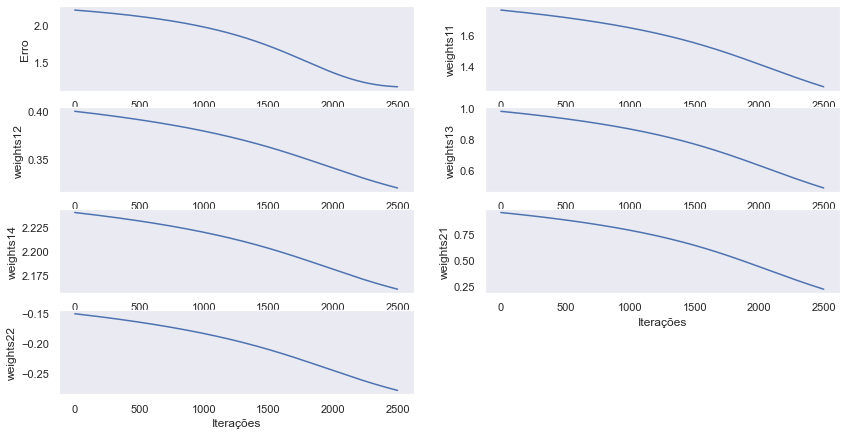

In [428]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 9))

plt.subplot(5,2,1)
plt.plot(net_error_total)
plt.grid()
plt.ylabel('Erro')
plt.xlabel('Iterações')


plt.subplot(5,2,2)
plt.plot(net_weights11)
plt.ylabel('weights11')
plt.xlabel('Iterações')
plt.grid()

plt.subplot(5,2,3)
plt.plot(net_weights12)
plt.ylabel('weights12')
plt.xlabel('Iterações')
plt.grid()

plt.subplot(5,2,4)
plt.plot(net_weights13)
plt.ylabel('weights13')
plt.xlabel('Iterações')
plt.grid()

plt.subplot(5,2,5)
plt.plot(net_weights14)
plt.ylabel('weights14')
plt.xlabel('Iterações')
plt.grid()

plt.subplot(5,2,6)
plt.plot(net_weights21)
plt.ylabel('weights21')
plt.xlabel('Iterações')
plt.grid()

plt.subplot(5,2,7)
plt.plot(net_weights22)
plt.ylabel('weights22')
plt.xlabel('Iterações')
plt.grid()

In [429]:
#tivacao = ['sigmoid','ReLU']
for i in range(10):
    pred = model._predict(input_vector[0:2,i],ativacao)
    print('pred= ', pred, 'target= ', target[i])

f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.77272727 0.42857143]
layer_1 dentro da função _predict=  [ 2.83113871 -0.02931246]
layer_2 dentro da função _predict=  [2.83113871 0.        ]
layer_3 dentro da função _predict=  [0.30572084]
layer_4 dentro da função _predict=  [0.57584042]
pred=  [0.57584042] target=  1.0
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.61818182 0.45      ]
layer_1 dentro da função _predict=  [ 2.64542872 -0.03230755]
layer_2 dentro da função _predict=  [2.64542872 0.        ]
layer_3 dentro da função _predict=  [0.26420864]
layer_4 dentro da função _predict=  [0.56567059]
pred=  [0.56567059] target=  0.0
f_ativacao=  ReLU
input_vector dentro da função _predict=  [0.45454545 0.57142857]
layer_1 dentro da função _predict=  [2.49652122 0.17775398]
layer_2 dentro da função _predict=  [2.49652122 0.17775398]
layer_3 dentro da função _predict=  [0.18152657]
layer_4 dentro da função _predict=  [0.54525743]
pred=  [0.54525743] target=

Normalização dos dados

In [430]:
import pandas as pd
import os
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data_s=scaler.fit_transform(df)
dfn = pd.DataFrame(data_s, columns = ['in1','in2','out'])

In [431]:
dfn

,in1,in2,out
0,0.772727,0.428571,1.0
1,0.618182,0.450000,0.0
2,0.454545,0.571429,0.0
3,0.000000,0.642857,0.0
4,0.909091,0.214286,1.0
5,0.000000,1.000000,0.0
6,0.636364,0.214286,1.0
7,0.681818,0.000000,1.0
8,1.000000,0.357143,1.0
9,0.681818,0.642857,0.0


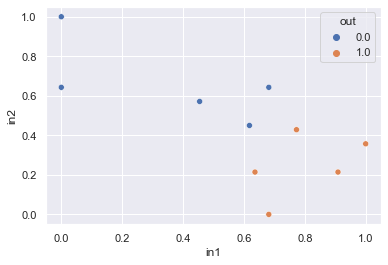

In [432]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.scatterplot(x='in1', y='in2', hue='out', data=dfn) 
plt.show()

Criação da classe mlp3

In [437]:
class mlp3(): 
    def __init__(self,lr):
        np.random.seed(0) 
        self.weights1 = np.array([[np.random.randn(), np.random.randn()],
                               [np.random.randn(), np.random.randn()]])        
        self.bias1 = np.array([np.random.randn(), np.random.randn()])
        self.weights2 = np.array([[np.random.randn(), np.random.randn()],
                               [np.random.randn(), np.random.randn()]])        
        self.bias2 = np.array([np.random.randn(), np.random.randn()])
        self.weights3 = np.array([np.random.randn(), np.random.randn()])        
        self.bias3 = np.array([np.random.randn()])
        self.learning_rate = lr
    
    #    #return weights, bias, learning_rate
        
    def _sigmoid(self, x):
        return 1 / (1 + np.exp(-x))
    
    def _sigmoid_deriv(self, x):
        return self._sigmoid(x) * (1 - self._sigmoid(x))
    
    def _tangent(self,x):
        return (np.exp(x)-np.exp(-x))/(np.exp(x)+np.exp(-x)) 
                
    def _tangent_deriv(self,x):
        return 1 - (self._tangent(x))**2
    
    def _ReLU(self,x):
      self.data = [max(0,value) for value in x]
      return np.array(self.data, dtype=float)
    
    def _der_ReLU(self,x):
        return [1 if value>0 else 0 for value in x]
    
    def _predict(self,input_vector,f_ativacao): 
        #print('f_ativacao= ',f_ativacao[0])
        #print('input_vector dentro da função _predict= ',input_vector)
        self.layer_1 = np.dot(input_vector, self.weights1) + self.bias1   
        #print('layer_1 dentro da função _predict= ',self.layer_1)
                 
        if f_ativacao[0] == 'sigmoide' or  f_ativacao[0] == '':
            self.layer_2 = self._sigmoid(self.layer_1)                    
        elif f_ativacao[0] == 'ReLU':
            self.layer_2 = self._ReLU(self.layer_1)
        else:
            self.layer_2 = self._tangent(self.layer_1)
        
        #print('layer_2 dentro da função _predict= ',self.layer_2)    
        
        self.layer_3 = np.dot(self.layer_2, self.weights2) + self.bias2
        #print('layer_3 dentro da função _predict= ',self.layer_3)
        
        if f_ativacao[1] == 'sigmoide' or  f_ativacao == '':
            self.layer_4 = self._sigmoid(self.layer_3)
        
        elif f_ativacao[1] == 'ReLU':
            self.layer_4 = self._ReLU(self.layer_3)
        else:
            self.layer_4 = self._tangent(self.layer_3)
        
        #print('layer_4 dentro da função _predict= ',self.layer_4)
        self.layer_5 = np.dot(self.layer_4, self.weights3) + self.bias3
        #print('layer_3 dentro da função _predict= ',self.layer_3)
        
        if f_ativacao[1] == 'sigmoide' or  f_ativacao == '':
            self.layer_6 = self._sigmoid(self.layer_5)
        
        elif f_ativacao[1] == 'ReLU':
            self.layer_6 = self._ReLU(self.layer_5)
        else:
            self.layer_6 = self._tangent(self.layer_5)
        
        self.prediction =self.layer_6
         
        return self.prediction
    
    def _erro(self,target):
        self.error = (1/2)*(target - self.prediction) ** 2    
        return self.error

    def _compute_gradients(self,input_vector, target, f_ativacao): 
        if f_ativacao[0] == 'sigmoide' or  f_ativacao[0] == '':
            dprediction_dlayer1 = self._sigmoid_deriv(self.layer_1)            
        elif f_ativacao[0] == 'ReLU':
            dprediction_dlayer1 = self._der_ReLU(self.layer_1)            
        else:
            dprediction_dlayer1 = self._tangent_deriv(self.layer_1)
            
            
        if f_ativacao[1] == 'sigmoide' or  f_ativacao[1] == '':            
            dprediction_dlayer3 = self._sigmoid_deriv(self.layer_3)
        elif f_ativacao[1] == 'ReLU':            
            dprediction_dlayer3 = self._der_ReLU(self.layer_3)
        else:            
            dprediction_dlayer3 = self._tangent_deriv(self.layer_3)
        
        
        if f_ativacao[2] == 'sigmoide' or  f_ativacao[2] == '':            
            dprediction_dlayer5 = self._sigmoid_deriv(self.layer_5)
        elif f_ativacao[1] == 'ReLU':            
            dprediction_dlayer5 = self._der_ReLU(self.layer_5)
        else:            
            dprediction_dlayer5 = self._tangent_deriv(self.layer_5)
        
        derror_dprediction = self.prediction - target        
        dlayer1_dbias = 1
        dlayer1_dweights = (0 * self.weights1) + (1 * input_vector)
        dlayer3_dbias = 1
        dlayer3_dweights = (0 * self.weights2) + (1 * self.layer_2)
        dlayer5_dbias = 1
        dlayer5_dweights = (0 * self.weights3) + (1 * self.layer_3)
        
        self.derror_dweights3 = derror_dprediction*dprediction_dlayer5*dlayer5_dweights
        self.derror_dbias3 = derror_dprediction*dprediction_dlayer5*dlayer5_dbias
        
        self.derror_dweights2 = derror_dprediction*dprediction_dlayer3*dlayer3_dweights
        self.derror_dbias2 = derror_dprediction*dprediction_dlayer3*dlayer3_dbias 
        
        self.derror_dweights1 = self.derror_dweights2*dprediction_dlayer1*dlayer1_dweights
        self.derror_dbias1 = self.derror_dbias2*dprediction_dlayer1*dlayer1_dbias        
                
        
        return self.derror_dweights1, self.derror_dbias1, self.derror_dweights2, self.derror_dbias2,self.derror_dweights3, self.derror_dbias3
    def _update_parameters(self):
        self.bias1 = self.bias1 - (self.derror_dbias1 * self.learning_rate)        
        self.weights1 = self.weights1 - (self.derror_dweights1 * self.learning_rate)  
        self.bias2 = self.bias2 - (self.derror_dbias2 * self.learning_rate)        
        self.weights2 = self.weights2 - (self.derror_dweights2 * self.learning_rate) 
        self.bias3 = self.bias3 - (self.derror_dbias3 * self.learning_rate)        
        self.weights3 = self.weights3 - (self.derror_dweights3 * self.learning_rate) 
        return self.bias1, self.weights1,self.bias2, self.weights2,self.bias3, self.weights3

In [438]:
import pandas as pd
learning_rate = 0.001
model = mlp3(learning_rate)
ativacao = ['ReLU', 'ReLU', 'sigmoide']
target = np.array(df['out'])
input_vector = np.array([dfn['in1'],dfn['in2']])
gradiente = 0
derror_dweights1 = []
derror_dbias1 = []
derror_dweights2 = []
derror_dbias2 = []
derror_dweights3 = []
derror_dbias3 = []
net_error_total = []
net_weights11 = []
net_weights12 = []
net_weights13 = []
net_weights14 = []
net_weights21 = []
net_weights22 = []
net_weights23 = []
net_weights24 = []
net_weights31 = []
net_weights32 = []
net_bias11 = []
net_bias12 = []
net_bias21 = []
net_bias22 = []
net_bias31 = []
for k in range(250):
    gradiente = 0
    derror_dweights1 = 0
    derror_dbias1 = 0
    derror_dweights2 = 0
    derror_dbias2 = 0
    derror_dweights3 = 0
    derror_dbias3 = 0
    error_total = 0
    pred_final =[]
    for i in range(10): 
        print('input_vector[',i,']=',input_vector[0:2,i])
        pred =model._predict(input_vector[0:2,i],ativacao)
        pred_final.append(pred)        
        prediction = pred  
        print('prediction=', prediction, 'target=',target[i])
        error = model._erro(target[i])  
        print('error= ',error)
        error_total = error_total + error         
        grad = model._compute_gradients(input_vector[0:2,i], target[i], ativacao)
        derror_dweights1 = derror_dweights1 + grad[0]
        derror_dbias1 = derror_dbias1 +grad[1] 
        derror_dweights2 = derror_dweights2 + grad[2]
        derror_dbias2 = derror_dbias2 +grad[3]
        print('derror_dweights3= ',derror_dweights3)
        derror_dweights3 = derror_dweights3 + grad[4]
        derror_dbias3 = derror_dbias3 +grad[5]
    net_error_total.append(error_total)
    atualiza = model._update_parameters()
    bias1 = atualiza[0]
    weights1 = atualiza[1]
    bias2 = atualiza[2]
    weights2 = atualiza[3]
    bias3 = atualiza[4]
    weights3 = atualiza[5]
    net_weights1.append(weights[0])
    net_weights2.append(weights[1])
    net_bias.append(bias)
    
    net_weights11.append(weights1[0][0])
    net_weights12.append(weights1[0][1])
    net_weights13.append(weights1[1][0])
    net_weights14.append(weights1[1][1])
    net_weights21.append(weights1[0][0])
    net_weights22.append(weights1[0][1])
    net_weights23.append(weights1[1][0])
    net_weights24.append(weights1[1][1])
    net_weights31.append(weights2[0]) 
    net_weights32.append(weights2[1])
    net_bias11.append(bias1[0])
    net_bias12.append(bias1[1])
    net_bias21.append(bias2[0])
    net_bias22.append(bias2[1])
    net_bias31.append(bias3[0])

input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [3.29410482] target= 1.0
error=  [2.63145845]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [3.11717591] target= 0.0
error=  [4.85839282]
derror_dweights3=  [0.28344248 0.08086019]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [2.99160877] target= 0.0
error=  [4.47486151]
derror_dweights3=  [0.70673594 0.21430179]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [2.47648659] target= 0.0
error=  [3.06649292]
derror_dweights3=  [1.13727181 0.37292257]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [3.32418233] target= 1.0
error=  [2.70091175]
derror_dweights3=  [1.57442109 0.59723977]
input_vector[ 5 ]= [0. 1.]
prediction= [2.69990765] target= 0.0
error=  [3.64475065]
derror_dweights3=  [1.85829829 0.66718069]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [2.98517794] target= 1.0
error=  [1.97046573]
derror_dweights3=  [2.29132813 0.91291337]
input_vector[ 7 ]= [0.68181818

input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [2.6666131] target= 1.0
error=  [1.38879961]
derror_dweights3=  [2.61552219 1.06905226]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [3.21971139] target= 1.0
error=  [2.46355933]
derror_dweights3=  [2.89720171 1.16388719]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [2.99549874] target= 0.0
error=  [4.48650636]
derror_dweights3=  [3.18611551 1.23506748]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [2.96028429] target= 1.0
error=  [1.92135725]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [2.8053327] target= 0.0
error=  [3.93494579]
derror_dweights3=  [0.2910915  0.08612511]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [2.67931073] target= 0.0
error=  [3.589353]
derror_dweights3=  [0.73785286 0.23311174]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [2.22680859] target= 0.0
error=  [2.47933825]
derror_dweights3=  [1.18494928 0.4076041 ]
input_vector[ 4 ]=

input_vector[ 8 ]= [1.         0.35714286]
prediction= [2.91505683] target= 1.0
error=  [1.83372132]
derror_dweights3=  [2.8250105  1.20733673]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [2.67950627] target= 0.0
error=  [3.58987694]
derror_dweights3=  [3.11899392 1.28153277]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [2.68195395] target= 1.0
error=  [1.41448455]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [2.54517971] target= 0.0
error=  [3.23896988]
derror_dweights3=  [0.28525725 0.08765754]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [2.41856585] target= 0.0
error=  [2.92473039]
derror_dweights3=  [0.73886564 0.24357542]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [2.01783811] target= 0.0
error=  [2.03583533]
derror_dweights3=  [1.18503536 0.42827072]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [2.73789058] target= 1.0
error=  [1.51013183]
derror_dweights3=  [1.58365061 0.66584122]
input_vector[ 

derror_dweights3=  [1.79393807 0.75001017]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [2.27368359] target= 1.0
error=  [0.81113494]
derror_dweights3=  [2.15501447 1.03734464]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [2.21781441] target= 1.0
error=  [0.74153596]
derror_dweights3=  [2.4039503  1.12511414]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [2.62527984] target= 1.0
error=  [1.32076728]
derror_dweights3=  [2.64461094 1.21509093]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [2.37849823] target= 0.0
error=  [2.82862692]
derror_dweights3=  [2.93029098 1.28933905]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [2.41655441] target= 1.0
error=  [1.00331319]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [2.29697533] target= 0.0
error=  [2.63804784]
derror_dweights3=  [0.26669379 0.08570289]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [2.169593] target= 0.0
error=  [2.35356689]
derror_dweights3

derror_dweights3=  [1.97056428 1.02275748]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [2.03017084] target= 1.0
error=  [0.53062598]
derror_dweights3=  [2.19101391 1.10512648]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [2.38402122] target= 1.0
error=  [0.95775737]
derror_dweights3=  [2.40264091 1.18892223]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [2.12749443] target= 0.0
error=  [2.26311627]
derror_dweights3=  [2.66943146 1.26044336]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [2.19506638] target= 1.0
error=  [0.71409183]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [2.08972432] target= 0.0
error=  [2.18347387]
derror_dweights3=  [0.24036347 0.08087884]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.96152105] target= 0.0
error=  [1.92378241]
derror_dweights3=  [0.66692121 0.24339716]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [1.65027319] target= 0.0
error=  [1.36170081]
derror_dweight

prediction= [1.9156872] target= 0.0
error=  [1.83492873]
derror_dweights3=  [2.37547786 1.20631854]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [2.00806725] target= 1.0
error=  [0.50809979]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.91465799] target= 0.0
error=  [1.83295761]
derror_dweights3=  [0.21042066 0.07421657]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.78560718] target= 0.0
error=  [1.5941965]
derror_dweights3=  [0.61084534 0.23501311]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [1.50830838] target= 0.0
error=  [1.13749708]
derror_dweights3=  [0.97938618 0.42318694]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [2.07143104] target= 1.0
error=  [0.57398224]
derror_dweights3=  [1.26686459 0.64540999]
input_vector[ 5 ]= [0. 1.]
prediction= [1.39926642] target= 0.0
error=  [0.97897326]
derror_dweights3=  [1.48994273 0.71396445]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [1.89005873] target=

input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.76525438] target= 0.0
error=  [1.55806151]
derror_dweights3=  [0.17982226 0.0665419 ]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.63534397] target= 0.0
error=  [1.33717496]
derror_dweights3=  [0.55067418 0.22358684]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [1.38679954] target= 0.0
error=  [0.96160649]
derror_dweights3=  [0.88376593 0.40642416]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.90955819] target= 1.0
error=  [0.41364805]
derror_dweights3=  [1.13567519 0.61907673]
input_vector[ 5 ]= [0. 1.]
prediction= [1.23592488] target= 0.0
error=  [0.76375516]
derror_dweights3=  [1.32923488 0.68171928]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [1.74746506] target= 1.0
error=  [0.27935201]
derror_dweights3=  [1.52333633 0.93335889]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [1.71366073] target= 1.0
error=  [0.25465582]
derror_dweights3=  [1.68021037 0.99987625]
input_ve

error=  [0.82156839]
derror_dweights3=  [0.78857179 0.38646008]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.76865491] target= 1.0
error=  [0.29541518]
derror_dweights3=  [1.00797007 0.58891823]
input_vector[ 5 ]= [0. 1.]
prediction= [1.09471775] target= 0.0
error=  [0.59920348]
derror_dweights3=  [1.17229927 0.64500446]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [1.62309805] target= 1.0
error=  [0.19412559]
derror_dweights3=  [1.32088474 0.87769732]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [1.59391429] target= 1.0
error=  [0.17636709]
derror_dweights3=  [1.45006498 0.93590963]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [1.8419055] target= 1.0
error=  [0.35440243]
derror_dweights3=  [1.57208582 0.99403324]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [1.56163412] target= 0.0
error=  [1.21935056]
derror_dweights3=  [1.75337144 1.04801066]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [1.69539616] target= 1.0
error=  [

derror_dweights3=  [1.23852584 0.86916689]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [1.71523157] target= 1.0
error=  [0.2557781]
derror_dweights3=  [1.33633533 0.91867824]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [1.42888362] target= 0.0
error=  [1.0208542]
derror_dweights3=  [1.49022903 0.96616179]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [1.57818667] target= 1.0
error=  [0.16714991]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.51187301] target= 0.0
error=  [1.14288]
derror_dweights3=  [0.12022671 0.04938803]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.38013349] target= 0.0
error=  [0.95238423]
derror_dweights3=  [0.4266517  0.19486251]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [1.17985715] target= 0.0
error=  [0.69603144]
derror_dweights3=  [0.68696799 0.36219297]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.63065794] target= 1.0
error=  [0.19886472]
derror_dweights3=  

input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [1.34028829] target= 0.0
error=  [0.89818635]
derror_dweights3=  [1.31024254 0.90494176]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [1.49999042] target= 1.0
error=  [0.12499521]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.43855127] target= 0.0
error=  [1.03471488]
derror_dweights3=  [0.10205694 0.04352928]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.30617294] target= 0.0
error=  [0.85304388]
derror_dweights3=  [0.38695187 0.18440539]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [1.11973976] target= 0.0
error=  [0.62690856]
derror_dweights3=  [0.62394884 0.34571118]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.54878073] target= 1.0
error=  [0.15058014]
derror_dweights3=  [0.79144543 0.5290173 ]
input_vector[ 5 ]= [0. 1.]
prediction= [0.87622343] target= 0.0
error=  [0.38388375]
derror_dweights3=  [0.90573015 0.57226315]
input_vector[ 6 ]= [0.63636364

input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.35102875] target= 0.0
error=  [0.91263934]
derror_dweights3=  [0.08042593 0.03608403]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.21780867] target= 0.0
error=  [0.74152898]
derror_dweights3=  [0.33829414 0.17075091]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [1.04782314] target= 0.0
error=  [0.54896667]
derror_dweights3=  [0.54663252 0.32398689]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.45026398] target= 1.0
error=  [0.10136883]
derror_dweights3=  [0.69108246 0.49755257]
input_vector[ 5 ]= [0. 1.]
prediction= [0.77907206] target= 0.0
error=  [0.30347664]
derror_dweights3=  [0.78225389 0.53406962]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [1.34115508] target= 1.0
error=  [0.0581934]
derror_dweights3=  [0.83637806 0.71076154]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [1.32149562] target= 1.0
error=  [0.05167972]
derror_dweights3=  [0.90101907 0.74562397]
input_vec

error=  [0.03706268]
derror_dweights3=  [0.72032816 0.66264853]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [1.25471207] target= 1.0
error=  [0.03243912]
derror_dweights3=  [0.7699428  0.69095182]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [1.429035] target= 1.0
error=  [0.09203552]
derror_dweights3=  [0.8156549  0.71842311]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [1.1407542] target= 0.0
error=  [0.65066008]
derror_dweights3=  [0.9027485  0.74916024]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [1.32401814] target= 1.0
error=  [0.05249388]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.27348406] target= 0.0
error=  [0.81088083]
derror_dweights3=  [0.0616944  0.02913301]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.13943644] target= 0.0
error=  [0.6491577]
derror_dweights3=  [0.29466831 0.15766662]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.98395226] target= 0.0
error=  [0.4840810

input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [1.05716018] target= 0.0
error=  [0.55879383]
derror_dweights3=  [0.73807624 0.67708491]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [1.25038126] target= 1.0
error=  [0.03134539]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.20438367] target= 0.0
error=  [0.72527001]
derror_dweights3=  [0.04567086 0.02271068]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [1.06952521] target= 0.0
error=  [0.57194209]
derror_dweights3=  [0.25594188 0.1453048 ]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.92690584] target= 0.0
error=  [0.42957721]
derror_dweights3=  [0.41542527 0.28299961]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.28307354] target= 1.0
error=  [0.04006531]
derror_dweights3=  [0.52213988 0.43864879]
input_vector[ 5 ]= [0. 1.]
prediction= [0.61528089] target= 0.0
error=  [0.18928529]
derror_dweights3=  [0.57518321 0.46253994]
input_vector[ 6 ]= [0.63636364

error=  [0.38341886]
derror_dweights3=  [0.36083145 0.26417676]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.21161034] target= 1.0
error=  [0.02238947]
derror_dweights3=  [0.45224105 0.41171952]
input_vector[ 5 ]= [0. 1.]
prediction= [0.54569445] target= 0.0
error=  [0.14889121]
derror_dweights3=  [0.49006636 0.42982019]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [1.12889703] target= 1.0
error=  [0.00830722]
derror_dweights3=  [0.49308008 0.55572924]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [1.11544941] target= 1.0
error=  [0.00666428]
derror_dweights3=  [0.51411497 0.56952503]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [1.25733689] target= 1.0
error=  [0.03311114]
derror_dweights3=  [0.53264033 0.5823006 ]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.97340594] target= 0.0
error=  [0.47375957]
derror_dweights3=  [0.5806215  0.60141761]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [1.1766741] target= 1.0
error=  [

error=  [0.00175113]
derror_dweights3=  [0.41977675 0.52665222]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [1.18836932] target= 1.0
error=  [0.0177415]
derror_dweights3=  [0.42873138 0.53325236]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.9067638] target= 0.0
error=  [0.4111103]
derror_dweights3=  [0.4621958  0.54740058]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [1.11808783] target= 1.0
error=  [0.00697237]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.08020067] target= 0.0
error=  [0.58341674]
derror_dweights3=  [0.01942361 0.01079878]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.94368322] target= 0.0
error=  [0.44526901]
derror_dweights3=  [0.18839337 0.12169507]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.824046] target= 0.0
error=  [0.3395259]
derror_dweights3=  [0.30722293 0.24446364]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.13910552] target= 1.0
error=  [0.00967517]

prediction= [1.06510916] target= 1.0
error=  [0.0021196]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [1.03045587] target= 0.0
error=  [0.53091965]
derror_dweights3=  [0.01015712 0.00595617]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.89319071] target= 0.0
error=  [0.39889482]
derror_dweights3=  [0.16266297 0.11183772]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.78270982] target= 0.0
error=  [0.30631733]
derror_dweights3=  [0.26578344 0.22823819]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.08073508] target= 1.0
error=  [0.00325908]
derror_dweights3=  [0.33094003 0.36040192]
input_vector[ 5 ]= [0. 1.]
prediction= [0.51996875] target= 0.0
error=  [0.13518375]
derror_dweights3=  [0.34380876 0.36743716]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [1.01212414] target= 1.0
error=  [7.34973951e-05]
derror_dweights3=  [0.3269103  0.48436096]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [1.00170425] ta

error=  [0.48799455]
derror_dweights3=  [0.00326306 0.0020107 ]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.85280301] target= 0.0
error=  [0.36363648]
derror_dweights3=  [0.14174173 0.10391081]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.74961871] target= 0.0
error=  [0.28096411]
derror_dweights3=  [0.23265978 0.21508418]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [1.03377413] target= 1.0
error=  [0.00057035]
derror_dweights3=  [0.2890574  0.34159929]
input_vector[ 5 ]= [0. 1.]
prediction= [0.51688545] target= 0.0
error=  [0.13358528]
derror_dweights3=  [0.29416798 0.34455623]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.97015486] target= 1.0
error=  [0.00044537]
derror_dweights3=  [0.27031935 0.45951147]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.96075077] target= 1.0
error=  [0.00077025]
derror_dweights3=  [0.26627009 0.45624839]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [1.06831876] target= 1.0
error=  

derror_dweights3=  [0.21258484 0.43276567]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.91749766] target= 1.0
error=  [0.00340332]
derror_dweights3=  [0.20318591 0.42463037]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [1.0158095] target= 1.0
error=  [0.00012497]
derror_dweights3=  [0.19291393 0.41531093]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.74159934] target= 0.0
error=  [0.27498479]
derror_dweights3=  [0.19528533 0.41651991]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.96736757] target= 1.0
error=  [0.00053244]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.93641495] target= 0.0
error=  [0.43843648]
derror_dweights3=  [-0.00450918 -0.00300257]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.80543577] target= 0.0
error=  [0.32436339]
derror_dweights3=  [0.11722447 0.09411291]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.71077777] target= 0.0
error=  [0.25260252]
derror_dweigh

prediction= [0.94421933] target= 1.0
error=  [0.00155574]
derror_dweights3=  [0.2126546  0.30458999]
input_vector[ 5 ]= [0. 1.]
prediction= [0.51090553] target= 0.0
error=  [0.13051223]
derror_dweights3=  [0.20516572 0.29967694]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.89001457] target= 1.0
error=  [0.0060484]
derror_dweights3=  [0.16832236 0.41091078]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.88243872] target= 1.0
error=  [0.00691033]
derror_dweights3=  [0.15520919 0.39881156]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.97336089] target= 1.0
error=  [0.00035482]
derror_dweights3=  [0.14144828 0.38551078]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.70133716] target= 0.0
error=  [0.2459369]
derror_dweights3=  [0.13766678 0.38346902]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.92831859] target= 1.0
error=  [0.00256911]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.89956785] target=

prediction= [0.86523538] target= 0.0
error=  [0.37431613]
derror_dweights3=  [-0.01324781 -0.00999421]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.74047905] target= 0.0
error=  [0.27415461]
derror_dweights3=  [0.08607507 0.08023201]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.65745827] target= 0.0
error=  [0.21612569]
derror_dweights3=  [0.1452636  0.17635867]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.90178163] target= 1.0
error=  [0.00482342]
derror_dweights3=  [0.17924225 0.28676979]
input_vector[ 5 ]= [0. 1.]
prediction= [0.50802706] target= 0.0
error=  [0.12904575]
derror_dweights3=  [0.16692343 0.27810625]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.85198889] target= 1.0
error=  [0.01095364]
derror_dweights3=  [0.12404675 0.38759267]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.84522766] target= 1.0
error=  [0.01197724]
derror_dweights3=  [0.10764152 0.37128101]
input_vector[ 8 ]= [1.         0.35714286]
predic

derror_dweights3=  [0.14182437 0.26292469]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.82534665] target= 1.0
error=  [0.0152519]
derror_dweights3=  [0.09477332 0.3711942 ]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.81913532] target= 1.0
error=  [0.01635602]
derror_dweights3=  [0.07647972 0.35193053]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.89697648] target= 1.0
error=  [0.00530692]
derror_dweights3=  [0.05788644 0.33144225]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.62927748] target= 0.0
error=  [0.19799507]
derror_dweights3=  [0.04487895 0.32353124]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.85799675] target= 1.0
error=  [0.01008246]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.83318267] target= 0.0
error=  [0.34709668]
derror_dweights3=  [-0.01634534 -0.01315334]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.71142751] target= 0.0
error=  [0.25306455]
derror_dweigh

input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.68065839] target= 0.0
error=  [0.23164792]
derror_dweights3=  [0.06048474 0.06705679]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.60829792] target= 0.0
error=  [0.18501318]
derror_dweights3=  [0.10441956 0.15494186]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.83056841] target= 1.0
error=  [0.01435353]
derror_dweights3=  [0.12779592 0.25659759]
input_vector[ 5 ]= [0. 1.]
prediction= [0.50313437] target= 0.0
error=  [0.1265721]
derror_dweights3=  [0.10923502 0.24164641]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.78810581] target= 1.0
error=  [0.02244957]
derror_dweights3=  [0.05642391 0.34822559]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.78263366] target= 1.0
error=  [0.02362406]
derror_dweights3=  [0.03609729 0.32484155]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.85308877] target= 1.0
error=  [0.01079145]
derror_dweights3=  [0.0156359  0.30022449]
input_vec

prediction= [0.76119515] target= 1.0
error=  [0.02851388]
derror_dweights3=  [0.03067348 0.33161877]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.75623538] target= 1.0
error=  [0.0297106]
derror_dweights3=  [0.00933605 0.30526615]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.8214217] target= 1.0
error=  [0.01594511]
derror_dweights3=  [-0.01203355  0.27767669]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.55851812] target= 0.0
error=  [0.15597125]
derror_dweights3=  [-0.03153999  0.2639776 ]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.78836897] target= 1.0
error=  [0.02239385]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.76741545] target= 0.0
error=  [0.29446323]
derror_dweights3=  [-0.02091264 -0.01962717]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.65222476] target= 0.0
error=  [0.21269857]
derror_dweights3=  [0.04953708 0.06068325]
input_vector[ 3 ]= [0.         0.64285714]
prediction

input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.6322893] target= 0.0
error=  [0.19989488]
derror_dweights3=  [0.04237701 0.05617785]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.56850873] target= 0.0
error=  [0.16160109]
derror_dweights3=  [0.07497851 0.13732673]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.77246966] target= 1.0
error=  [0.02588503]
derror_dweights3=  [0.09054964 0.23184465]
input_vector[ 5 ]= [0. 1.]
prediction= [0.49908679] target= 0.0
error=  [0.12454381]
derror_dweights3=  [0.06878559 0.21179847]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.73591723] target= 1.0
error=  [0.03486985]
derror_dweights3=  [0.00805396 0.3160307 ]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.73142178] target= 1.0
error=  [0.03606713]
derror_dweights3=  [-0.01386973  0.28689981]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.79171215] target= 1.0
error=  [0.02169191]
derror_dweights3=  [-0.0357419   0.25653017]
input

input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.71718655] target= 0.0
error=  [0.25717827]
derror_dweights3=  [-0.02266265 -0.02454064]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.6073944] target= 0.0
error=  [0.18446398]
derror_dweights3=  [0.03407078 0.05051395]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.54801604] target= 0.0
error=  [0.15016079]
derror_dweights3=  [0.06122111 0.12818022]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.74237399] target= 1.0
error=  [0.03318558]
derror_dweights3=  [0.07306008 0.21901118]
input_vector[ 5 ]= [0. 1.]
prediction= [0.4969711] target= 0.0
error=  [0.12349014]
derror_dweights3=  [0.05035387 0.19634768]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.7088577] target= 1.0
error=  [0.04238192]
derror_dweights3=  [-0.01441275  0.2993735 ]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.70484078] target= 1.0
error=  [0.04355948]
derror_dweights3=  [-0.0365623  0.2672827]
input_v

input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.48059532] target= 0.0
error=  [0.11548593]
derror_dweights3=  [-0.09636425  0.19801034]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.71098075] target= 1.0
error=  [0.04176606]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.69427312] target= 0.0
error=  [0.24100758]
derror_dweights3=  [-0.02293114 -0.02676686]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.58705921] target= 0.0
error=  [0.17231926]
derror_dweights3=  [0.02783751 0.04586007]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.53126987] target= 0.0
error=  [0.14112384]
derror_dweights3=  [0.05073908 0.12067723]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.7176884] target= 1.0
error=  [0.03984992]
derror_dweights3=  [0.05967924 0.20849243]
input_vector[ 5 ]= [0. 1.]
prediction= [0.49522635] target= 0.0
error=  [0.12262457]
derror_dweights3=  [0.03658229 0.18369679]
input_vector[ 6 ]= [0.63636

derror_dweights3=  [-0.04434747  0.27469984]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.6652791] target= 1.0
error=  [0.05601904]
derror_dweights3=  [-0.06604006  0.23824203]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.71279187] target= 1.0
error=  [0.04124426]
derror_dweights3=  [-0.0875178   0.20054876]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.460118] target= 0.0
error=  [0.10585429]
derror_dweights3=  [-0.11114923  0.17865853]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.69109738] target= 1.0
error=  [0.04771042]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.6754607] target= 0.0
error=  [0.22812358]
derror_dweights3=  [-0.02291494 -0.0285227 ]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.57074477] target= 0.0
error=  [0.1628748]
derror_dweights3=  [0.02314751 0.04196822]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.51782639] target= 0.0
error=  [0.13407208]
derror_dw

input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.51625084] target= 0.0
error=  [0.13325746]
derror_dweights3=  [0.04182789 0.11195832]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.69285463] target= 1.0
error=  [0.04716914]
derror_dweights3=  [0.04857976 0.19623332]
input_vector[ 5 ]= [0. 1.]
prediction= [0.49170653] target= 0.0
error=  [0.12088766]
derror_dweights3=  [0.02530894 0.16974046]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.664141] target= 1.0
error=  [0.05640063]
derror_dweights3=  [-0.04513907  0.26960942]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.66084697] target= 1.0
error=  [0.05751239]
derror_dweights3=  [-0.06687199  0.2331129 ]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.70781226] target= 1.0
error=  [0.04268684]
derror_dweights3=  [-0.08838274  0.19537841]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.45816151] target= 0.0
error=  [0.10495599]
derror_dweights3=  [-0.11217509  0.17354257]
in

input_vector[ 5 ]= [0. 1.]
prediction= [0.48986317] target= 0.0
error=  [0.11998296]
derror_dweights3=  [0.02587759 0.16771863]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.66260397] target= 1.0
error=  [0.05691804]
derror_dweights3=  [-0.04392828  0.26635921]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.65930996] target= 1.0
error=  [0.05803485]
derror_dweights3=  [-0.0657714   0.23014179]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.70627499] target= 1.0
error=  [0.04313719]
derror_dweights3=  [-0.08739022  0.19268345]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.45658507] target= 0.0
error=  [0.10423496]
derror_dweights3=  [-0.11132023  0.17115829]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.681874] target= 1.0
error=  [0.05060207]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.66658325] target= 0.0
error=  [0.22216662]
derror_dweights3=  [-0.02308373 -0.02854217]
input_vector[ 2 ]= [0.

derror_dweights3=  [-0.04486507  0.26191016]
input_vector[ 7 ]= [0.68181818 0.        ]
prediction= [0.65514915] target= 1.0
error=  [0.05946105]
derror_dweights3=  [-0.06672204  0.22563177]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.70157143] target= 1.0
error=  [0.0445298]
derror_dweights3=  [-0.08834796  0.18811025]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.45476905] target= 0.0
error=  [0.10340744]
derror_dweights3=  [-0.11240522  0.16661504]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.68035525] target= 1.0
error=  [0.05108638]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.66506447] target= 0.0
error=  [0.22115537]
derror_dweights3=  [-0.02320549 -0.02823872]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.56804727] target= 0.0
error=  [0.16133885]
derror_dweights3=  [0.02113829 0.03860285]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.51554232] target= 0.0
error=  [0.13289194]
derro

derror_dweights3=  [-0.1135552   0.16250584]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.67613476] target= 1.0
error=  [0.05244435]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.66101507] target= 0.0
error=  [0.21847046]
derror_dweights3=  [-0.02324737 -0.02829074]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.56609176] target= 0.0
error=  [0.16022994]
derror_dweights3=  [0.02031021 0.03751207]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.51392235] target= 0.0
error=  [0.13205809]
derror_dweights3=  [0.04019248 0.10575075]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.68229143] target= 1.0
error=  [0.05046937]
derror_dweights3=  [0.04734388 0.18739632]
input_vector[ 5 ]= [0. 1.]
prediction= [0.4863149] target= 0.0
error=  [0.11825109]
derror_dweights3=  [0.02378302 0.16121118]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.65421913] target= 1.0
error=  [0.0597822]
derror_dweights3=  [-0.04576

prediction= [0.69269092] target= 1.0
error=  [0.04721944]
derror_dweights3=  [-0.09040506  0.17998905]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.45197404] target= 0.0
error=  [0.10214027]
derror_dweights3=  [-0.1146487   0.15849374]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.67194322] target= 1.0
error=  [0.05381063]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.65699348] target= 0.0
error=  [0.21582022]
derror_dweights3=  [-0.02328092 -0.02833371]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.56416085] target= 0.0
error=  [0.15913873]
derror_dweights3=  [0.0194999  0.03644426]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.51232518] target= 0.0
error=  [0.13123855]
derror_dweights3=  [0.03922048 0.10374423]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.67803997] target= 1.0
error=  [0.05182913]
derror_dweights3=  [0.04631263 0.18454095]
input_vector[ 5 ]= [0. 1.]
prediction= [0.48482539]

derror_dweights3=  [-0.06788085  0.21535795]
input_vector[ 8 ]= [1.         0.35714286]
prediction= [0.69142246] target= 1.0
error=  [0.04761005]
derror_dweights3=  [-0.08955587  0.17790855]
input_vector[ 9 ]= [0.68181818 0.64285714]
prediction= [0.45055389] target= 0.0
error=  [0.1014994]
derror_dweights3=  [-0.11390986  0.15669693]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.67067622] target= 1.0
error=  [0.05422708]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.65572626] target= 0.0
error=  [0.21498847]
derror_dweights3=  [-0.02338042 -0.02806267]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.56495905] target= 0.0
error=  [0.15958937]
derror_dweights3=  [0.01933504 0.03585692]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.51297389] target= 0.0
error=  [0.1315711]
derror_dweights3=  [0.03947075 0.10245084]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.67677305] target= 1.0
error=  [0.05223783]
derror_d

error=  [0.10088618]
derror_dweights3=  [-0.11494528  0.15284171]
input_vector[ 0 ]= [0.77272727 0.42857143]
prediction= [0.66652302] target= 1.0
error=  [0.05560345]
derror_dweights3=  0
input_vector[ 1 ]= [0.61818182 0.45      ]
prediction= [0.65174188] target= 0.0
error=  [0.21238374]
derror_dweights3=  [-0.02340382 -0.0280923 ]
input_vector[ 2 ]= [0.45454545 0.57142857]
prediction= [0.56305654] target= 0.0
error=  [0.15851633]
derror_dweights3=  [0.01854511 0.03482722]
input_vector[ 3 ]= [0.         0.64285714]
prediction= [0.51140496] target= 0.0
error=  [0.13076751]
derror_dweights3=  [0.03851979 0.10050415]
input_vector[ 4 ]= [0.90909091 0.21428571]
prediction= [0.67256017] target= 1.0
error=  [0.05360842]
derror_dweights3=  [0.04589581 0.17990172]
input_vector[ 5 ]= [0. 1.]
prediction= [0.48185563] target= 0.0
error=  [0.11609242]
derror_dweights3=  [0.02214369 0.15395301]
input_vector[ 6 ]= [0.63636364 0.21428571]
prediction= [0.64511998] target= 1.0
error=  [0.06296991]
derro

Text(0.5, 0, 'Iterações')

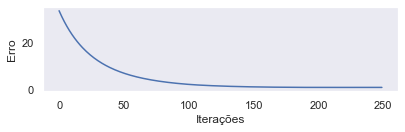

In [439]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 9))

plt.subplot(5,2,1)
plt.plot(net_error_total)
plt.grid()
plt.ylabel('Erro')
plt.xlabel('Iterações')

In [440]:
#tivacao = ['sigmoid','ReLU']
for i in range(10):
    pred = model._predict(input_vector[0:2,i],ativacao)
    print('pred= ', pred, 'target= ', target[i])

pred=  [0.66260446] target=  1.0
pred=  [0.64799108] target=  0.0
pred=  [0.56104271] target=  0.0
pred=  [0.50974733] target=  0.0
pred=  [0.66858209] target=  1.0
pred=  [0.48065652] target=  0.0
pred=  [0.64145509] target=  1.0
pred=  [0.63839039] target=  1.0
pred=  [0.68268167] target=  1.0
pred=  [0.44784101] target=  0.0
